It has become fairly clear that I should at least look into labeling the ground truth a different way. With other maps, I can see that some observations aren't labeled as forest-fires that probably should be, or at least from a business/real-world perspective. I can see that some observations aren't labeled as forest-fires because they don't fall within a fire-perimeter boundary on that given day, but they do fall within a fire-perimeter boundary days later. In terms of training a model, I think it's reasonable that we should train it to identify these observations as forest fires. Given that they do fall within a fire-perimter boundary within a couple of days, it's highly likely that they were forest-fire observations, and either fire-perimeter boundaries weren't submitted for that day for that area, or the fire wasn't seen (meaning no perimeter boundary drawn around it). In either case, I think it's reasonable to label these as forest-fires and see. 

Another case where it's reasonable to label observations as forest-fires is for those that fall near a fire perimeter boundary (e.g. within 100m, 250m, etc.). The documentation for the fire perimeter boundaries states that they may not be the most accurate, and from exploring the data it looks fairly clearly like some observations that are just outside boundaries should be labeled as forest-fires. 

In this notebook, I'll be exploring what I label as forest-fires/non-forest-fires if I go out 0, 1, 3, 5, and 7 days ahead to look for fire perimeter boundaries that an ob. falls in, and if I extend the fire-perimeter boundaries by 100m, 250m, and 500m. 

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import fiona
import subprocess
import datetime
from dsfuncs.geo_plotting import USMapBuilder
from dsfuncs.dist_plotting import plot_var_dist, plot_binary_response
%matplotlib inline

In [7]:
def read_df(year, days_ahead): 
    """This function will read in a year of data, and add a month column. 
    
    Args: 
        year: str
        modis: bool
            Whether to use the modis or viirs data for plotting. 
        
    Return:
        Pandas DataFrame
    """
    output_df = pd.read_csv('../../../data/csvs/day{}/detected_fires_MODIS_'.format(days_ahead) + str(year) + '.csv', 
            parse_dates=['date'], true_values=['t'], false_values=['f'])
    output_df['month'] = output_df.date.apply(lambda dt: dt.strftime('%B'))
    output_df.dropna(subset=['region_name'], inplace=True) # These will be obs. in Canada. 
    return output_df
    
def grab_by_location(df, state_names, county_names=None): 
    """Grab the data for a specified inputted state and county. 
    
    Args: 
        df: Pandas DataFrame
        state: set (or iterable of strings)
            State to grab for plotting.
        county: set (or iterable of strings) (optional)
            County names to grab for plotting. If None, simply grab the 
            entire state to plot. 
            
    Return: 
        Pandas DataFrame
    """
    if county_names: 
        output_df = df.query('state_name in @state_names and county_name in @county_names')
    else: 
        output_df = df.query('state_name in @state_names')
    return output_df

def grab_by_date(df, months=None, dt=None): 
    """Grab the data for a set of specified months.
    
    Args: 
        df: Pandas DataFrame
        months: set (or iterable of strings)
    
    Return: 
        Pandas DataFrame
    """
    if months is not None: 
        output_df = df.query("month in @months")
    else: 
        split_dt = dt.split('-')
        year, month, dt = int(split_dt[0]), int(split_dt[1]), int(split_dt[2])
        match_dt = datetime.datetime(year, month, dt, 0, 0, 0)
        output_df = df.query('date == @match_dt')
    return output_df

def format_df(df): 
    """Format the data to plot it on maps. 
    
    This function will grab the latitude and longitude 
    columns of the DataFrame, and return those, along 
    with a third column that will be newly generated. This 
    new column will hold what color we want to use to plot 
    the lat/long coordinate - I'll use red for fire and 
    green for non-fire. 
    
    Args: 
        df: Pandas DataFrame
    
    Return: 
        numpy.ndarray
    """
    
    keep_cols = ['long', 'lat', 'fire_bool']
    intermediate_df = df[keep_cols]
    output_df = parse_fire_bool(intermediate_df)
    output_array = output_df.values
    return output_array

def parse_fire_bool(df): 
    """Parse the fire boolean to a color for plotting. 
    
    Args: 
        df: Pandas DataFrame
        
    Return: 
        Pandas DataFrame
    """
    
    # Plot actual fires red and non-fires green. 
    output_df = df.drop('fire_bool', axis=1)
    output_df['plotting_mark'] = df['fire_bool'].apply(lambda f_bool: 'ro' if f_bool == True else 'go')
    return output_df

def read_n_parse(year, state_names, county_names=None, months=None, plotting=False, dt=None, days_ahead=0): 
    """Read and parse the data for plotting.
    
    Args: 
        year: str
        state_names: set (or other iterable) of state names
            State names to grab for plotting. 
        county_names: set (or other iterable) of county names (optional)
            County names to grab for plotting. 
        months: months (or other iterable) of months (optional)
            Month names to grab for plotting. 
        plotting: bool 
            Whether or not to format the data for plotting. 
            
    Return: 
        Pandas DataFrame
    """
    
    fires_df = read_df(year, days_ahead)
    if state_names: 
        fires_df = grab_by_location(fires_df, state_names, county_names)
    
    if months or dt: 
        fires_df = grab_by_date(fires_df, months, dt)
    
    if plotting: 
        fires_df = format_df(fires_df)
    return fires_df

def grab_fire_perimeters(dt, st_name, st_abbrev, st_fips, county=False): 
    """Grab the fire perimter boundaries for a given state and year.
    
    Args: 
        dt: str
        st_name: str
            State name of boundaries to grab. 
        st_abbrev: str
            State abbreviation used for bash script. 
        st_fips: str
            State fips used for bash script. 
            
    Return: Shapefile features. 
    """
            
    # Run bash script to pull the right boundaries from Postgres. 
    subprocess.call("./grab_perim_boundary.sh {} {} {}".format(st_abbrev, st_fips, dt), shell=True)
    
    filepath = 'data/{}/{}_{}_2D'.format(st_abbrev, st_abbrev, dt)
    return filepath

def plot_county_dt(st_name, st_abbrev, st_fips, county_name, fires_dt=None, perims_dt=None, 
                  days_ahead=0): 
    """Plot all obs., along with the fire-perimeter boundaries, for a given county and date. 
    
    Read in the data for the inputted year and parse it to the given state/county and date. 
    Read in the fire perimeter boundaries for the given state/county and date, and parse 
    those. Plot it all. 
    
    Args: 
        st_name: str
            State name to grab for plotting. 
        st_abbrev: str
            State abbrevation used for the bash script. 
        st_fips: str
            State fips used for the base script. 
        county_name: str
            County name to grab for plotting. 
        dt: str
            Date to grab for plotting. 
    """
    
    year = fires_dt.split('-')[0]
    perims_dt = fires_dt if not perims_dt else perims_dt
    county_names = [county_name] if not isinstance(county_name, list) else county_name
    fires_data = read_n_parse(year, state_names=st_name, county_names=county_name, dt=fires_dt, plotting=True,
                             days_ahead=days_ahead)
    county_map = USMapBuilder('data/county_shapefiles_2014/cb_2014.shp', geo_level='County', 
                state_names=[st_name], county_names=county_names, figsize=(40, 20), border_padding=0.1)
    fire_boundaries = grab_fire_perimeters(perims_dt, st_name, st_abbrev, st_fips)
    try: 
        county_map.plot_boundary(fire_boundaries)
    except Exception as e:
        print e
    county_map.plot_points(fires_data, 4)
    plt.show()

Let's start off by plotting the original data. There were quite a few fires in Trinity county, so we'll look at that again. After that, we'll plot the fires for a fixed day (the 1st) and the boundaries for future days. This should give us a reasonable idea of how 
obs. label's change. 

Date: 2015-08-01
--------------------------------------------------


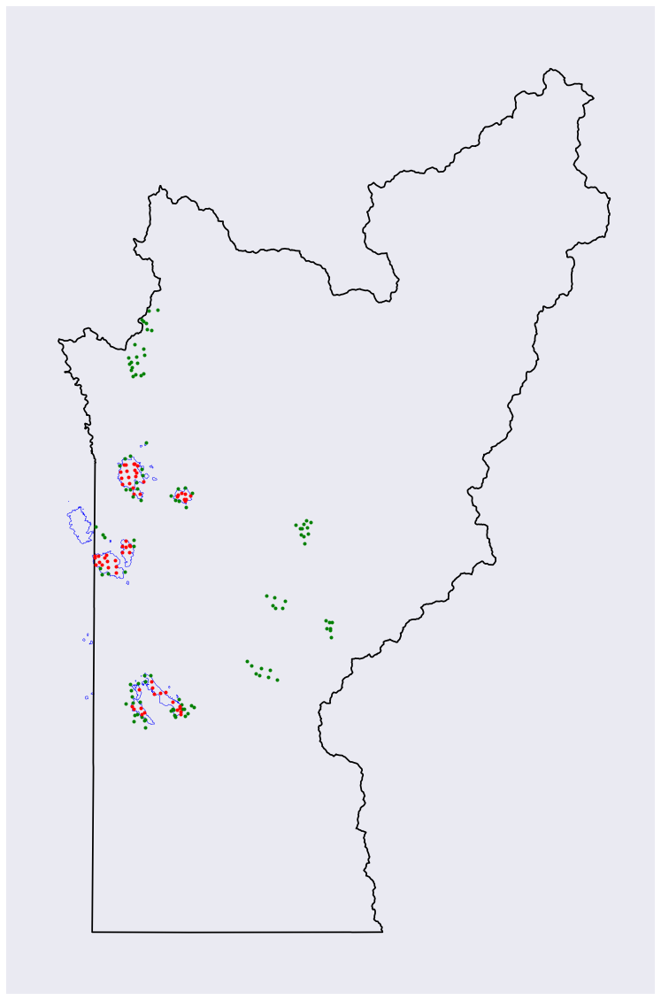

Date: 2015-08-02
--------------------------------------------------


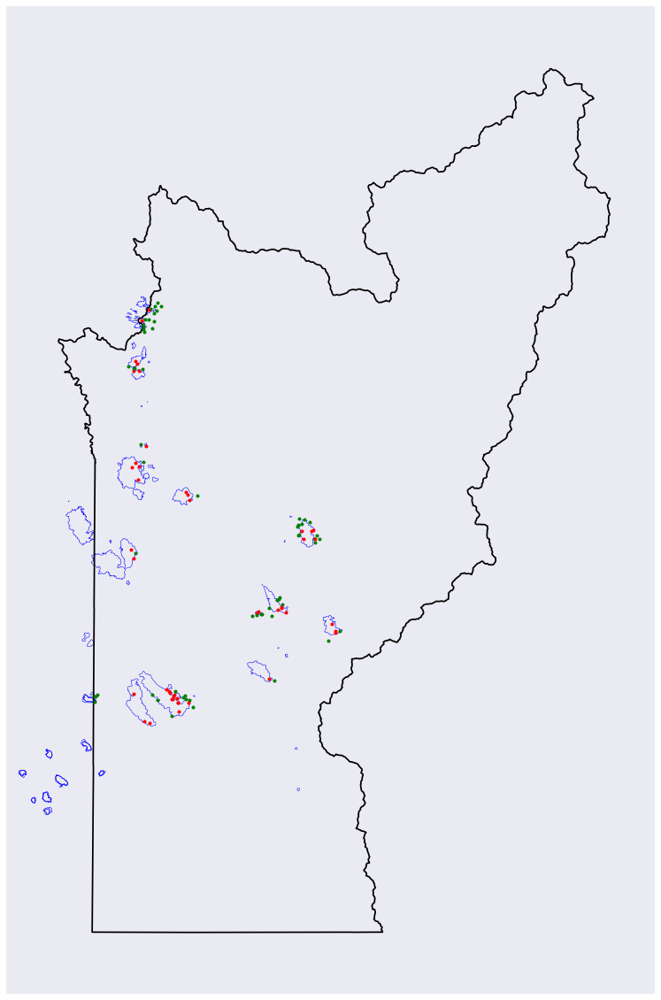

Date: 2015-08-03
--------------------------------------------------


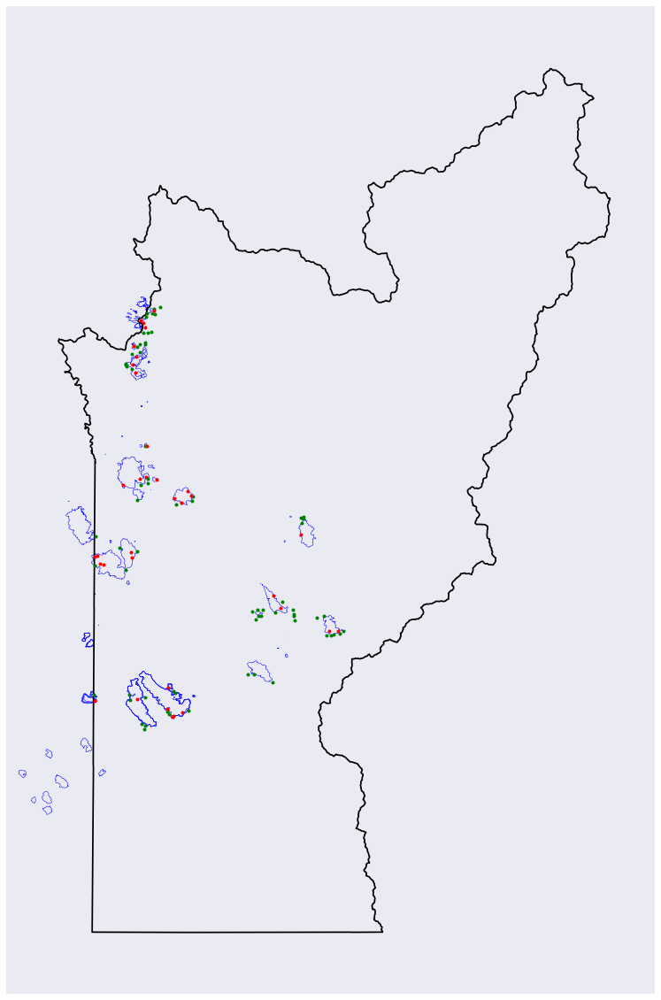

Date: 2015-08-04
--------------------------------------------------


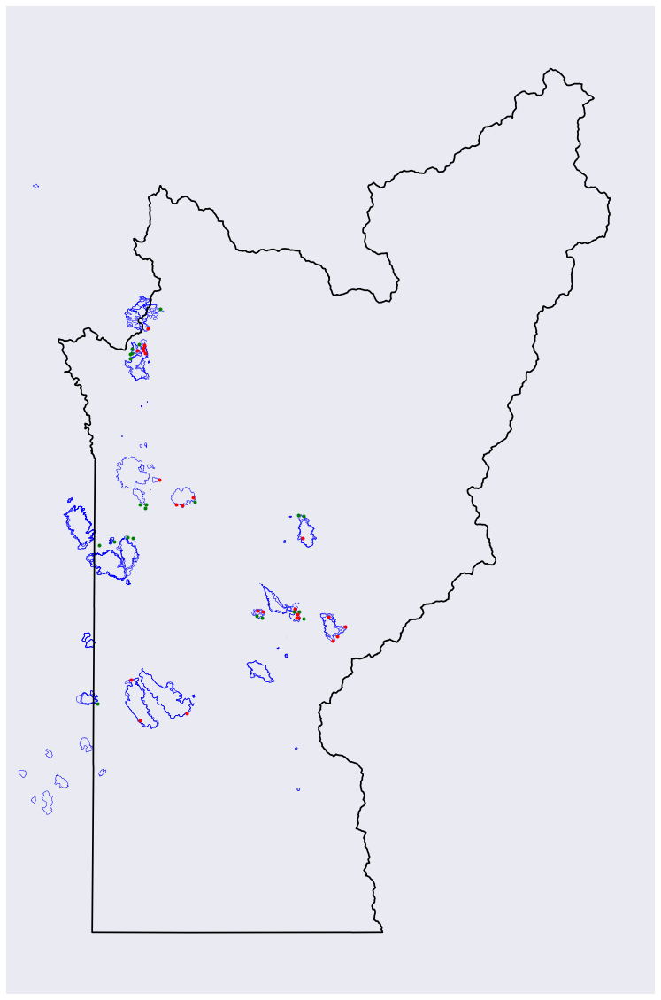

Date: 2015-08-05
--------------------------------------------------


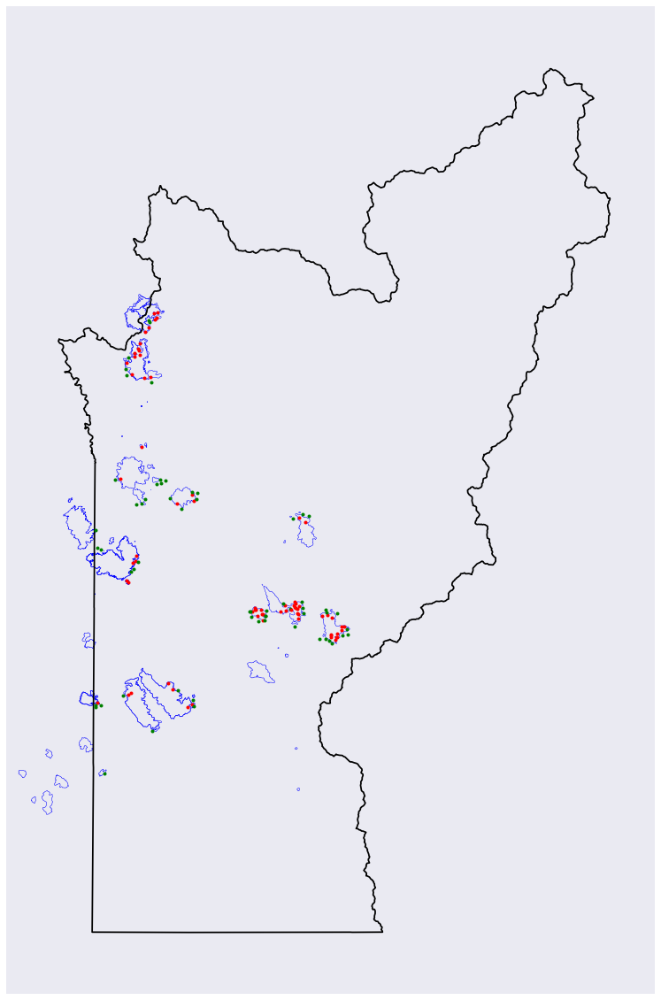

Date: 2015-08-06
--------------------------------------------------


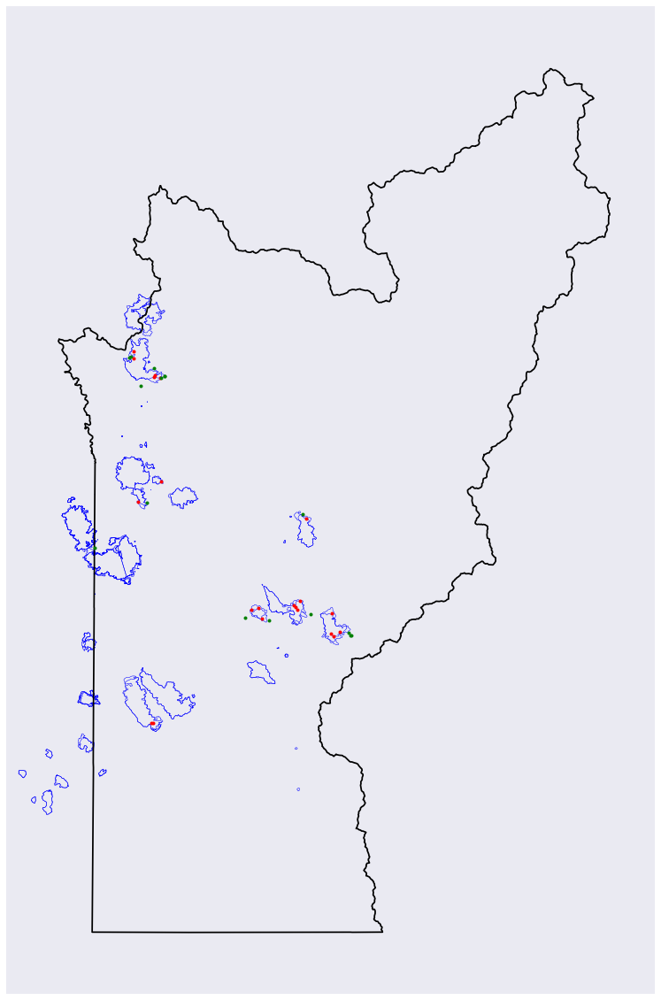

Date: 2015-08-07
--------------------------------------------------


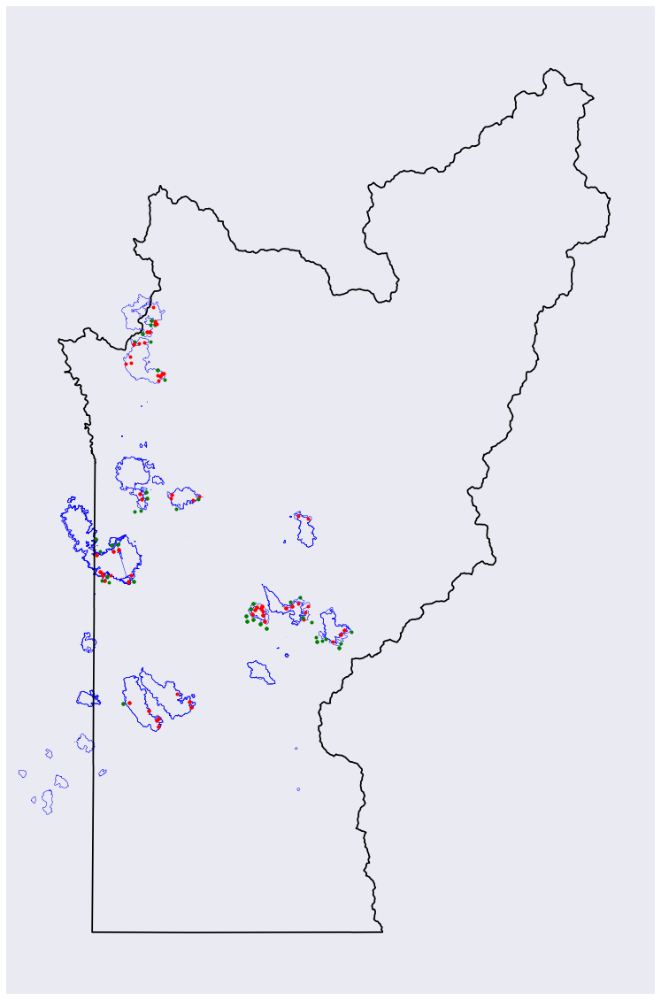

Date: 2015-08-08
--------------------------------------------------


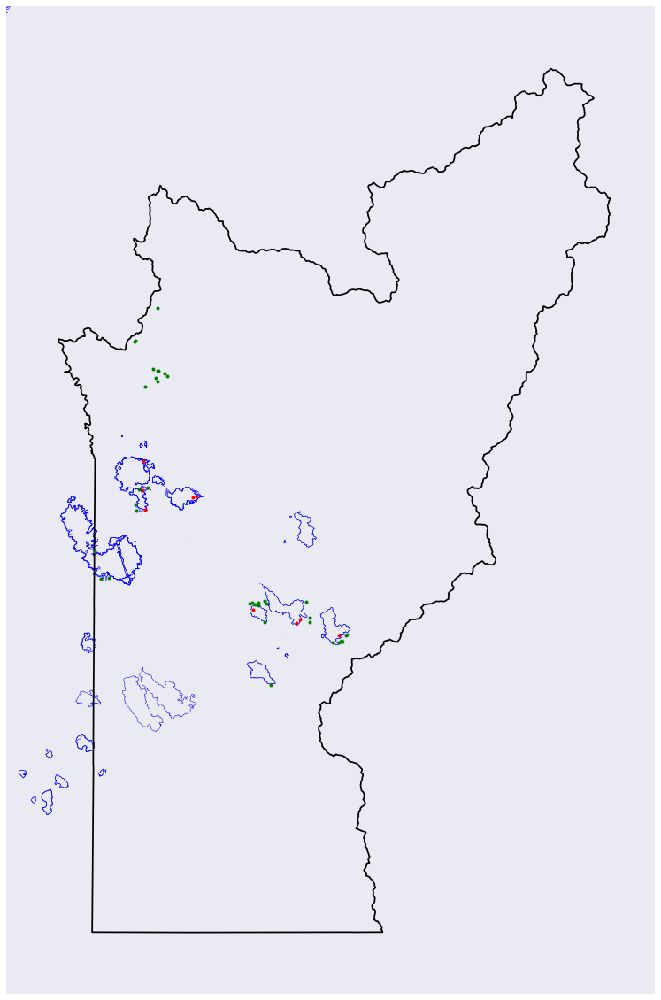

In [8]:
for dt in xrange(1, 9): 
    dt = '2015-08-0' + str(dt) if dt < 10 else '2015-08-' + str(dt)
    print 'Date: {}'.format(dt)
    print '-' * 50
    plot_county_dt('California', 'ca', '06', 'Trinity', dt, days_ahead=0)

Days Ahead: 0
--------------------------------------------------


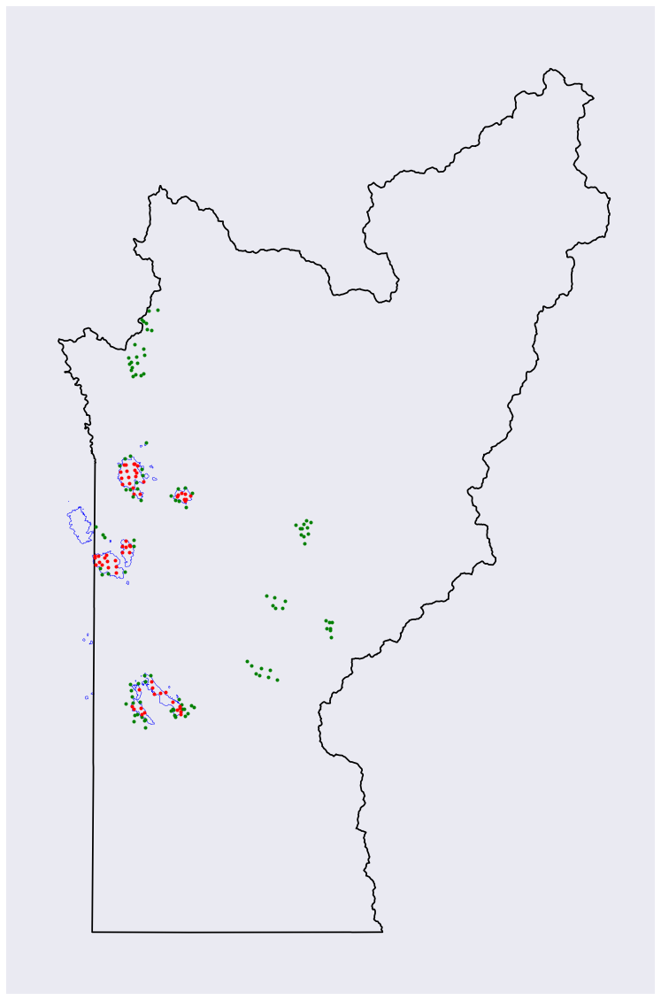

Days Ahead: 1
--------------------------------------------------


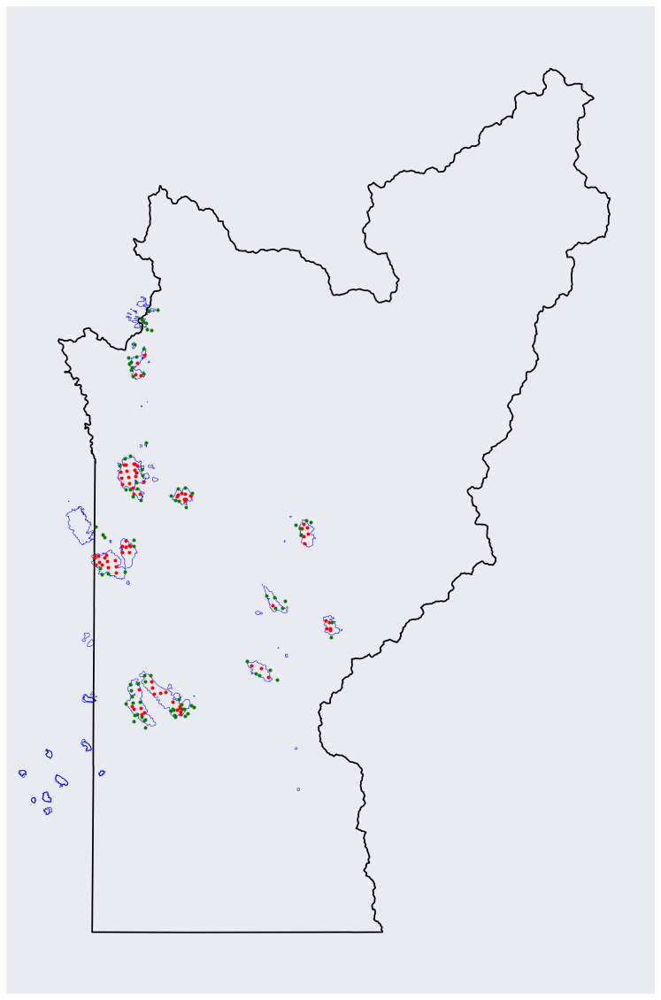

Days Ahead: 3
--------------------------------------------------


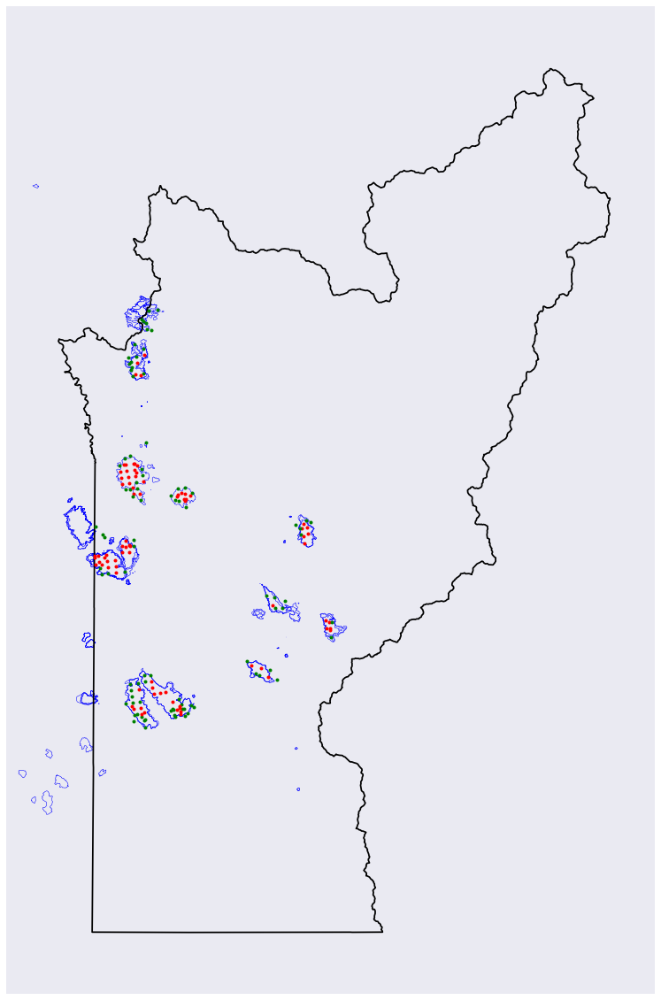

Days Ahead: 5
--------------------------------------------------


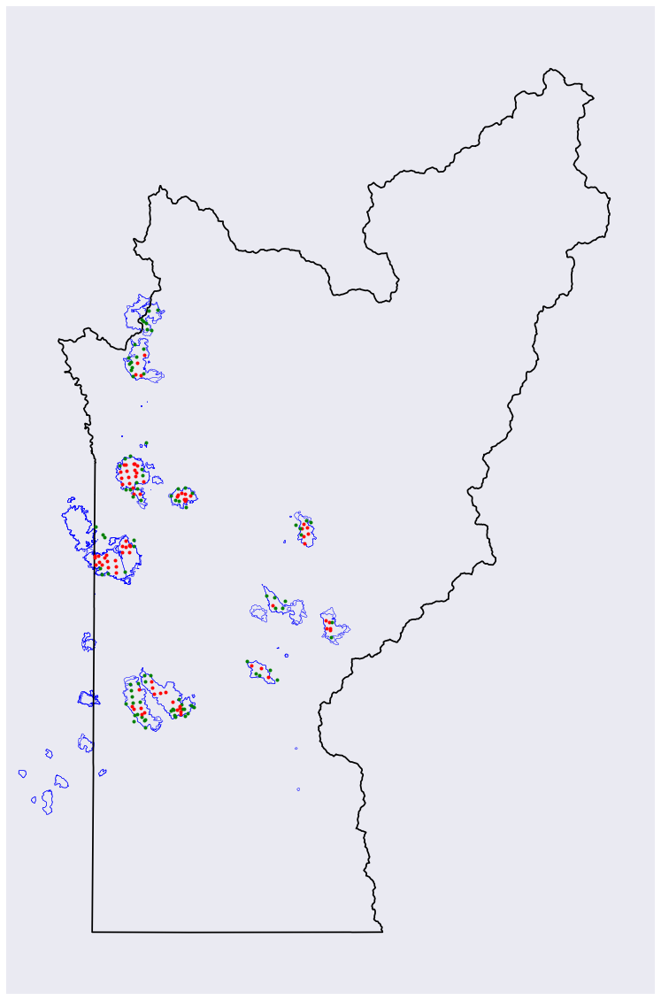

Days Ahead: 7
--------------------------------------------------


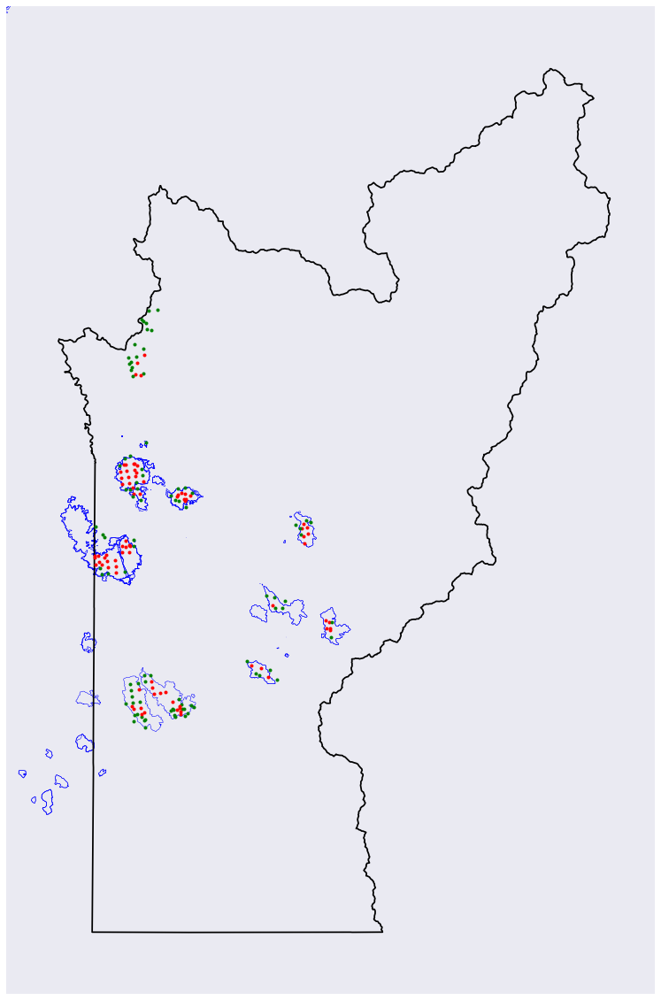

In [11]:
for days_ahead in (0, 1, 3, 5, 7): 
    dt = '2015-08-0' + str(days_ahead + 1) if days_ahead < 10 else '2015-08-' + str(days_ahead + 1)
    print 'Days Ahead: {}'.format(days_ahead)
    print '-' * 50
    plot_county_dt('California', 'ca', '06', 'Trinity', '2015-08-01', dt, days_ahead=days_ahead)
    plt.clf()

From the above, we can see that the merge looks to be labeling some observations as forest-fires based off later boundaries, but that some of the merging isn't happening correctly. 

After looking into this, and trying a number of different merges in PostgreSQL (~10) using their PostGIS extension (each of which gave me the exact same results), I have no good explanation for this. Some forums online have suggested that the PostGIS extension can be a little finicky. Given that I'll also be extending the boundaries by some distance, I'm going to look into that and see what effect that has. Before doing so, I'd still like to see how these above merging changes the number of observations labeled as forest-fires, and the distributions of some of the variables. 

In [50]:
for year in xrange(2012, 2016): 
    print 'Year: {}'.format(year)
    print '-' * 50
    for days_forward in (0, 1, 3, 5, 7): 
        print 'Days Forward: {}'.format(days_forward)
        print '=' * 50
        df = read_df(year, days_forward)
        df.info()
        print '=' * 50

Year: 2012
--------------------------------------------------
Days Forward: 0
<class 'pandas.core.frame.DataFrame'>
Int64Index: 247286 entries, 0 to 252372
Data columns (total 36 columns):
ogc_fid             247286 non-null int64
wkb_geometry        247286 non-null object
area                247286 non-null float64
perimeter           247286 non-null float64
fire_               247286 non-null int64
fire_id             247286 non-null int64
lat                 247286 non-null float64
long                247286 non-null float64
date                247286 non-null datetime64[ns]
julian              247286 non-null int64
gmt                 247286 non-null int64
temp                247286 non-null float64
spix                247286 non-null float64
tpix                247286 non-null float64
src                 247286 non-null object
sat_src             247286 non-null object
conf                247286 non-null int64
frp                 247286 non-null float64
fire_bool           247286 

In [13]:
for year in xrange(2012, 2016): 
    print 'Year: {}'.format(year)
    print '-' * 50
    for days_forward in (0, 1, 3, 5, 7): 
        print 'Days Forward: {}'.format(days_forward)
        df = read_df(year, days_forward)
        print df.fire_bool.mean(), df.fire_bool.sum()
    print '\n' * 2

Year: 2012
--------------------------------------------------
Days Forward: 0
0.241546225828
Days Forward: 1
0.2683289794
Days Forward: 3
0.27413602064
Days Forward: 5
0.275571605348
Days Forward: 7
0.276287375751



Year: 2013
--------------------------------------------------
Days Forward: 0
0.150573077888
Days Forward: 1
0.166619258763
Days Forward: 3
0.168404026883
Days Forward: 5
0.169073314928
Days Forward: 7
0.169368917148



Year: 2014
--------------------------------------------------
Days Forward: 0
0.106409845979
Days Forward: 1
0.115044641269
Days Forward: 3
0.115898338847
Days Forward: 5
0.11604951446
Days Forward: 7
0.116098424217



Year: 2015
--------------------------------------------------
Days Forward: 0
0.22669471071
Days Forward: 1
0.249417281567
Days Forward: 3
0.252989449004
Days Forward: 5
0.253692848769
Days Forward: 7
0.254161781946





In [15]:
continous_vars = ('lat', 'long', 'gmt', 'temp', 'spix', 'tpix', 'conf', 'frp', 'county_aland', 'county_awater')
categorical_vars = ('urban_areas_bool', 'src', 'sat_src')

In [47]:
def check_dists(year, continous_vars, categorical_vars): 
    """Plot the distributions of varaibles for the inputted year. 
    
    Read in the data for the inputted year. Then, take the inputted 
    variable names in the continous_vars and categorical_vars parameters, 
    and plot their distributions. Do this separately for observations 
    labeled as forest-fires and those labeled as non forest-fires. 
    
    Args: 
        year: int
            Holds the year of data to use for plotting. 
        continous_vars: tuple (or other iterable) of strings
            Holds the names of the continuous variables to use for plotting. 
        categorical_vars: tuple (or other iterable) of strings. 
            Holds the names of the categorical variables to use for plotting. 
    """
    dfs = []
    for days_forward in (0, 1, 3, 5, 7): 
        dfs.append(read_df(year, days_forward))
    
    fires = []
    non_fires = []
    for df in dfs: 
        fires.append(df.query('fire_bool == 1'))
        non_fires.append(df.query('fire_bool == 0'))
        
    print 'Continuous Vars'
    print '-' * 50
    for var in continous_vars: 
        print 'Variable: {} : Fires, then non-fires'.format(var)
        print '-' * 50
        for idx, df in enumerate(dfs): 
            f, axes = plt.subplots(1, 8, figsize=(20, 5))
            fire_var = fires[idx][var]
            non_fire_var = non_fires[idx][var]
            print fire_var.mean(), non_fire_var.mean()
            plot_var_dist(fire_var, categorical=False, ax=axes[0:4], show=False)
            plot_var_dist(non_fire_var, categorical=False, ax=axes[4:], show=False)
            plt.show()
    print 'Categorical Vars'
    print '-' * 50
    for var in categorical_vars: 
        print 'Variable: {} : Fires, then non-fires'.format(var)
        print '-' * 50
        for idx, df in enumerate(dfs):
            f, axes = plt.subplots(1, 2)
            plot_var_dist(fires[idx][var], categorical=True, ax=axes[0], show=False)
            plot_var_dist(non_fires[idx][var], categorical=True, ax=axes[1], show=False)
            plt.show()

Continuous Vars
--------------------------------------------------
Variable: lat : Fires, then non-fires
--------------------------------------------------
42.5578632536 38.8348635067


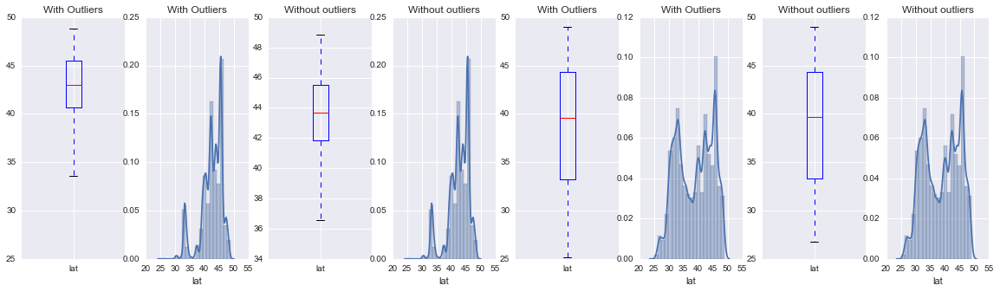

42.5901688368 38.6867358566


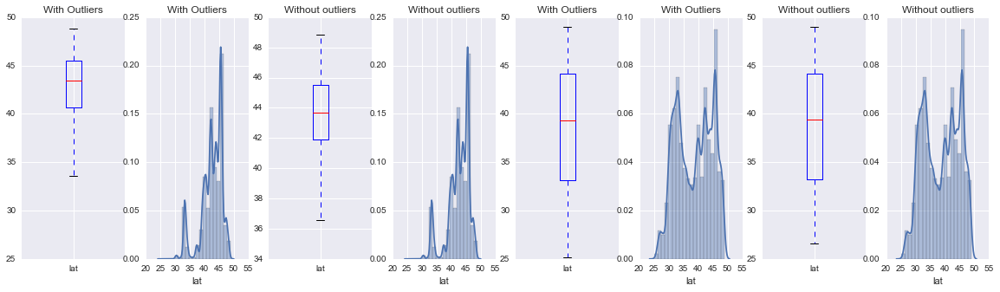

42.6266361263 38.6417351473


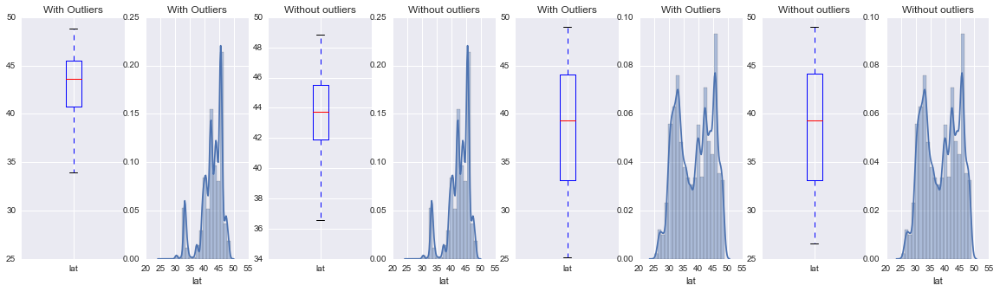

42.6326528432 38.6315496006


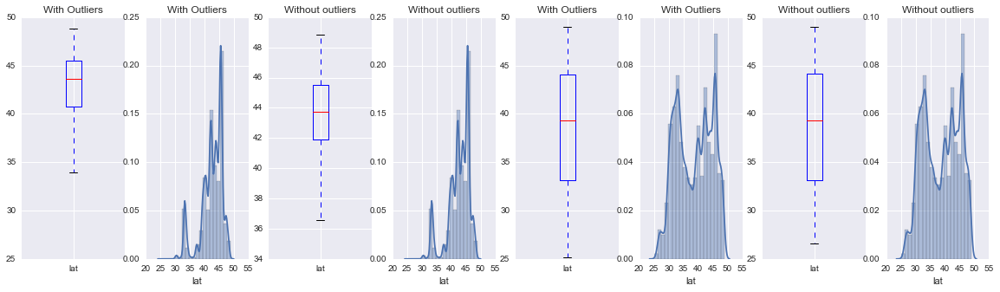

42.6397074295 38.62489922


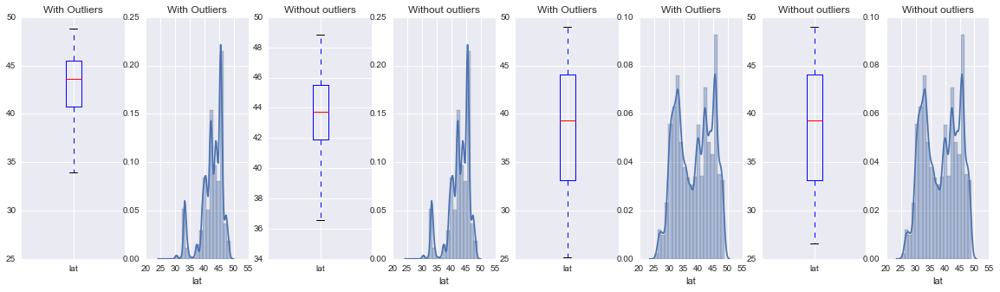

Variable: long : Fires, then non-fires
--------------------------------------------------
-114.247726105 -102.355870155


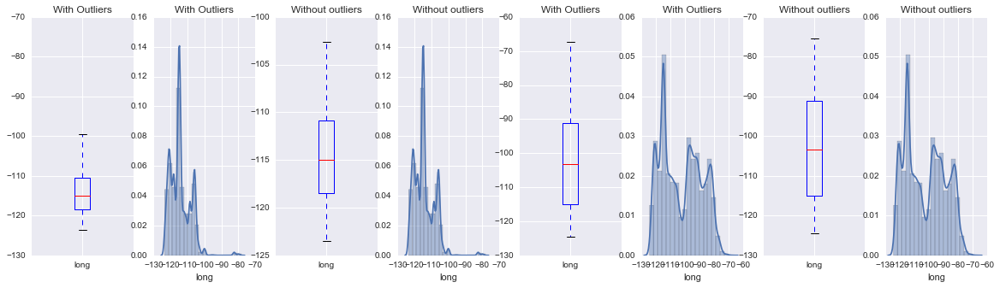

-114.129513624 -101.963922402


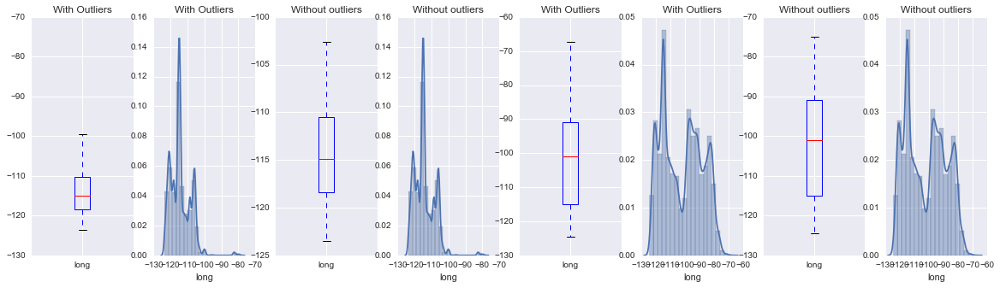

-114.132966986 -101.865291277


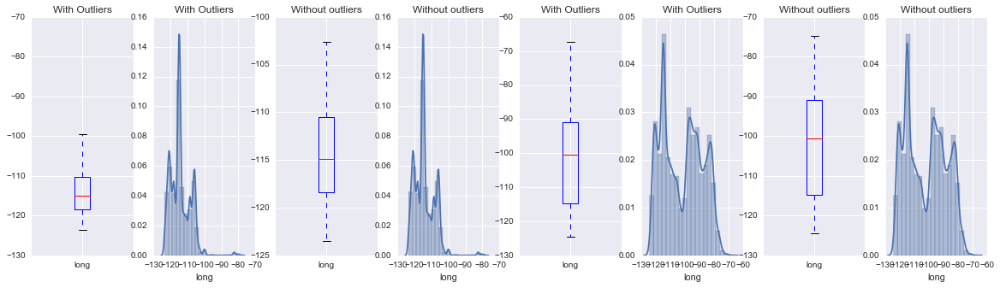

-114.136168787 -101.839762718


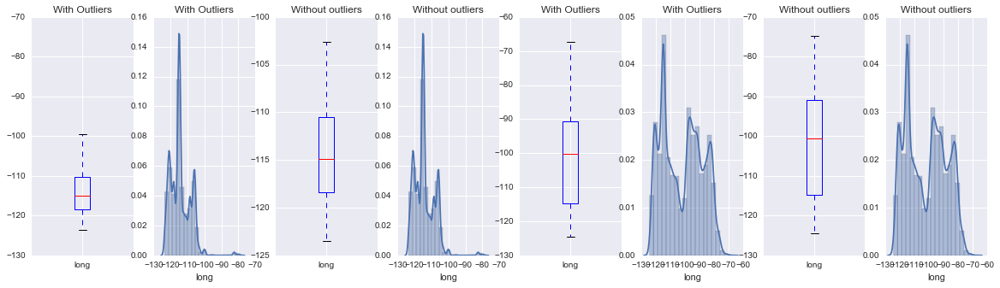

-114.140973347 -101.825767048


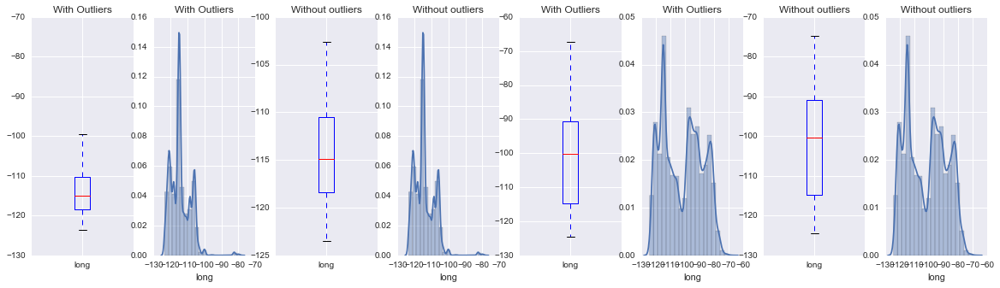

Variable: gmt : Fires, then non-fires
--------------------------------------------------
1297.92578393 1627.14389379


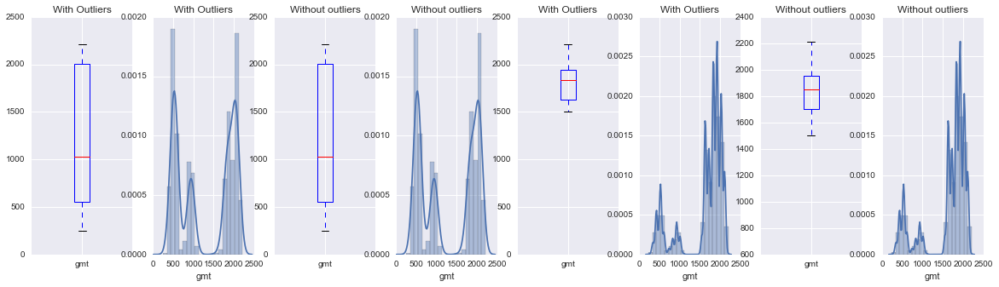

1301.78777466 1637.77856874


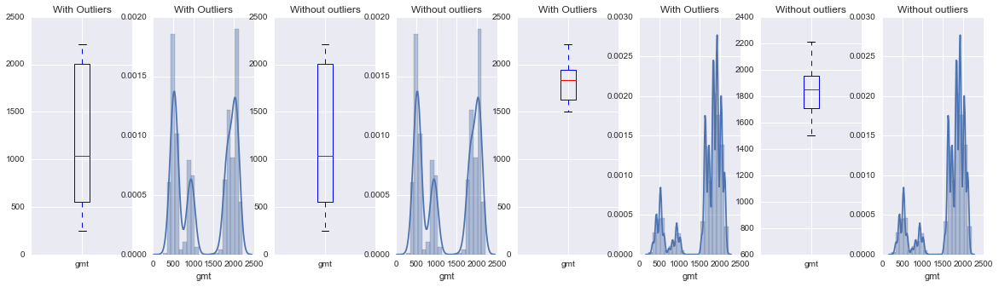

1307.81687565 1638.18955297


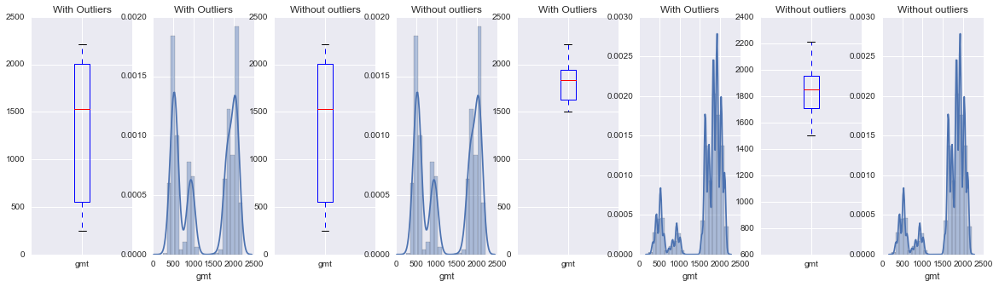

1309.90916428 1638.04834181


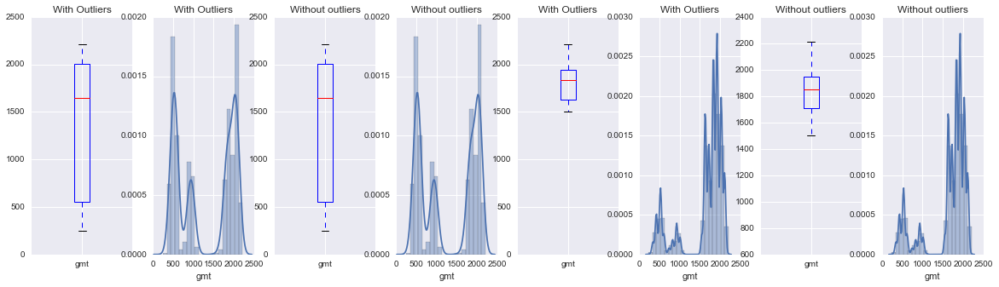

1311.1019291 1637.91752531


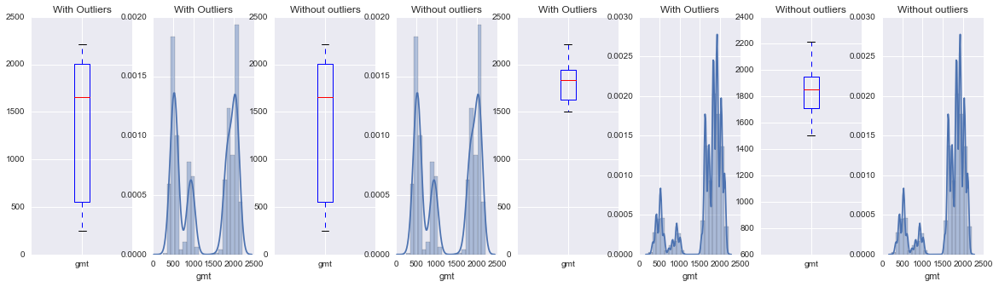

Variable: temp : Fires, then non-fires
--------------------------------------------------
340.7516432 330.974982272


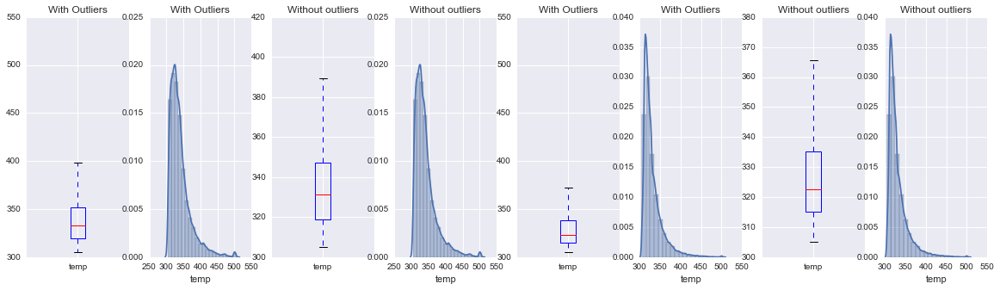

340.153167857 330.83658999


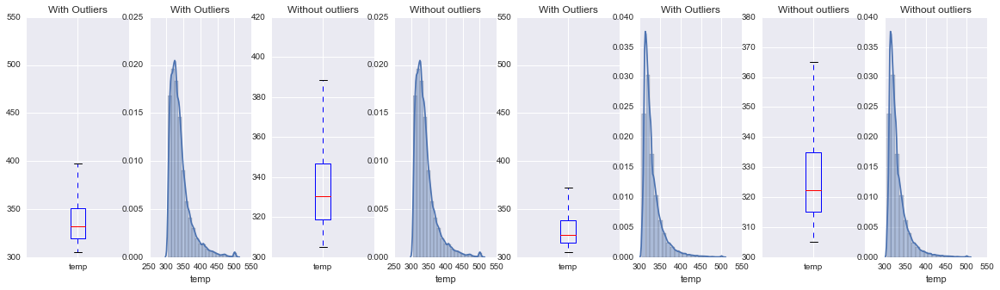

339.950625461 330.838549606


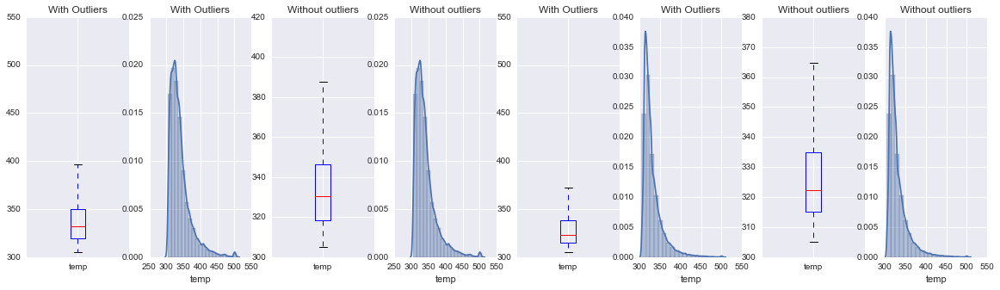

339.88269719 330.846332219


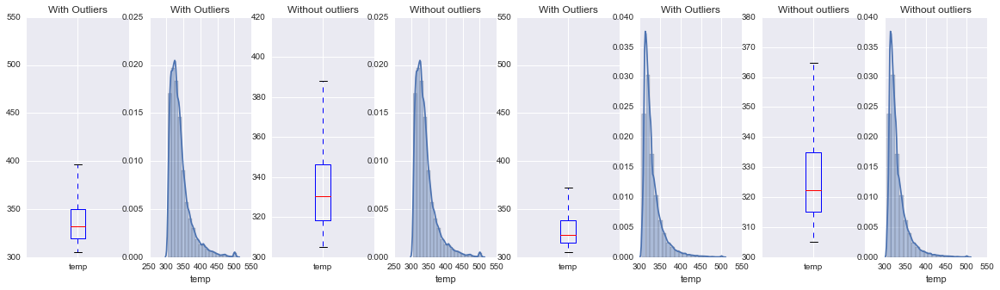

339.854663212 330.848097383


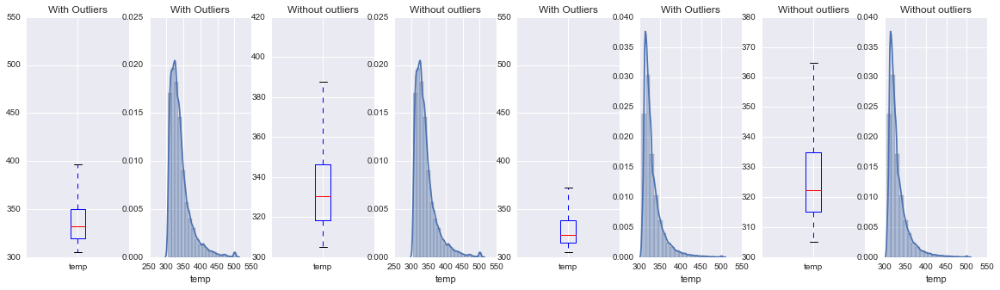

Variable: spix : Fires, then non-fires
--------------------------------------------------
1.72147126283 1.65137213084


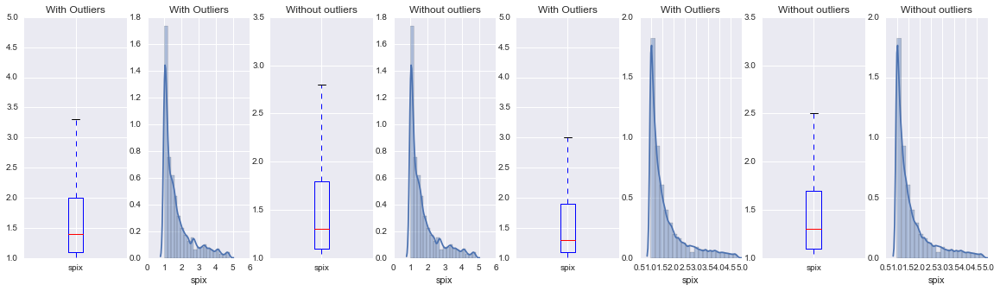

1.7170434337 1.6504299958


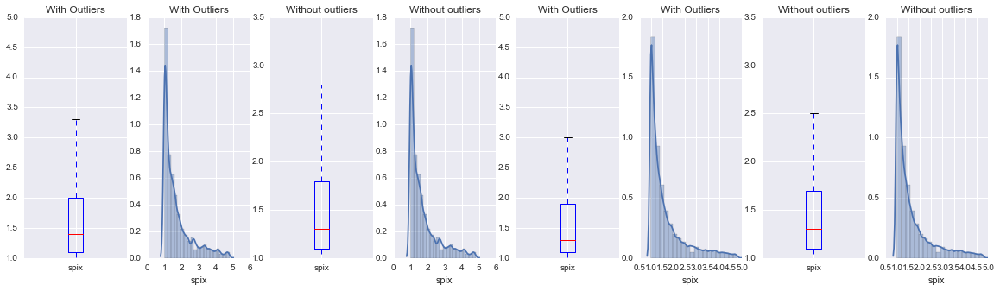

1.71729753651 1.64980110977


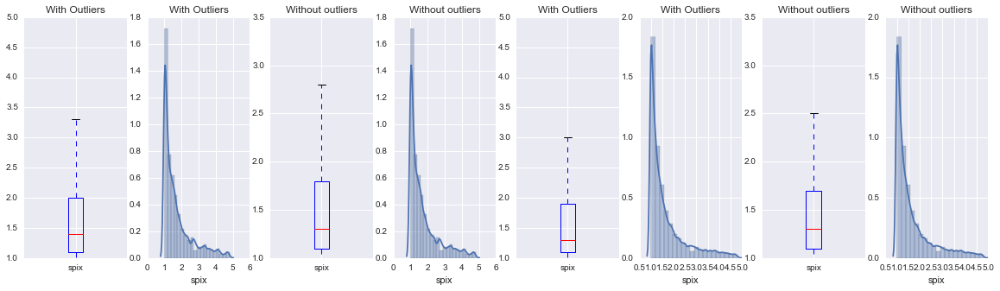

1.71608335168 1.65012922781


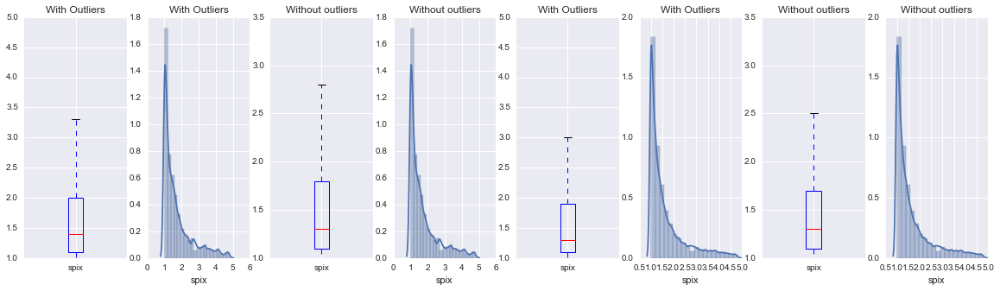

1.71610315857 1.65005643593


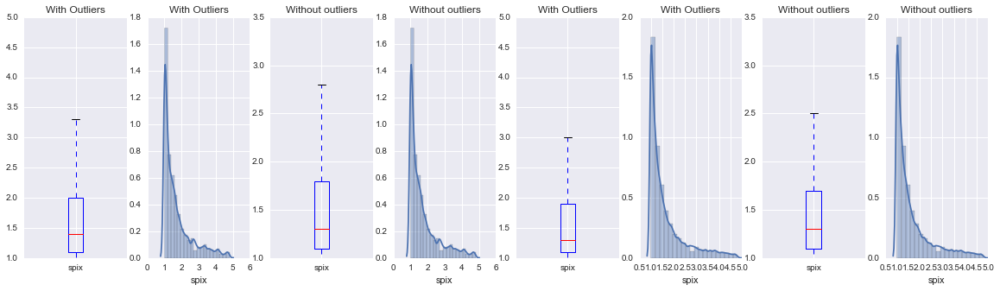

Variable: tpix : Fires, then non-fires
--------------------------------------------------
1.24527967052 1.22180960252


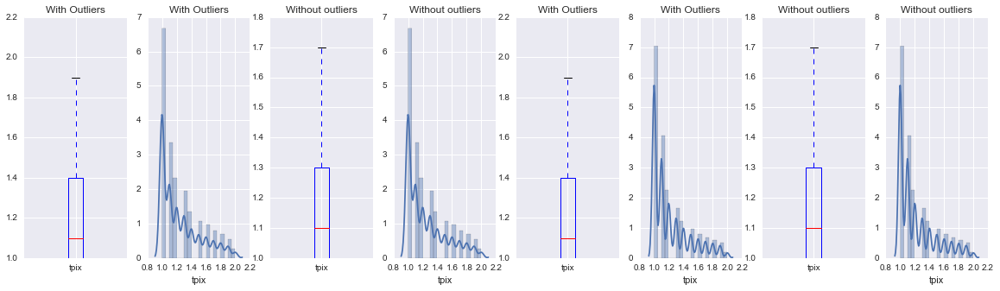

1.24414051903 1.22136824884


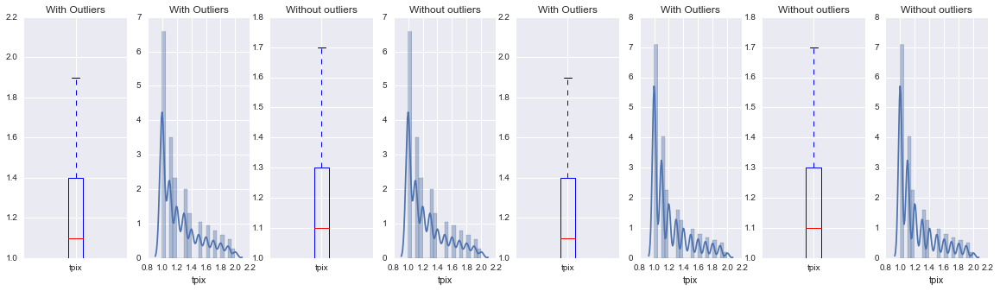

1.24422038649 1.2211559032


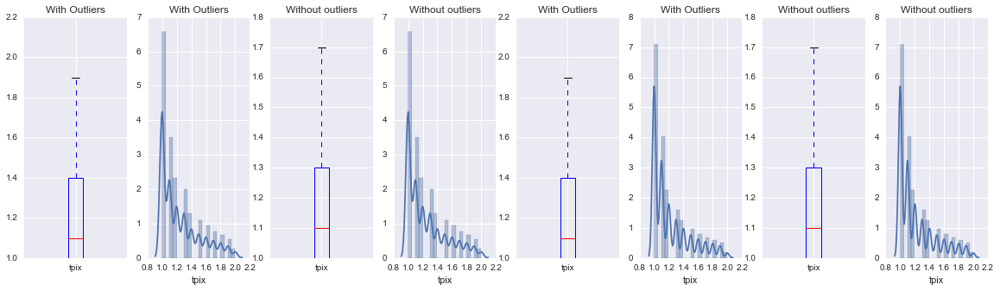

1.24384474283 1.22125309114


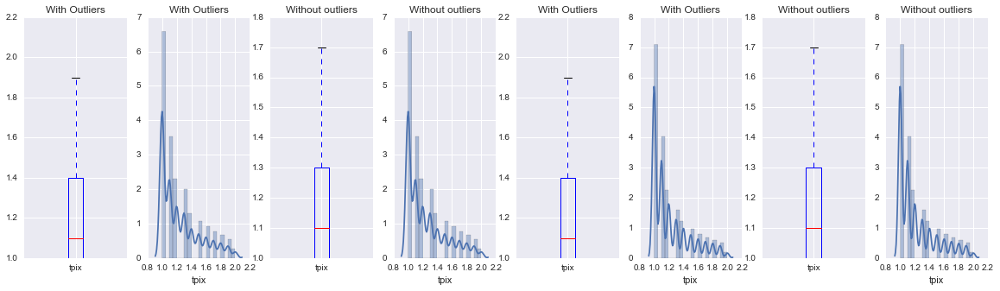

1.24381897485 1.2212405847


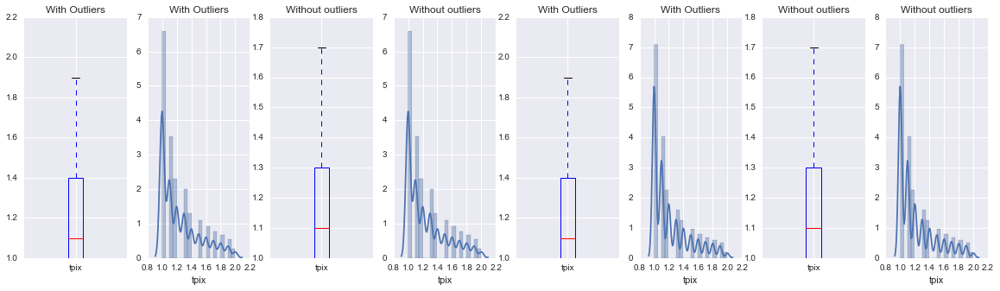

Variable: conf : Fires, then non-fires
--------------------------------------------------
79.2207229077 71.6179094132


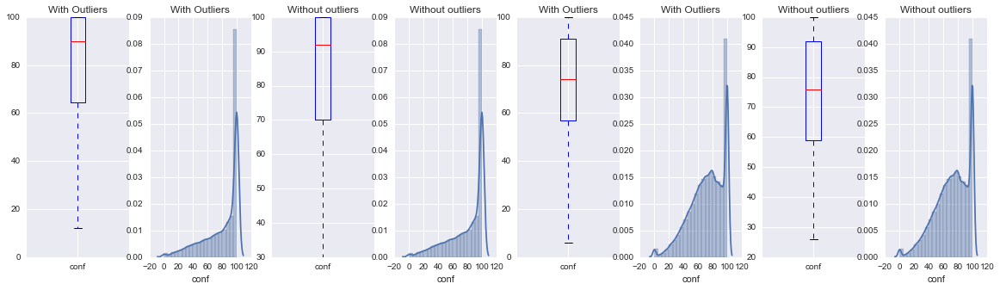

78.8092805257 71.4904991931


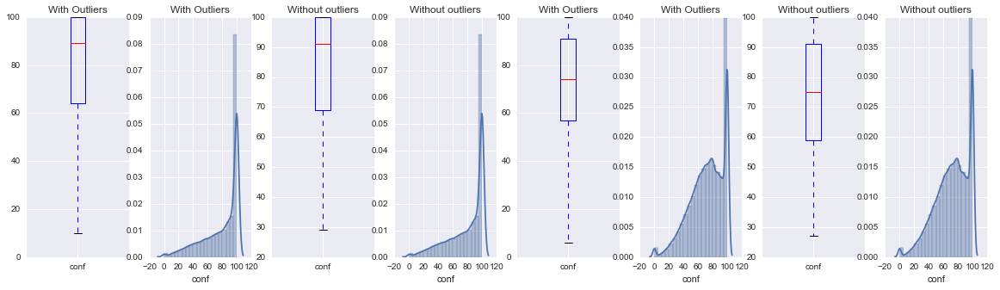

78.6534444608 71.4908020234


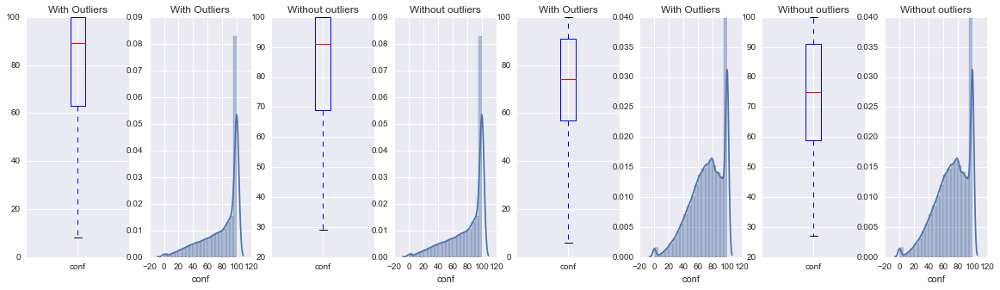

78.59677159 71.4981662489


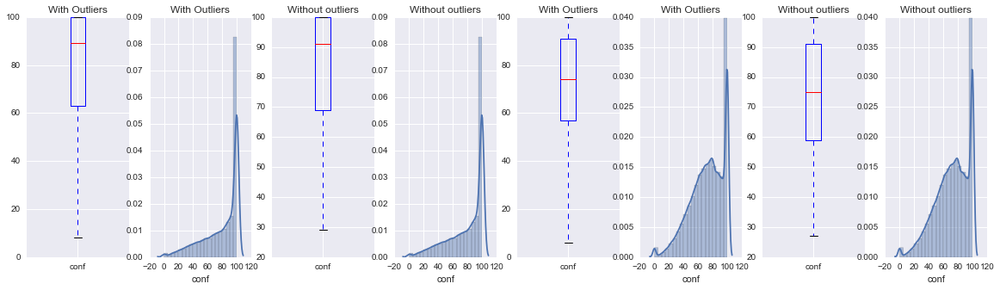

78.575597904 71.4992288952


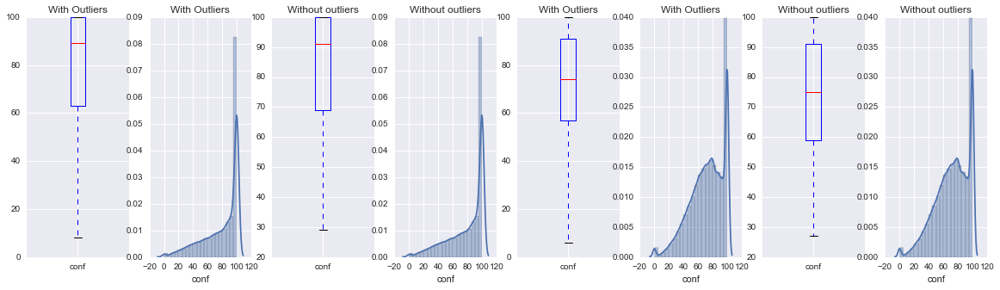

Variable: frp : Fires, then non-fires
--------------------------------------------------
160.391314393 98.1597131508


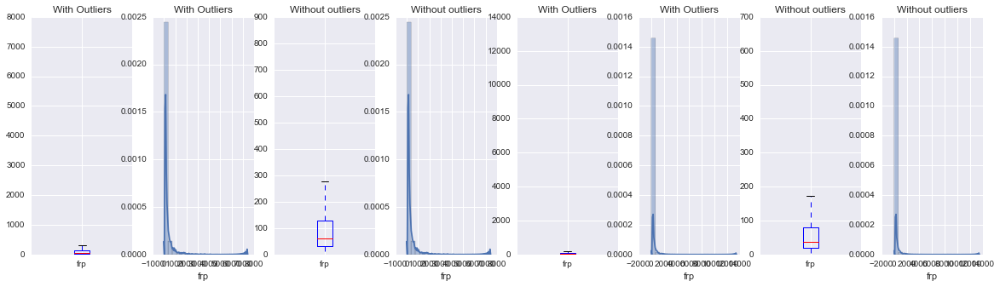

156.799067125 97.199131718


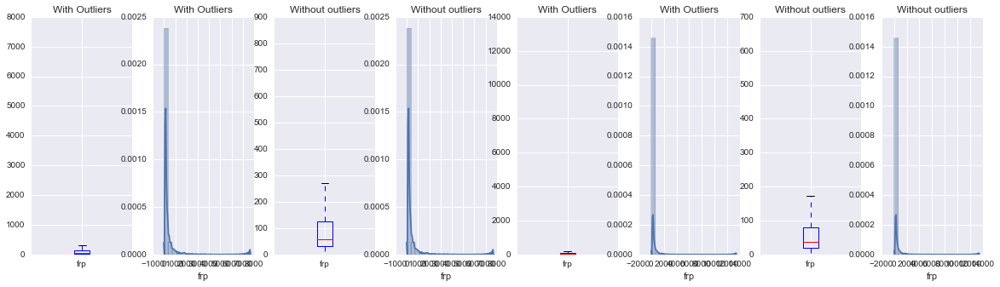

155.434384127 97.2377195035


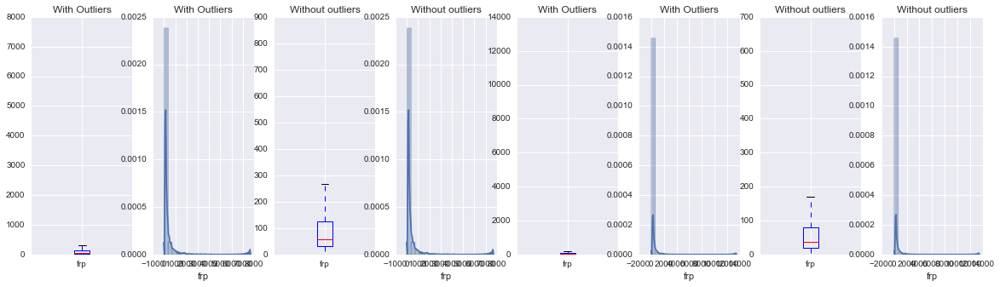

154.925585149 97.3159388415


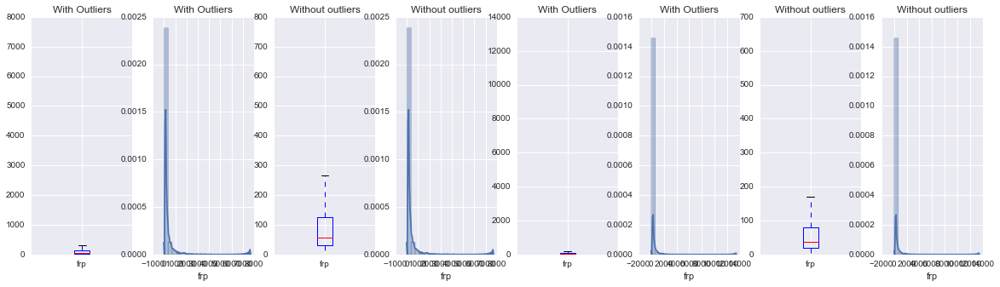

154.79452153 97.3089967815


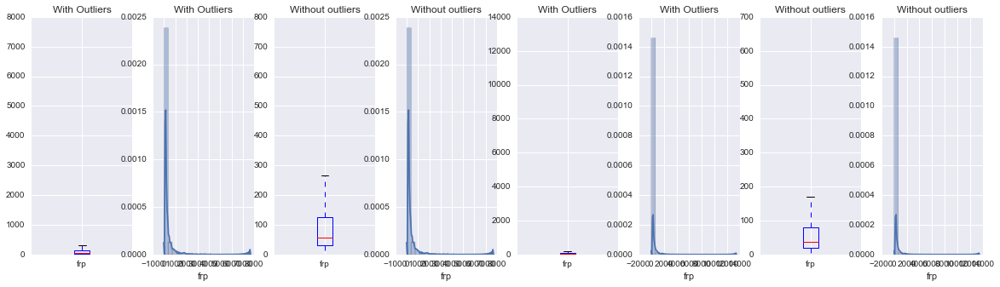

Variable: county_aland : Fires, then non-fires
--------------------------------------------------
13084546288.0 7594550883.48


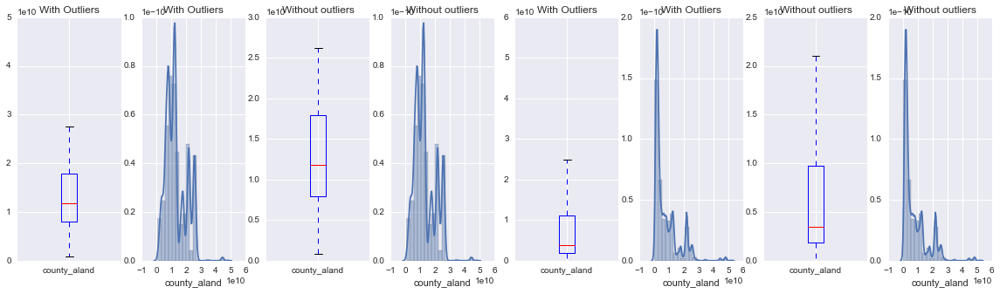

13070110263.0 7398884270.83


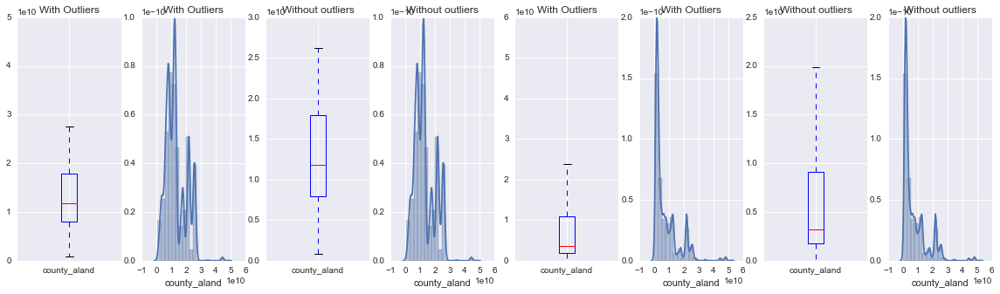

13068894654.1 7353972549.15


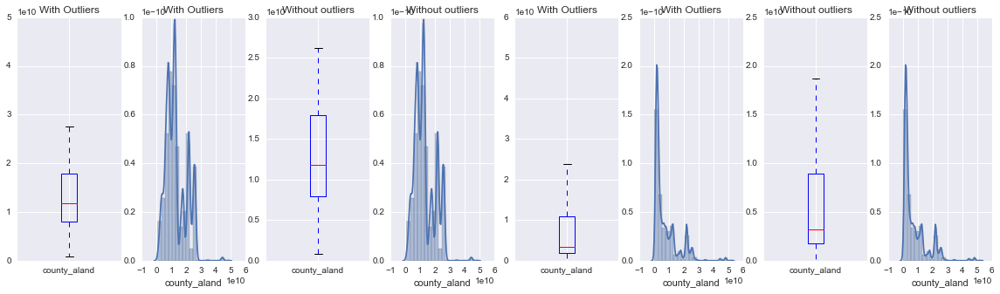

13078081271.2 7339152829.62


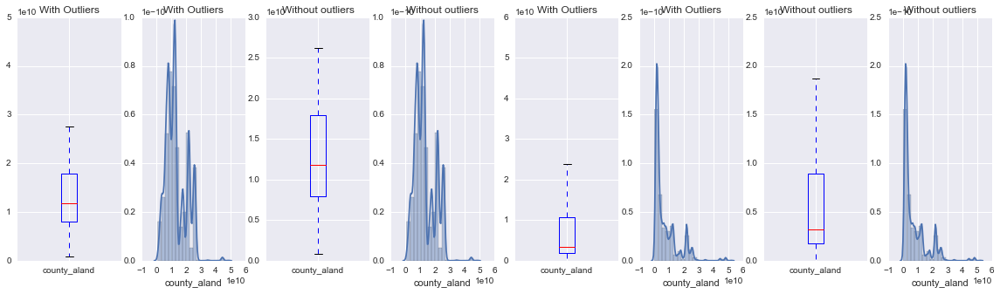

13083442107.6 7331430307.79


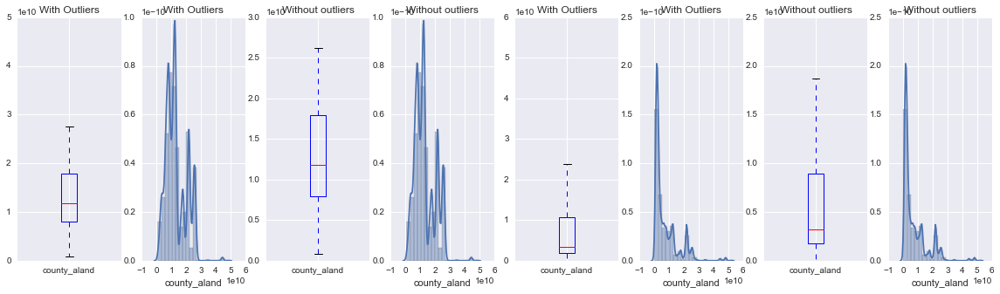

Variable: county_awater : Fires, then non-fires
--------------------------------------------------
132426331.8 147200712.602


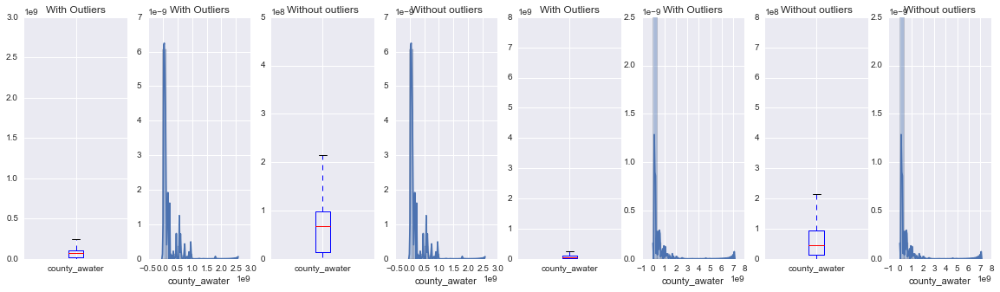

130599853.966 148411359.885


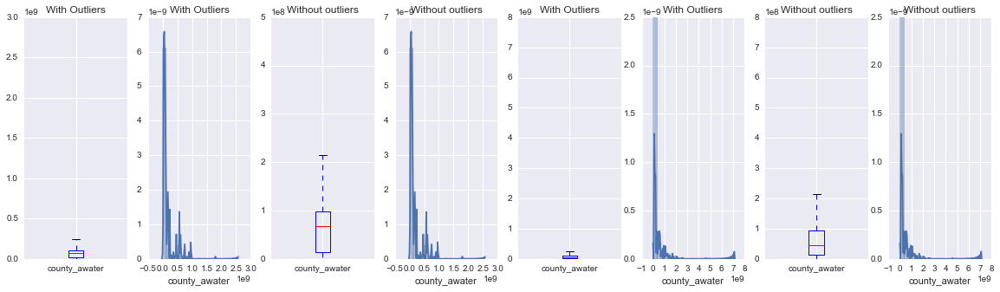

131319562.619 148282043.761


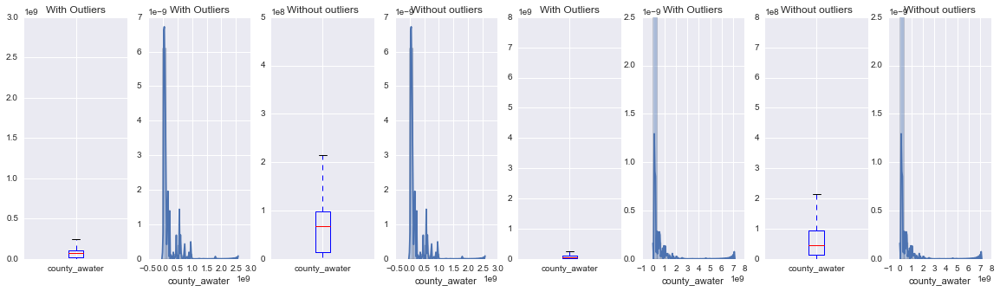

131429537.329 148273823.723


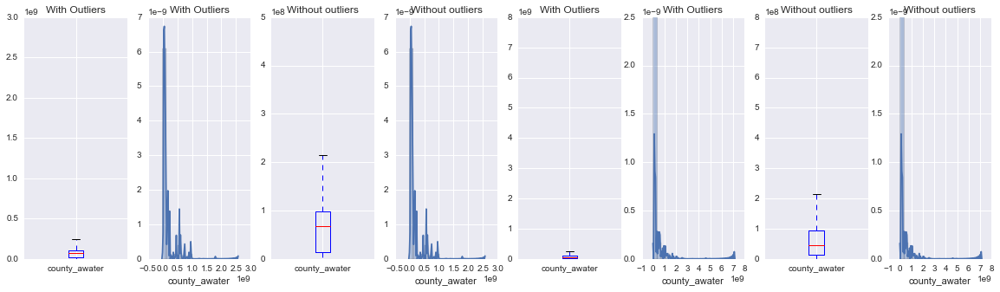

131329331.057 148328738.296


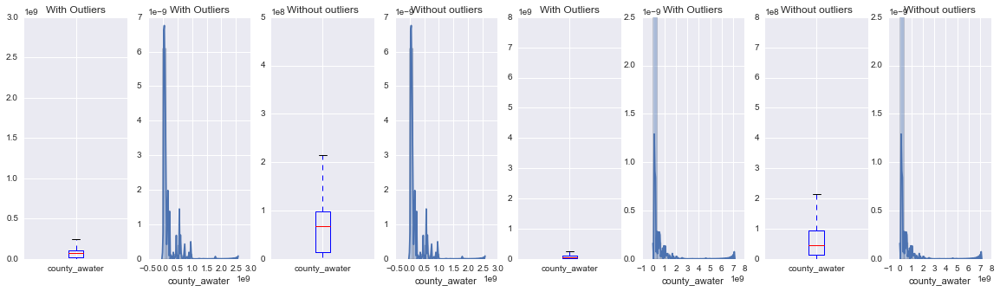

Categorical Vars
--------------------------------------------------
Variable: urban_areas_bool : Fires, then non-fires
--------------------------------------------------


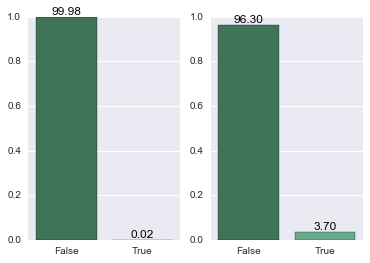

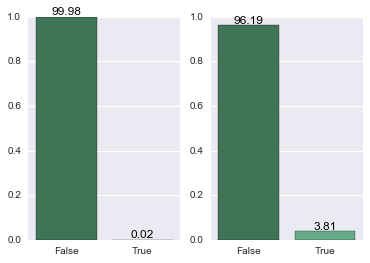

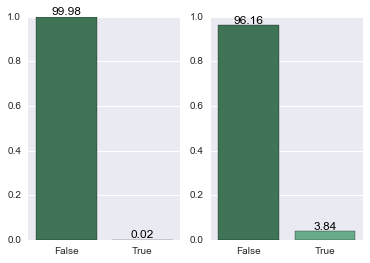

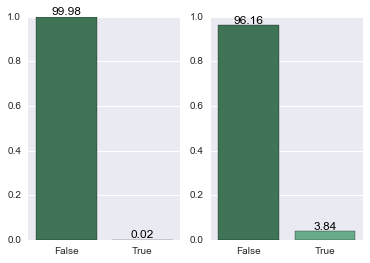

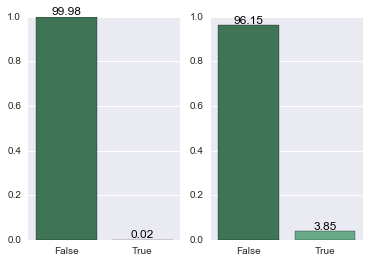

Variable: src : Fires, then non-fires
--------------------------------------------------


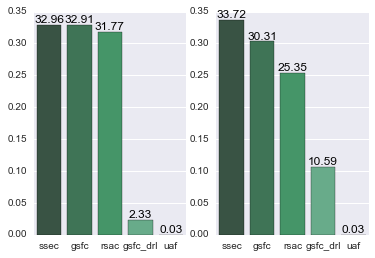

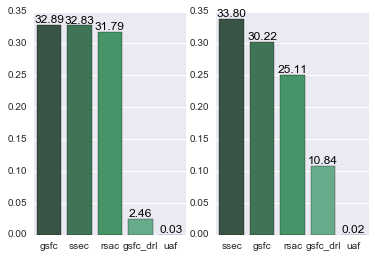

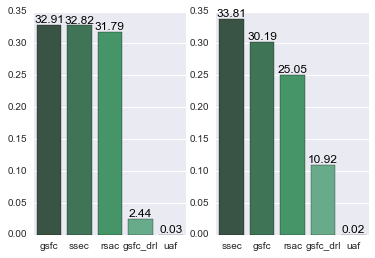

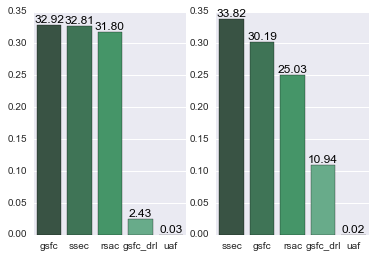

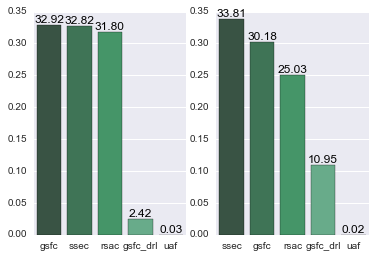

Variable: sat_src : Fires, then non-fires
--------------------------------------------------


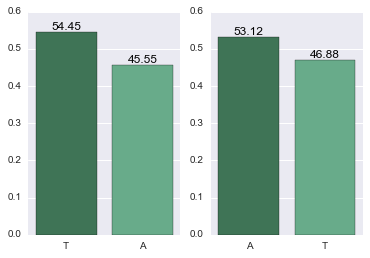

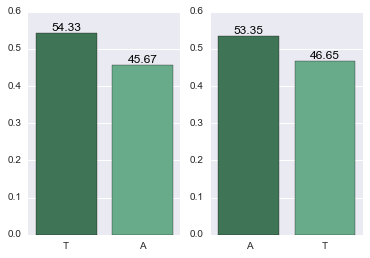

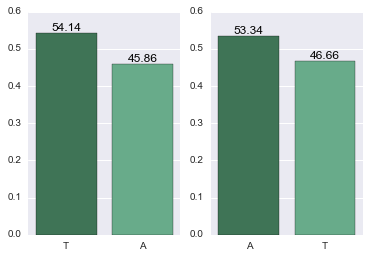

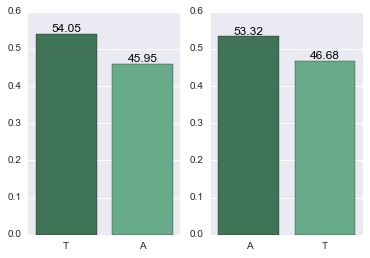

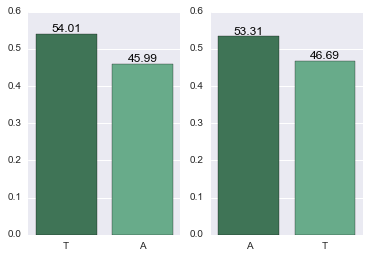

In [48]:
check_dists(2012, continous_vars, categorical_vars)

Continuous Vars
--------------------------------------------------
Variable: lat : Fires, then non-fires
--------------------------------------------------
40.235120643 36.2029337943


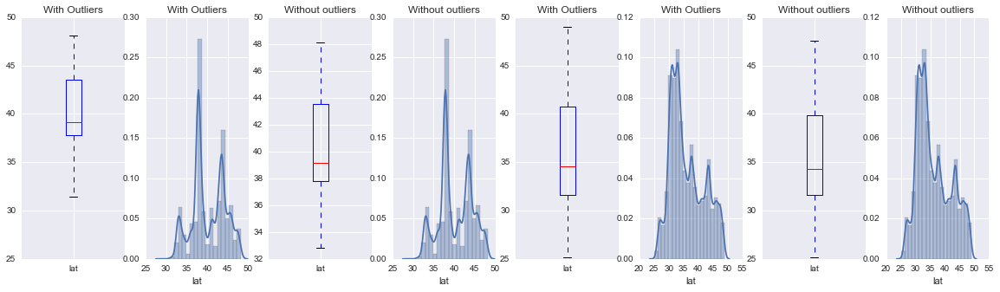

40.27848969 36.1166259227


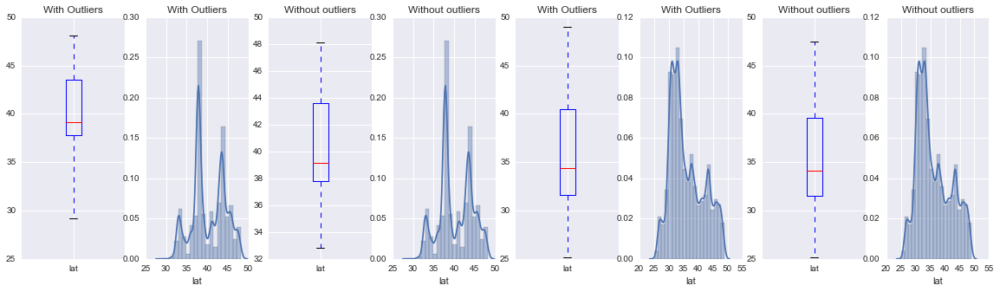

40.3048204941 36.1023615737


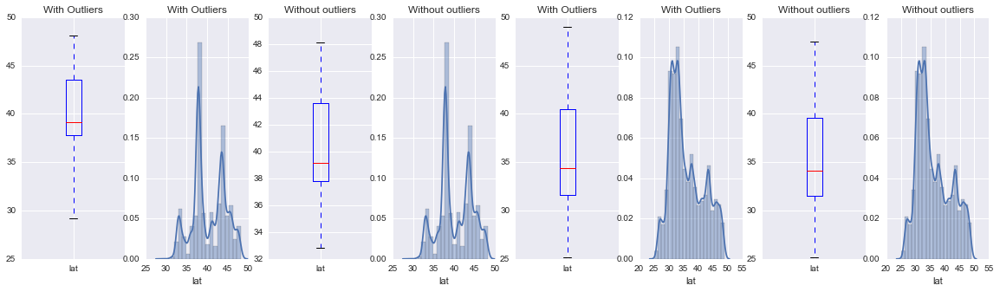

40.3054064129 36.0988573912


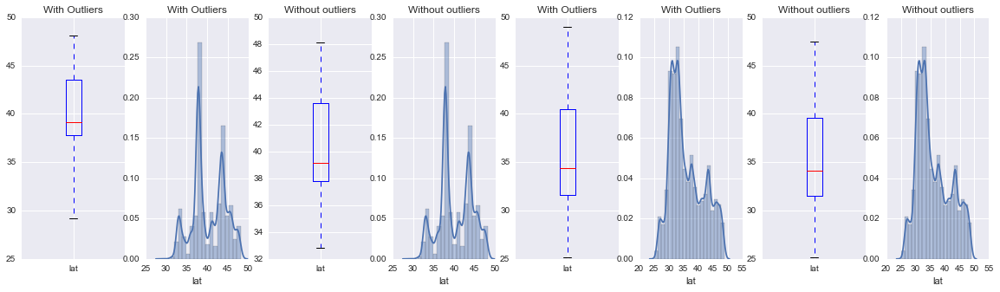

40.3084328712 36.0967432719


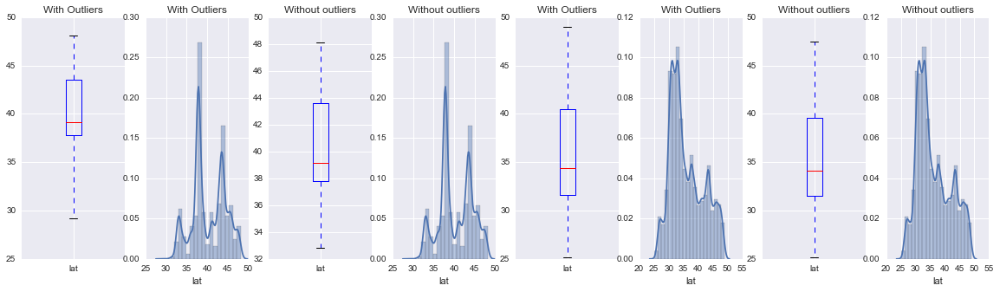

Variable: long : Fires, then non-fires
--------------------------------------------------
-116.976970367 -97.6399929086


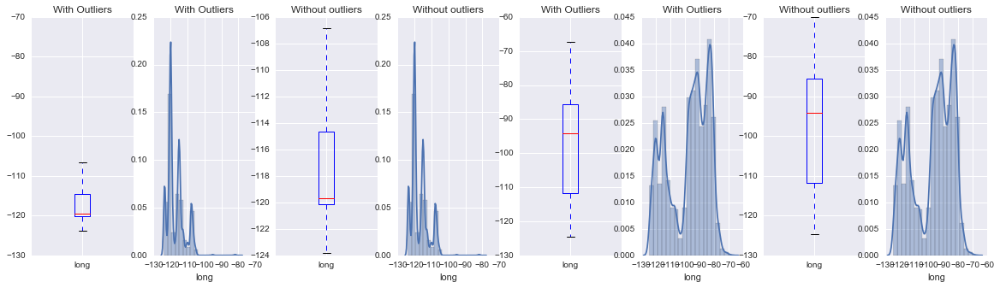

-116.757324731 -97.3115866578


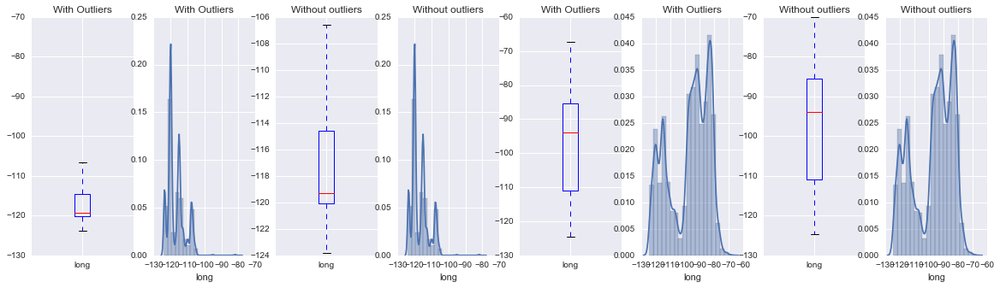

-116.735813506 -97.2742084627


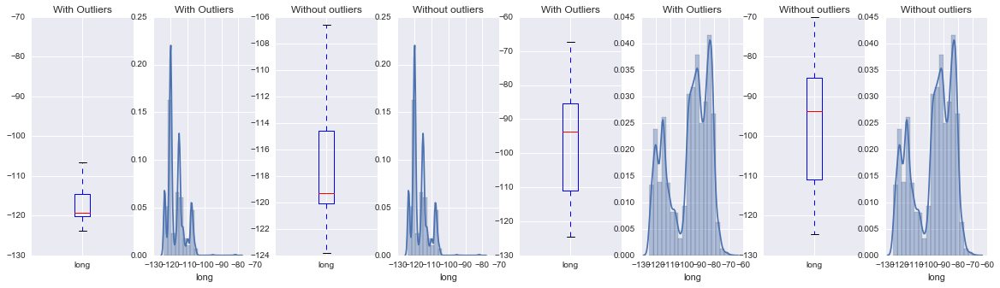

-116.735987959 -97.2584971909


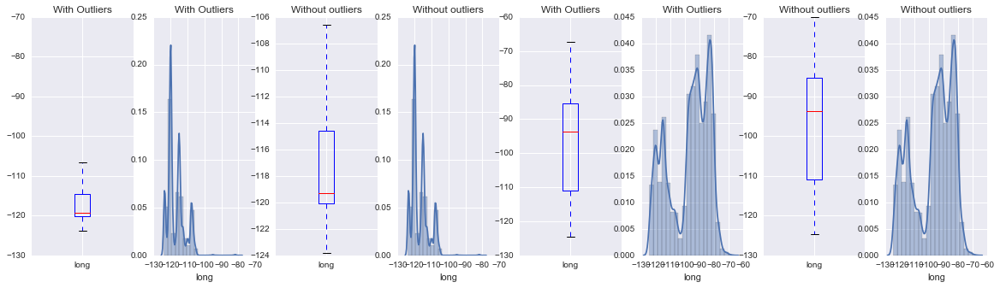

-116.738217934 -97.2511109059


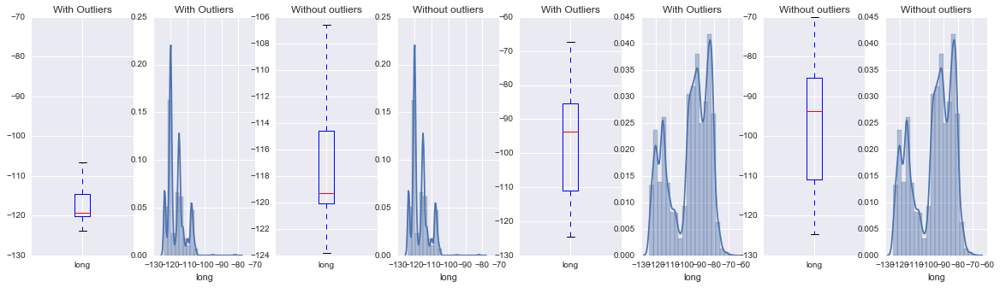

Variable: gmt : Fires, then non-fires
--------------------------------------------------
1338.22843279 1697.65019895


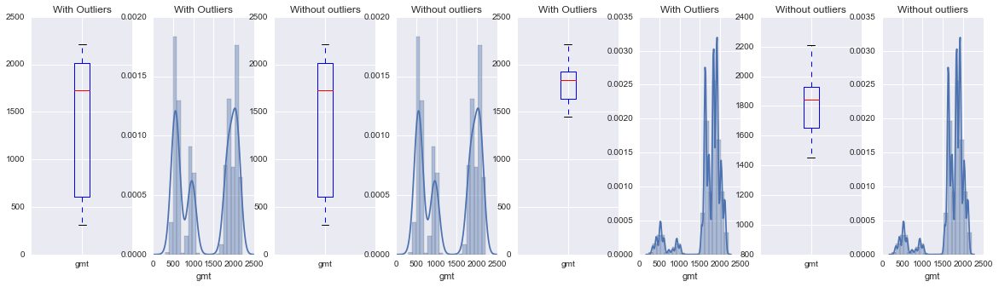

1330.61712526 1706.09236319


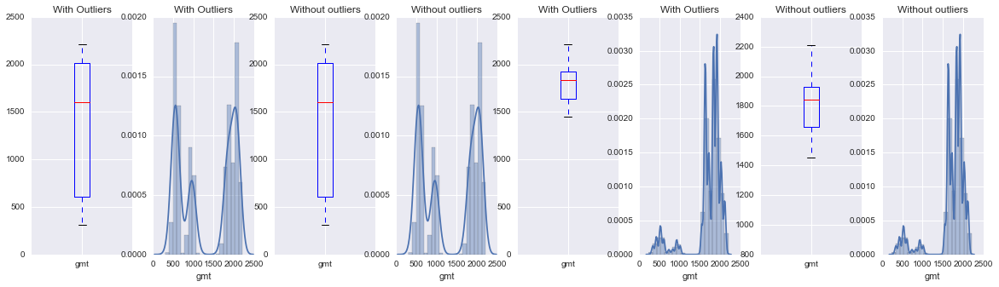

1335.42746903 1705.92407831


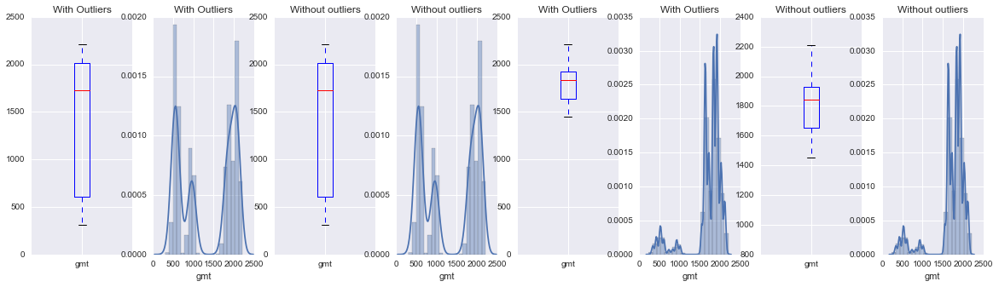

1336.79709045 1705.94381834


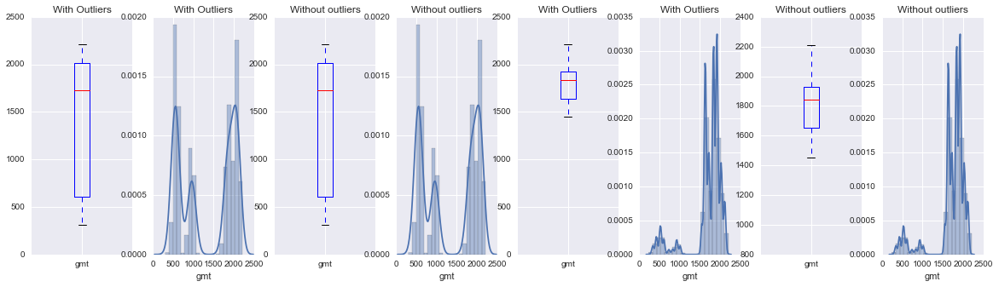

1337.54414331 1705.92286205


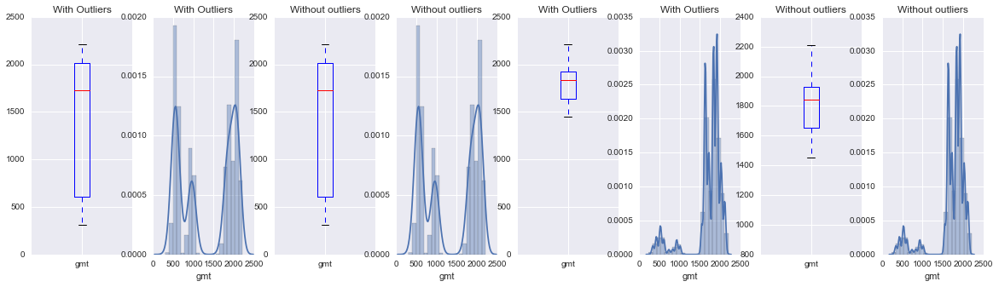

Variable: temp : Fires, then non-fires
--------------------------------------------------
341.637318961 327.017271402


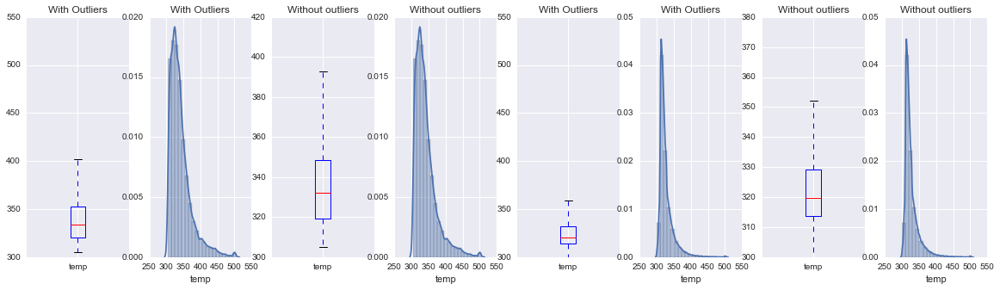

341.149477807 326.833307233


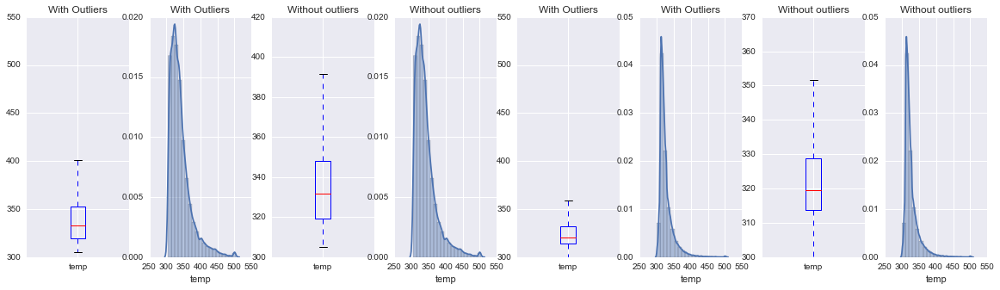

341.122183215 326.808109268


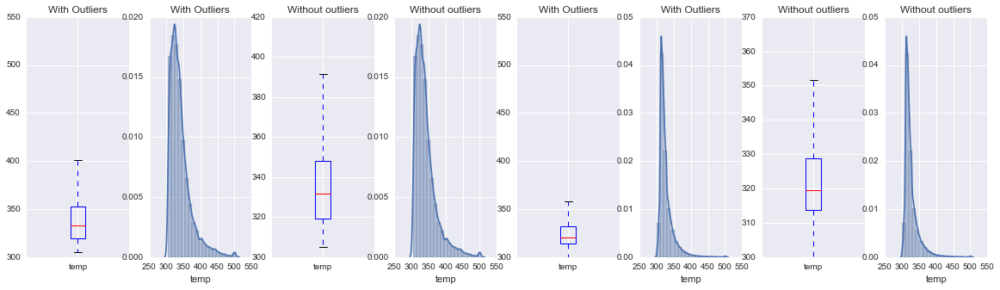

341.103668272 326.800347024


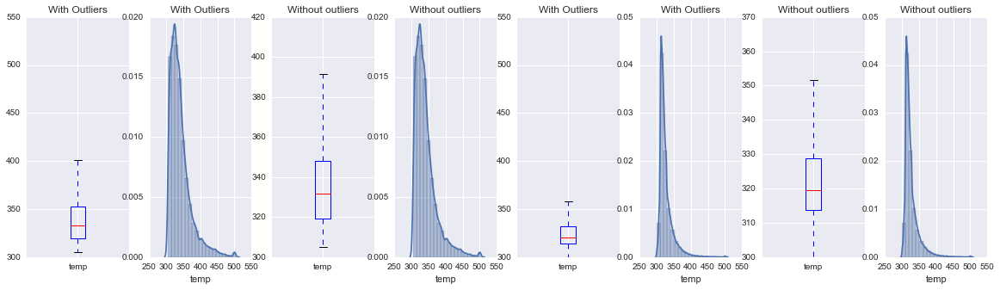

341.089468831 326.798152127


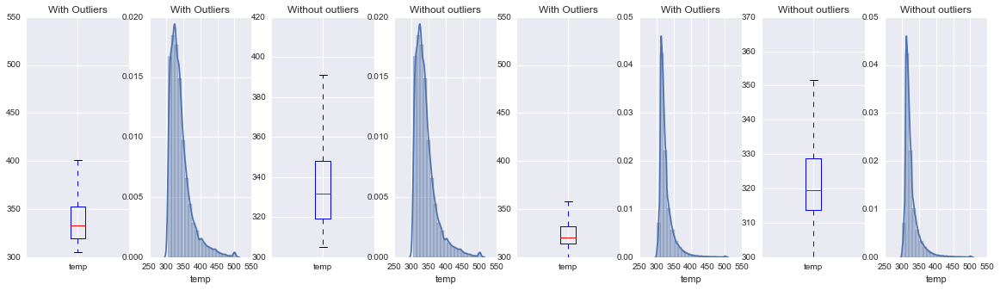

Variable: spix : Fires, then non-fires
--------------------------------------------------
1.67752713264 1.57190639404


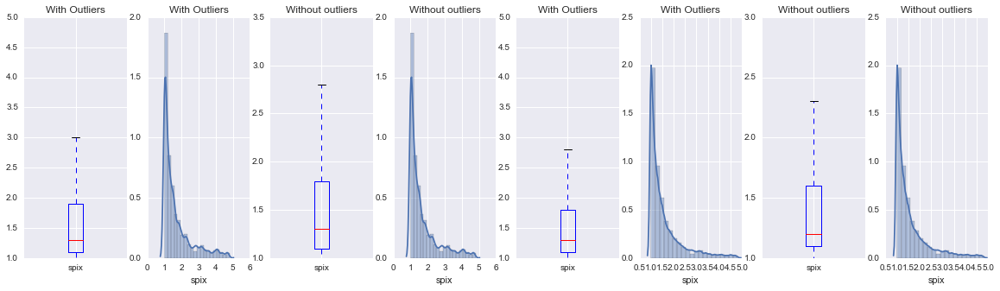

1.65934926692 1.57350707063


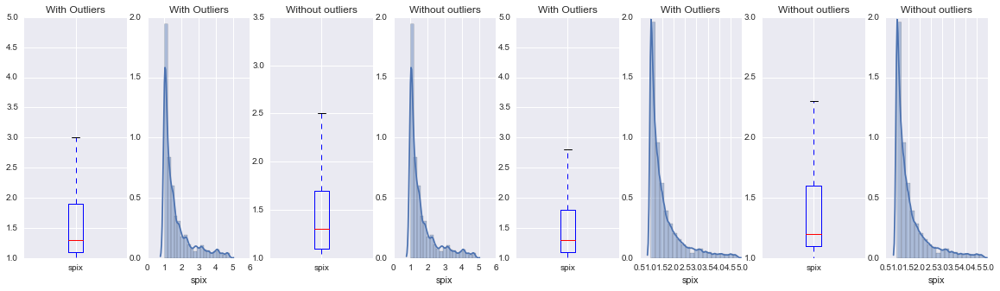

1.65993906074 1.57320339904


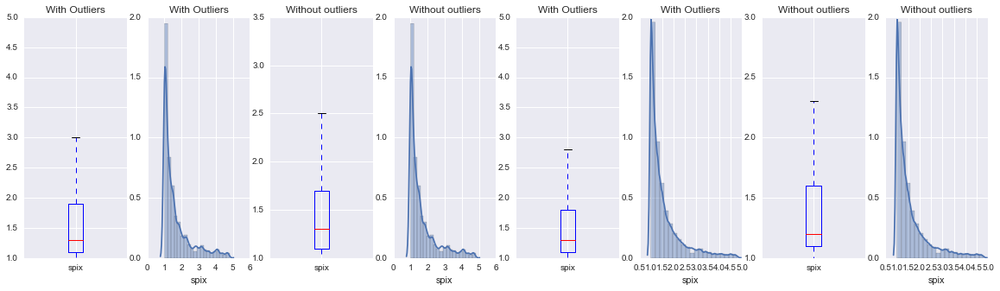

1.65991621033 1.57313818541


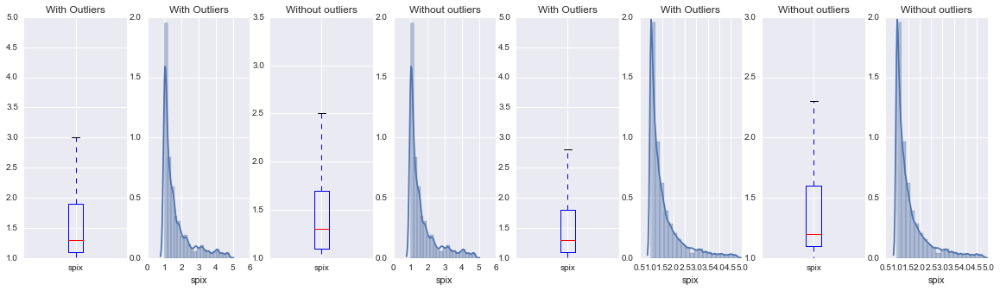

1.65979187934 1.57313265471


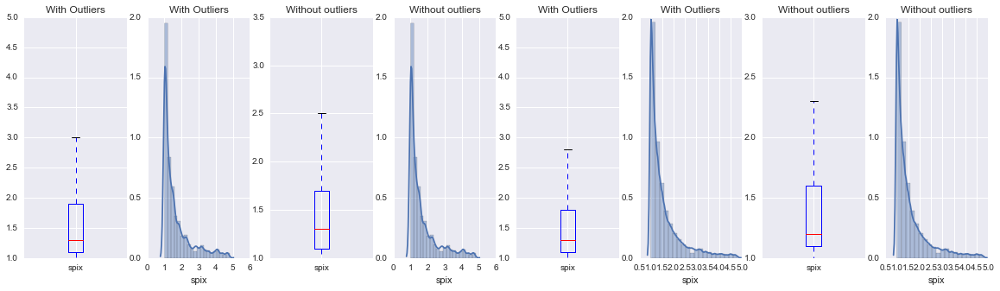

Variable: tpix : Fires, then non-fires
--------------------------------------------------
1.2273104419 1.1967084269


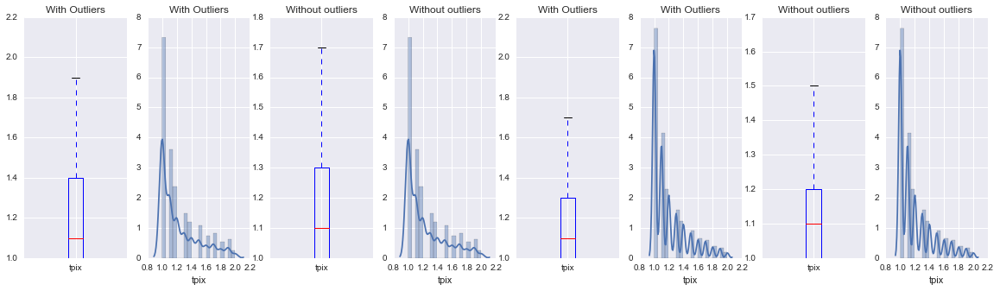

1.22096471848 1.19738791736


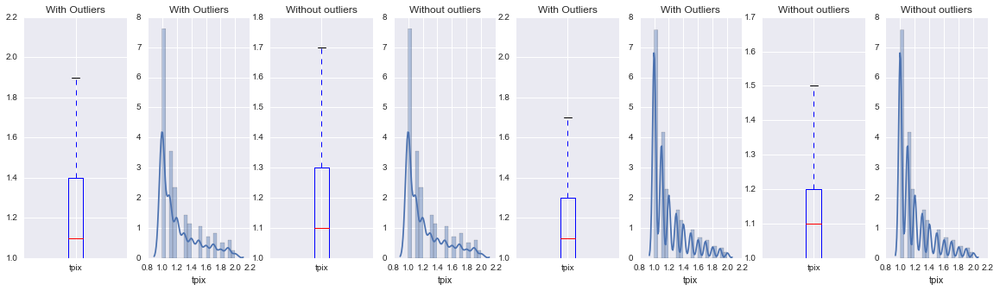

1.22108697092 1.19731255994


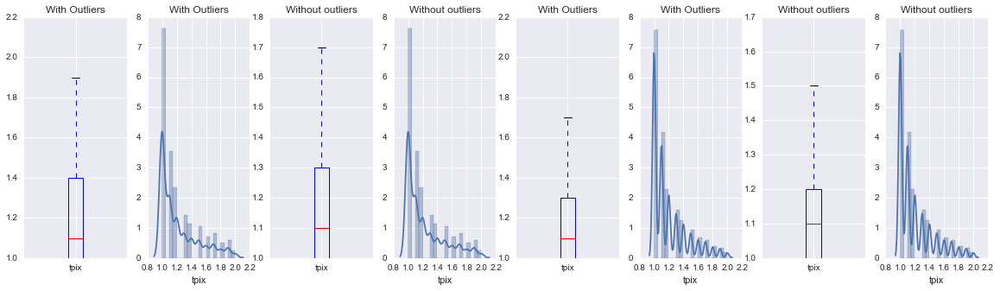

1.22099030151 1.19731308019


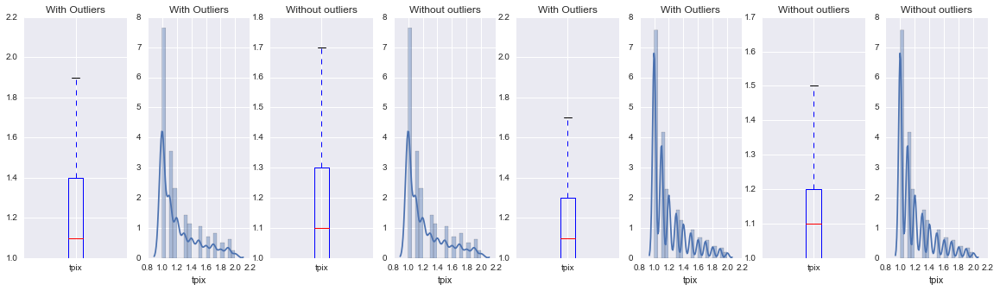

1.22093061547 1.19731682424


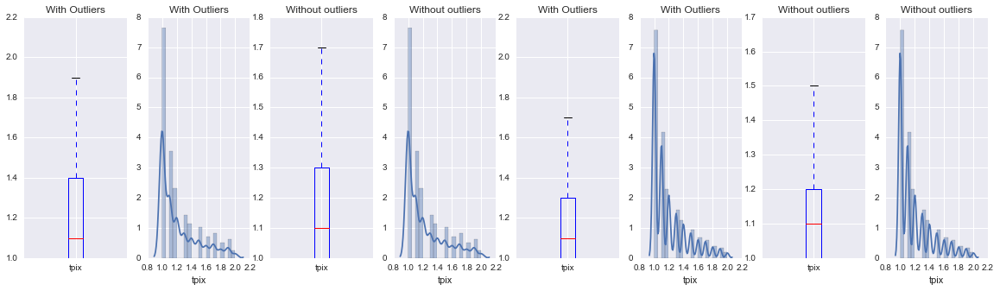

Variable: conf : Fires, then non-fires
--------------------------------------------------
79.2568063118 68.5615503815


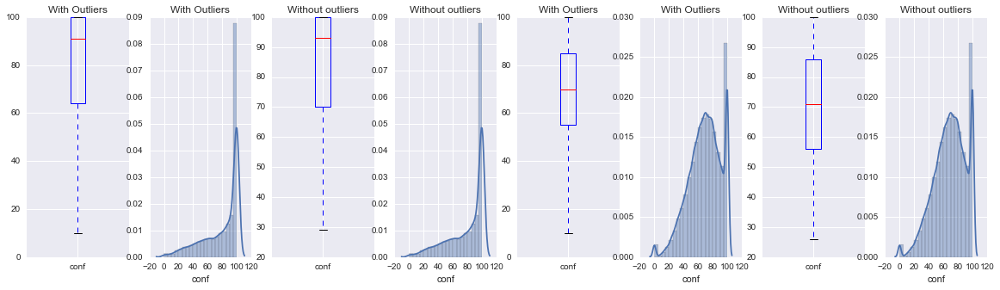

79.0053893017 68.4058867227


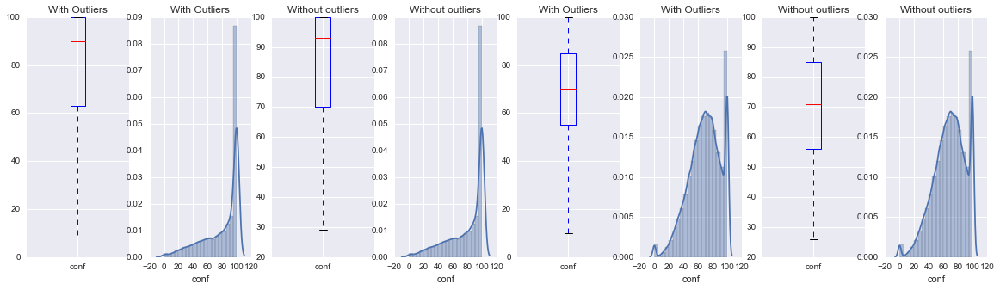

78.9505862092 68.3942361218


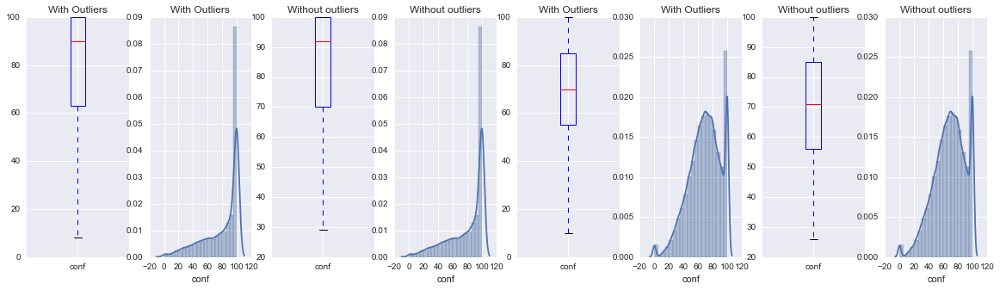

78.9590948077 68.3840019868


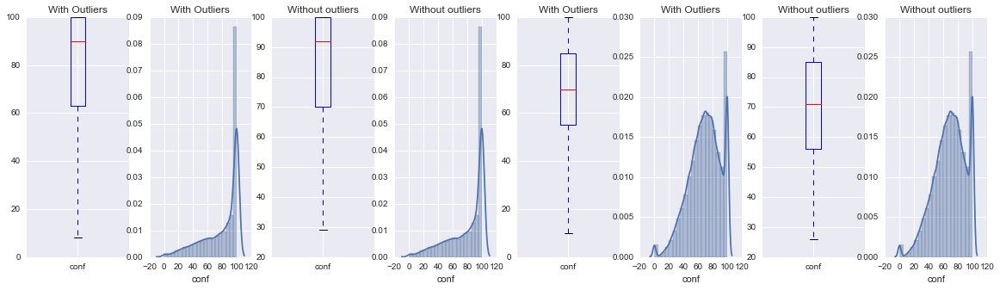

78.9556755689 68.3809357542


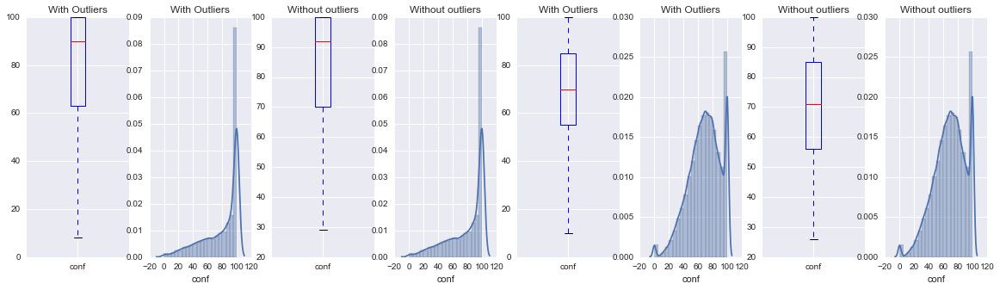

Variable: frp : Fires, then non-fires
--------------------------------------------------
163.541289773 74.5752688807


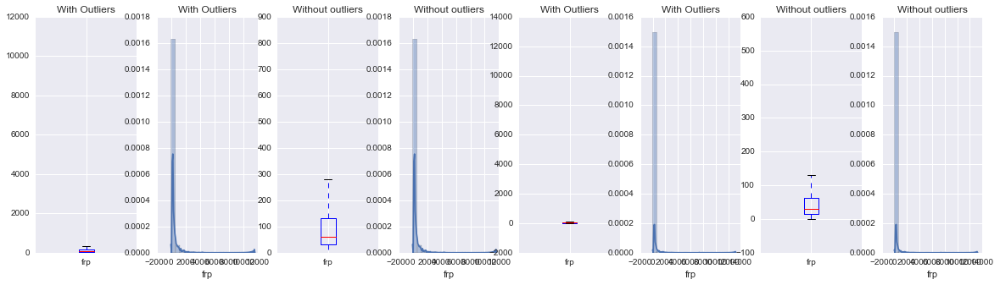

158.07510879 73.9551515517


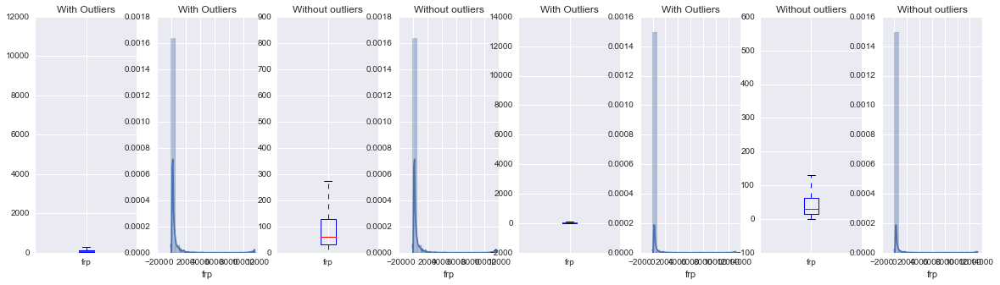

157.828462608 73.8245612035


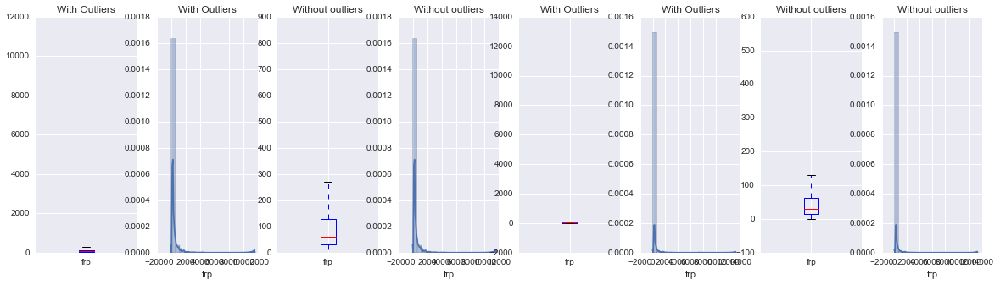

157.560826681 73.8113558105


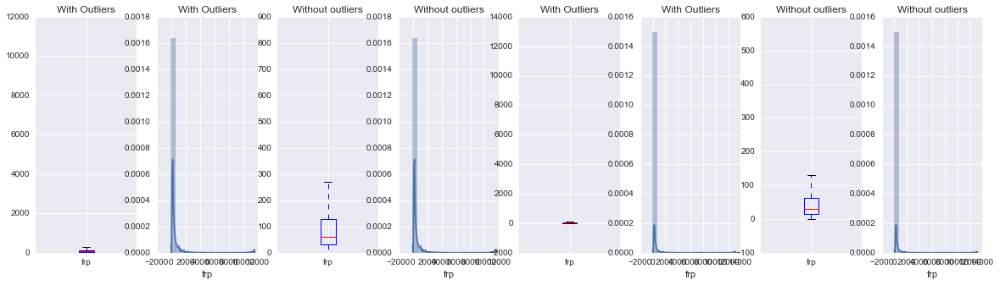

157.38913294 73.8165603513


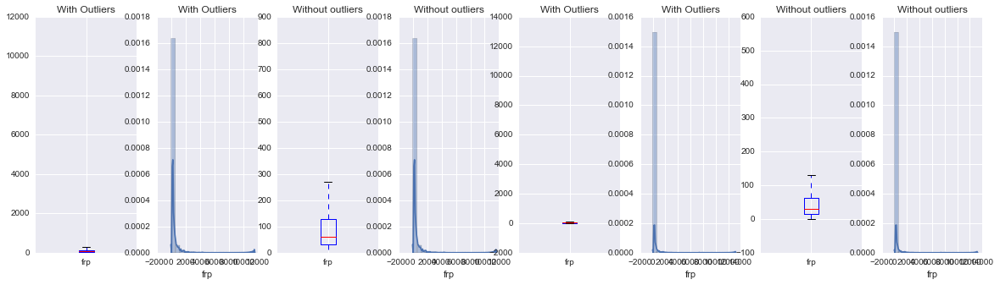

Variable: county_aland : Fires, then non-fires
--------------------------------------------------
8762586416.48 4636916122.54


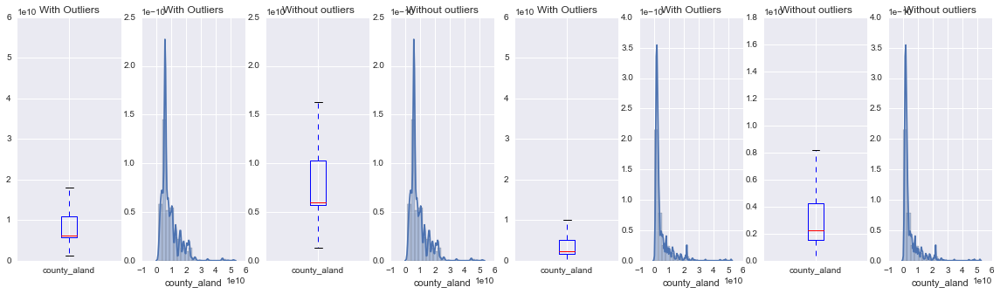

8784019629.77 4553193959.99


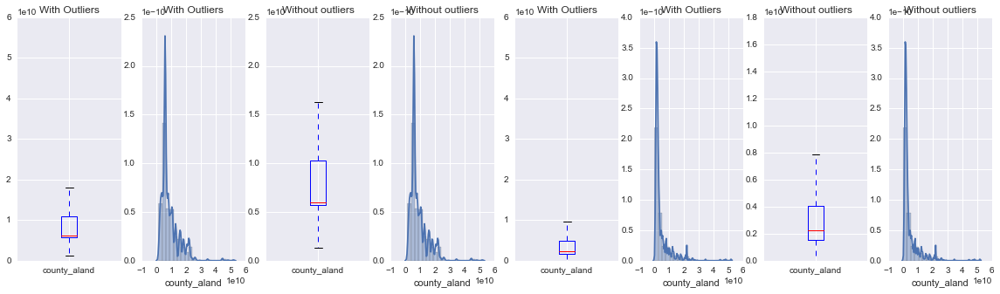

8797583295.3 4541367040.45


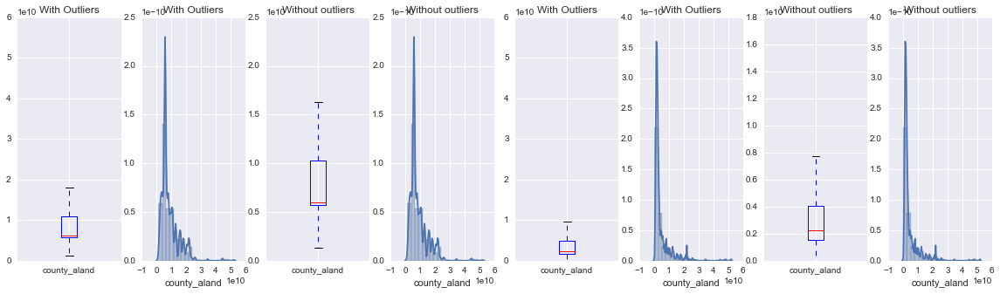

8796144147.41 4538231609.61


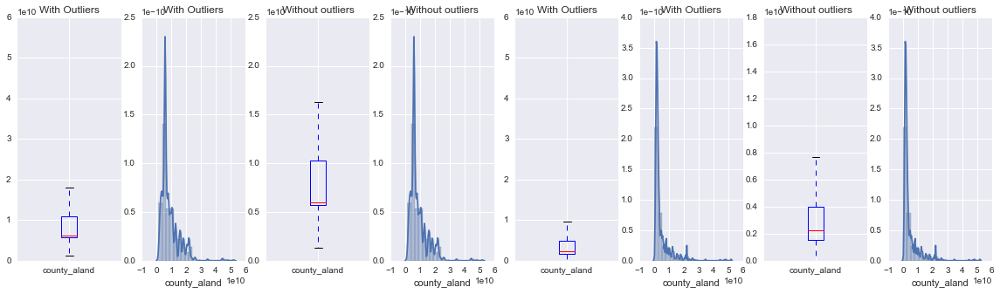

8794337470.52 4537084706.36


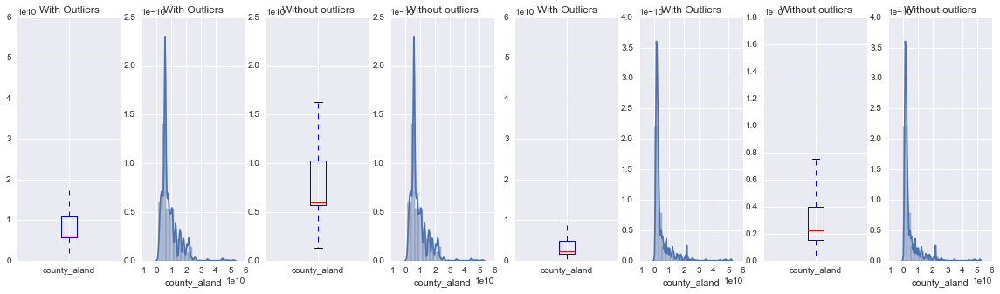

Variable: county_awater : Fires, then non-fires
--------------------------------------------------
178786078.287 161762204.507


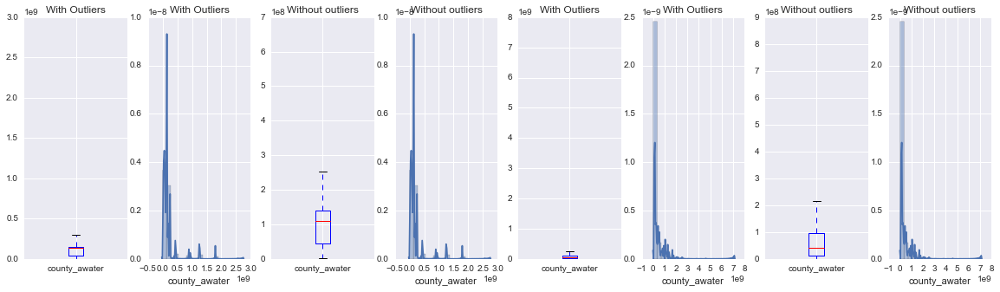

172147147.878 162761754.251


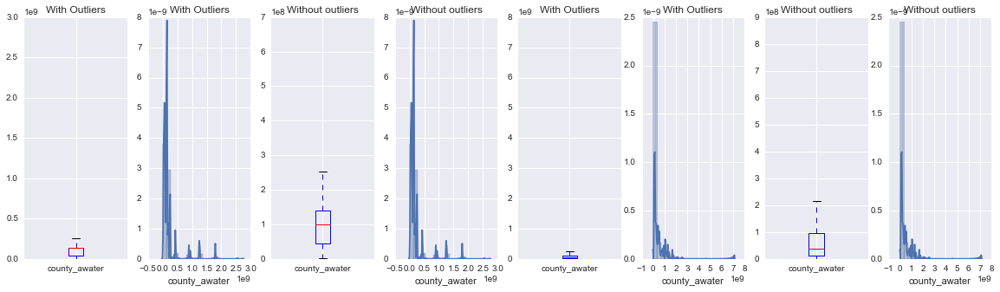

172091473.214 162752885.865


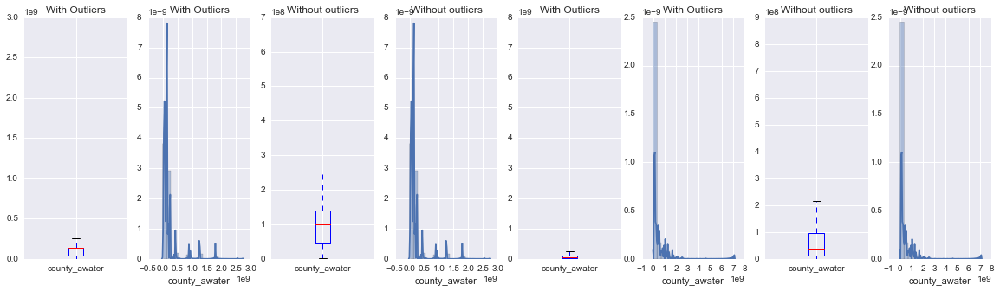

171993637.578 162765271.062


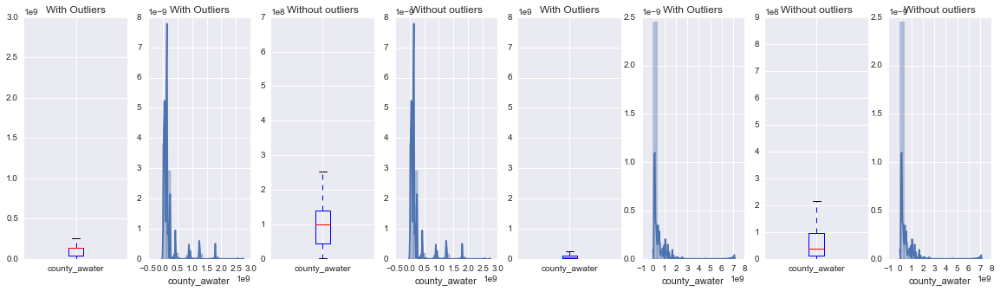

171914348.754 162778154.202


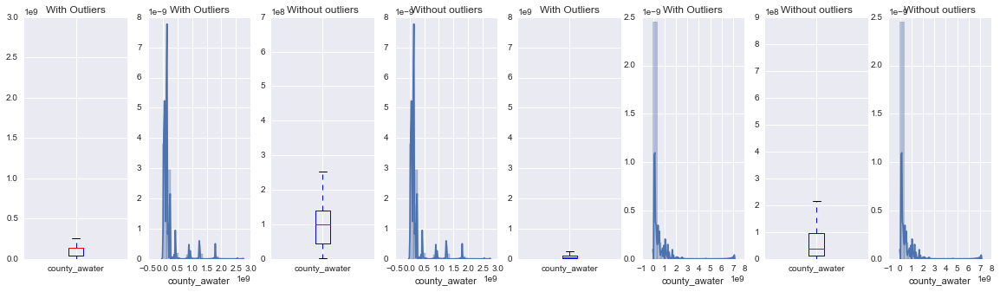

Categorical Vars
--------------------------------------------------
Variable: urban_areas_bool : Fires, then non-fires
--------------------------------------------------


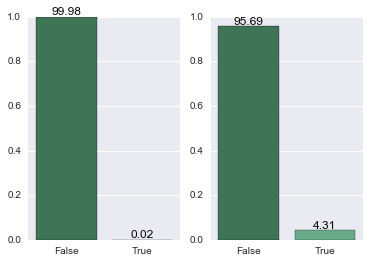

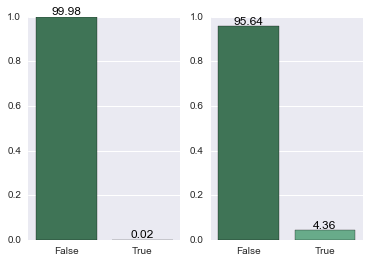

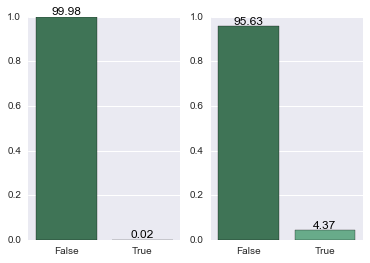

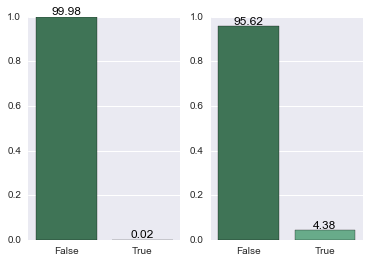

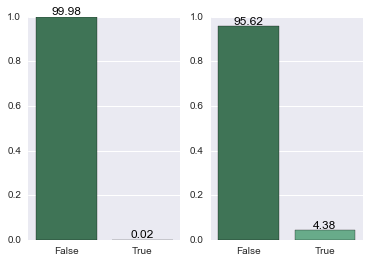

Variable: src : Fires, then non-fires
--------------------------------------------------


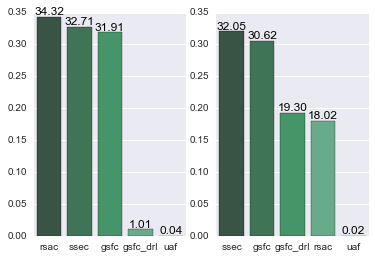

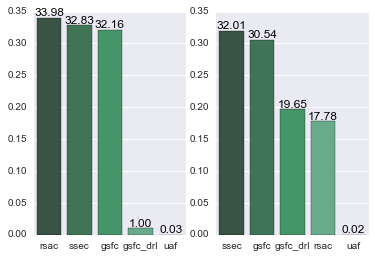

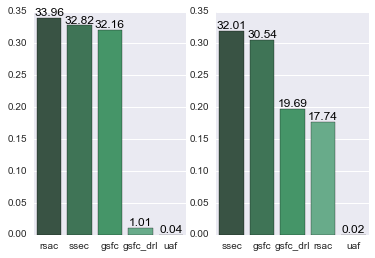

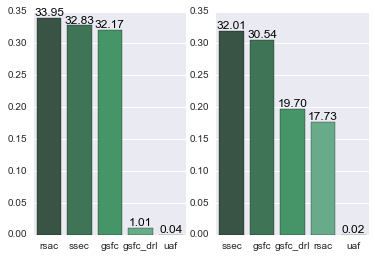

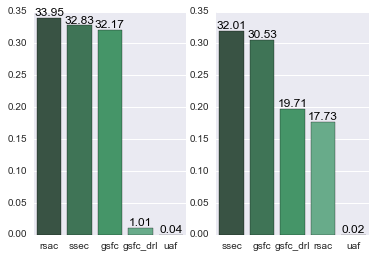

Variable: sat_src : Fires, then non-fires
--------------------------------------------------


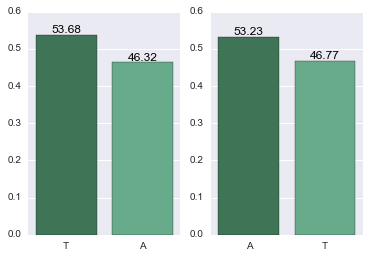

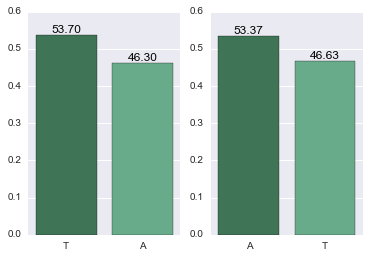

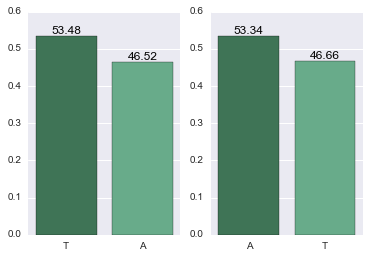

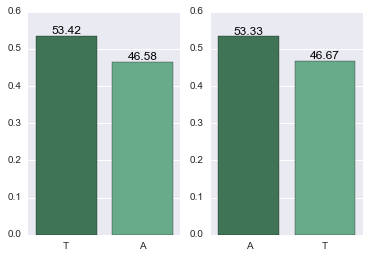

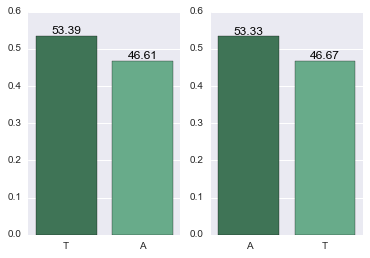

In [49]:
check_dists(2013, continous_vars, categorical_vars)

Continuous Vars
--------------------------------------------------
Variable: lat : Fires, then non-fires
--------------------------------------------------
42.5875127027 36.2203403559


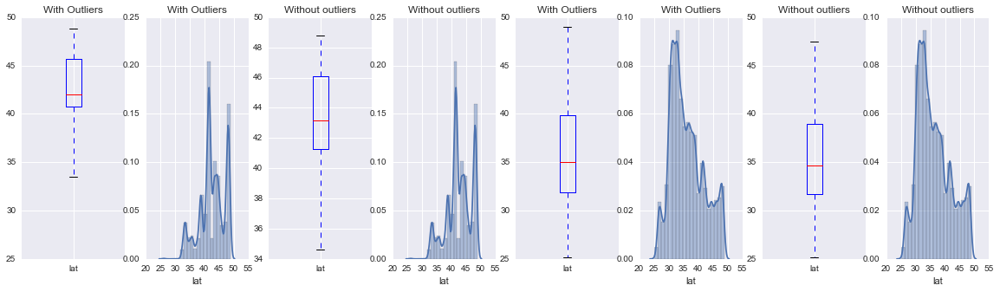

42.6588311819 36.1489423604


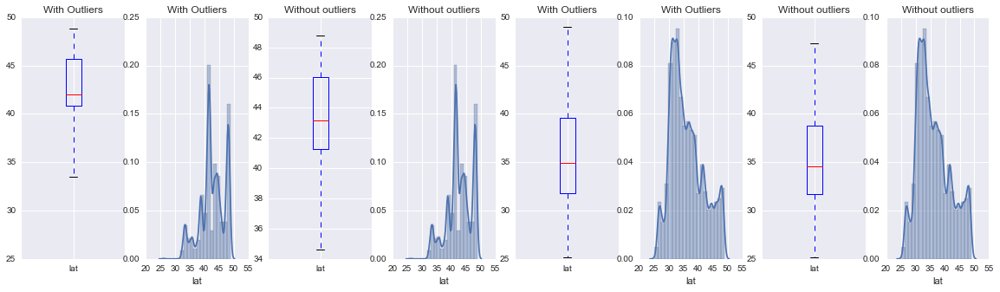

42.6639742193 36.1419821362


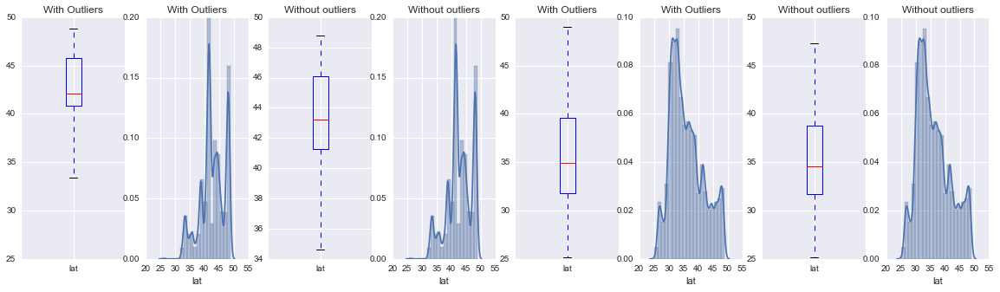

42.6637544444 36.1408955806


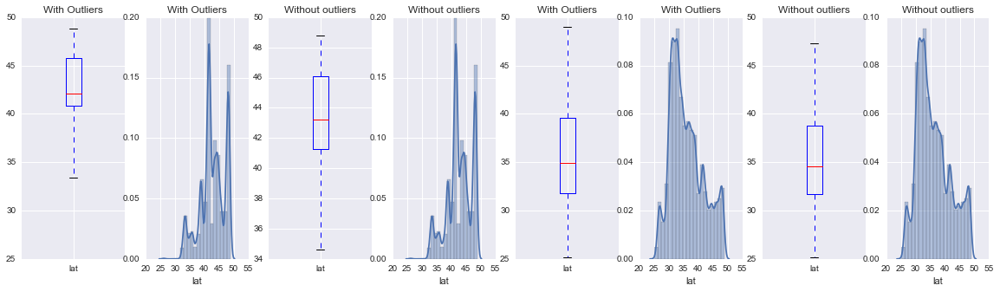

42.6629003868 36.1406468236


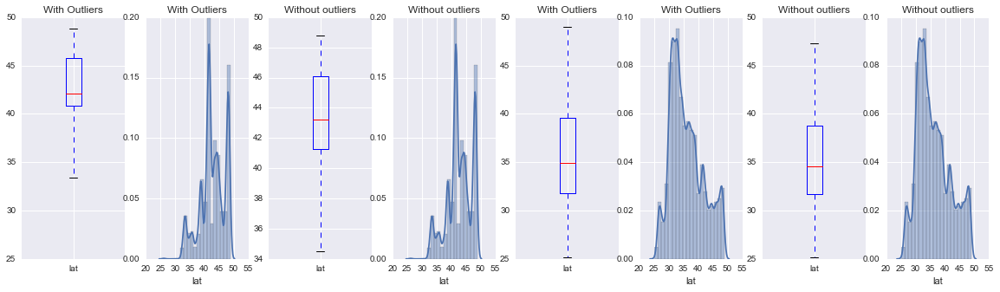

Variable: long : Fires, then non-fires
--------------------------------------------------
-119.401642696 -96.1366039399


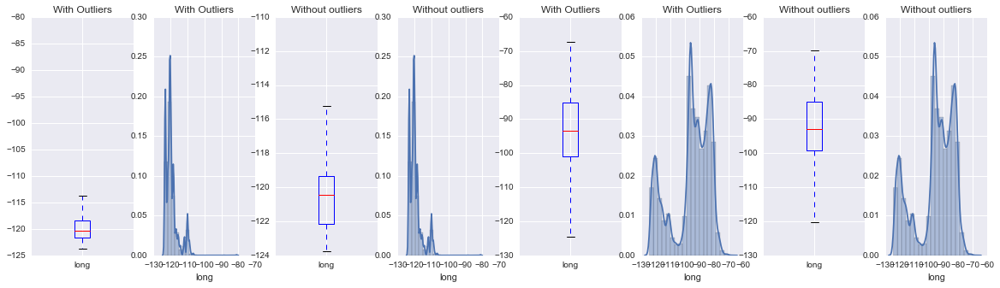

-119.41508866 -95.9078514596


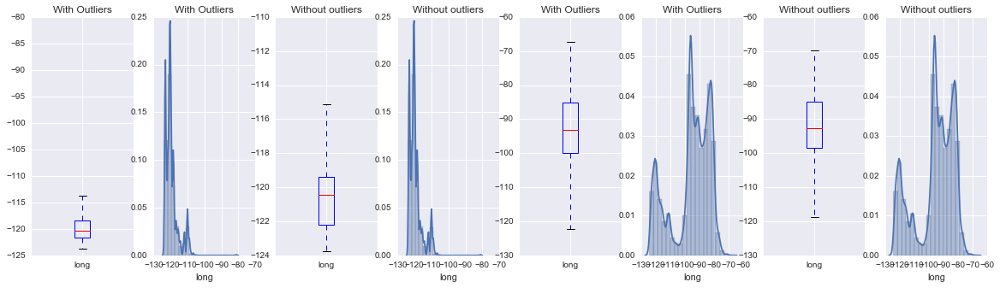

-119.40145895 -95.8869393728


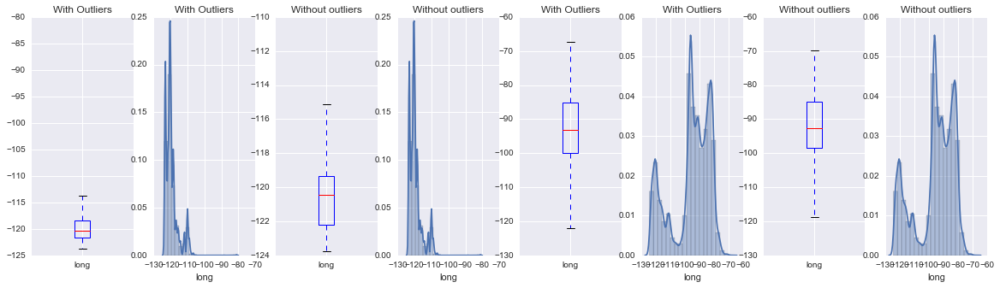

-119.399588046 -95.8831634776


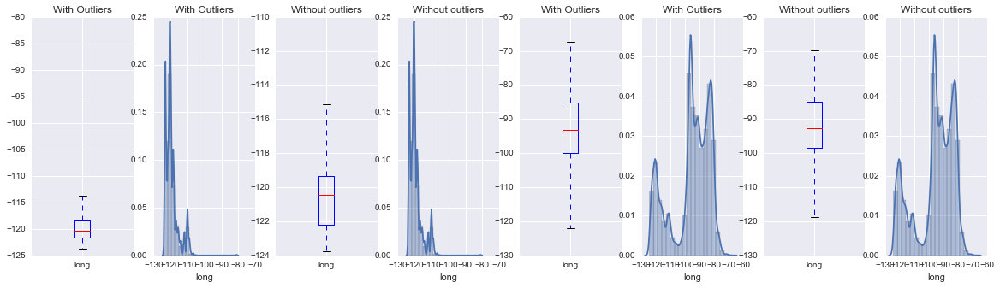

-119.395270576 -95.8824293109


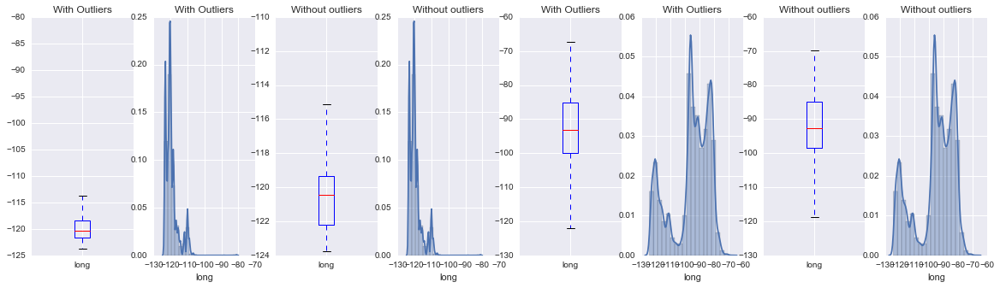

Variable: gmt : Fires, then non-fires
--------------------------------------------------
1309.60137055 1717.16741138


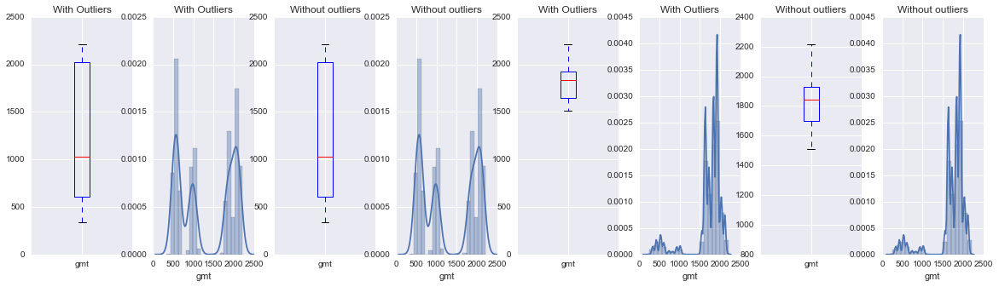

1296.3919765 1722.86139275


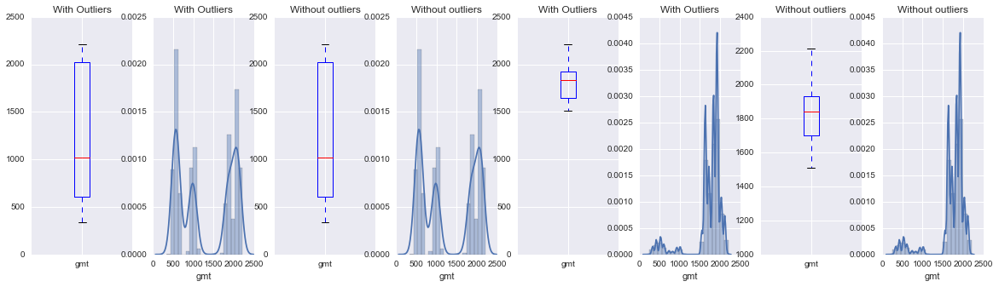

1297.73310059 1723.09738581


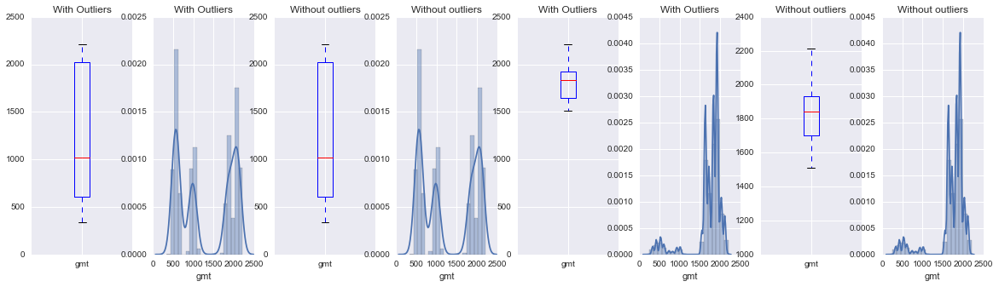

1298.11701149 1723.11973099


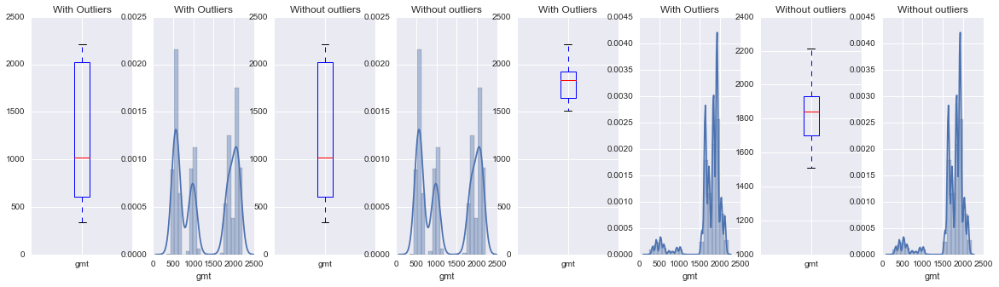

1298.21201792 1723.13076919


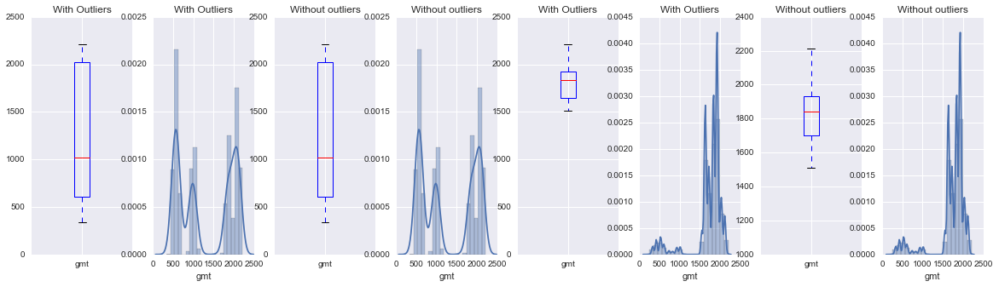

Variable: temp : Fires, then non-fires
--------------------------------------------------
338.391902056 322.887422626


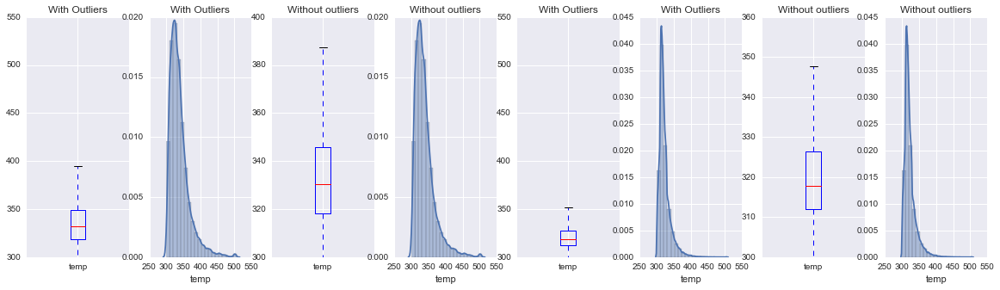

337.819788204 322.8105155


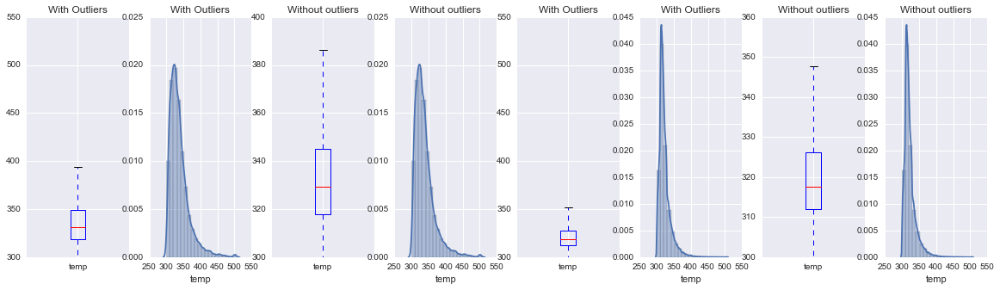

337.705643367 322.810985828


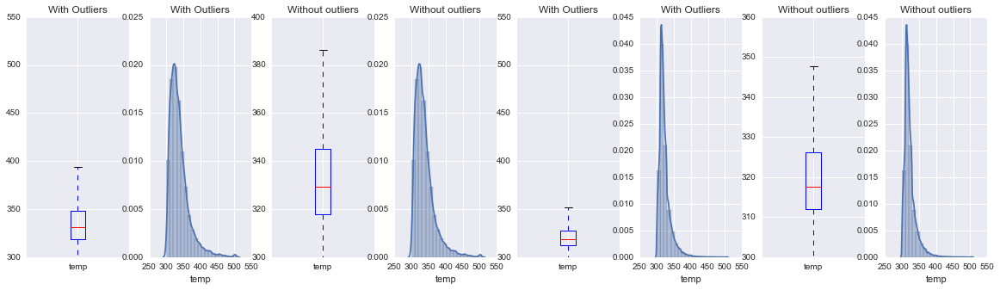

337.690712644 322.810398684


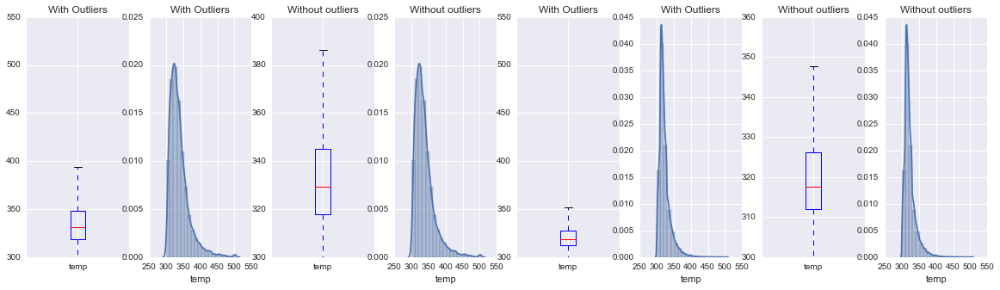

337.680808855 322.810876137


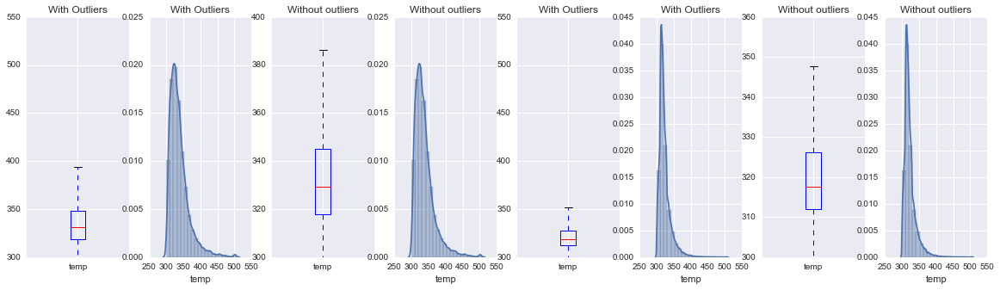

Variable: spix : Fires, then non-fires
--------------------------------------------------
1.69332274779 1.54121768207


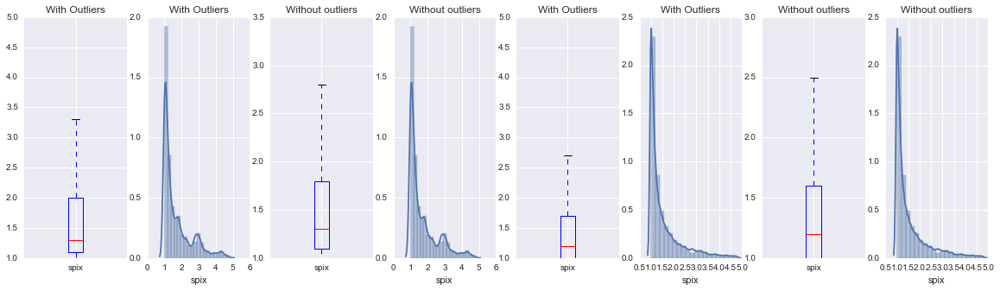

1.66434258329 1.54350097975


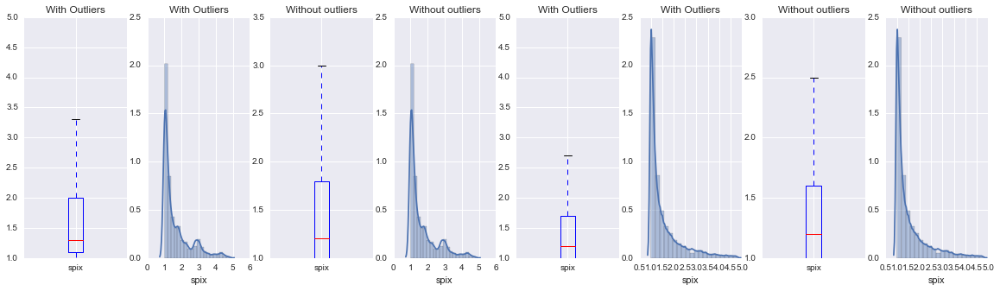

1.66237627561 1.54364206037


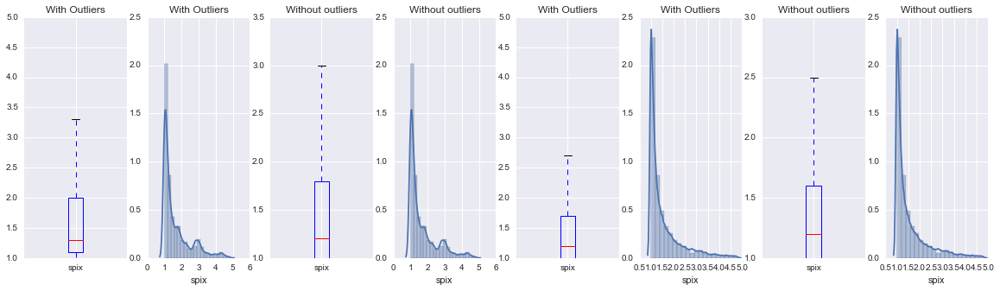

1.66185823755 1.54368976479


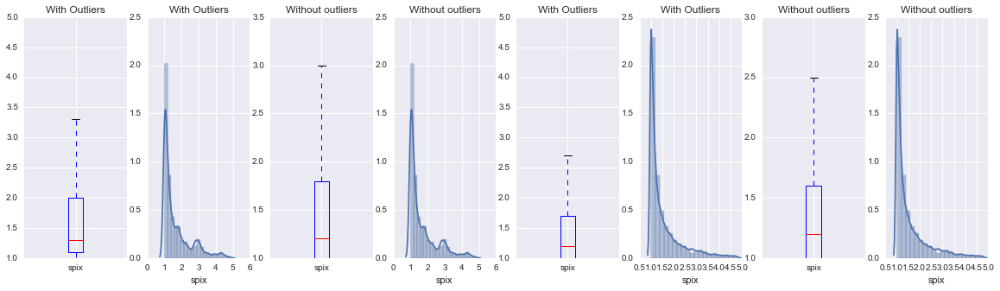

1.66169430508 1.54370475822


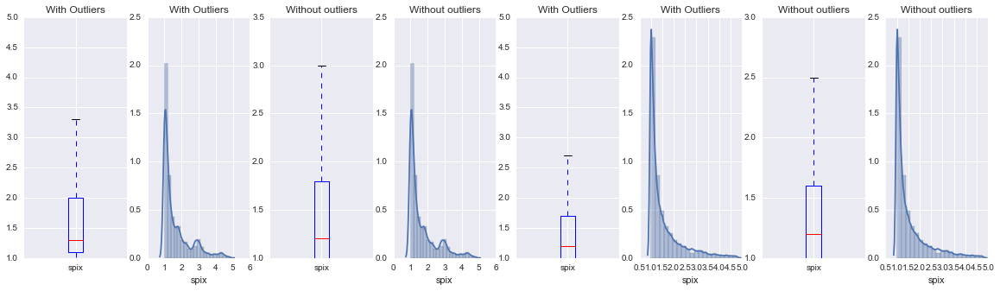

Variable: tpix : Fires, then non-fires
--------------------------------------------------
1.23835450443 1.1894607209


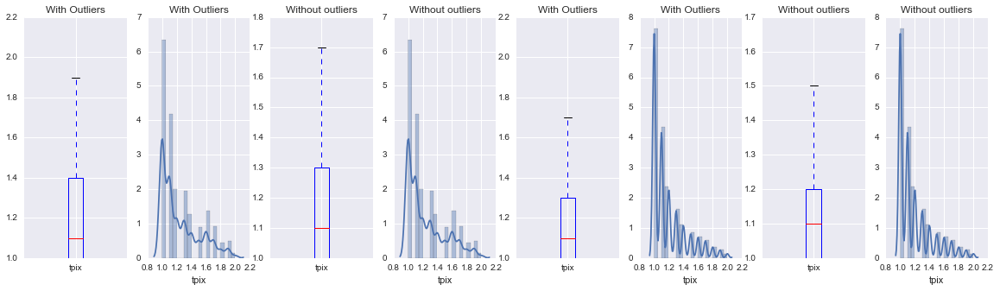

1.22868130169 1.19024116967


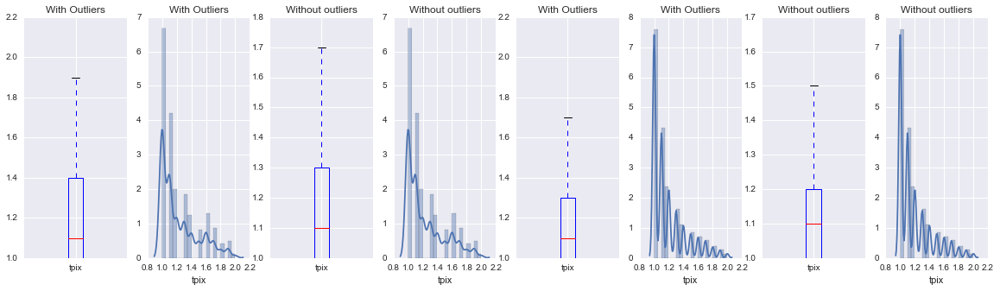

1.22809790532 1.19028052988


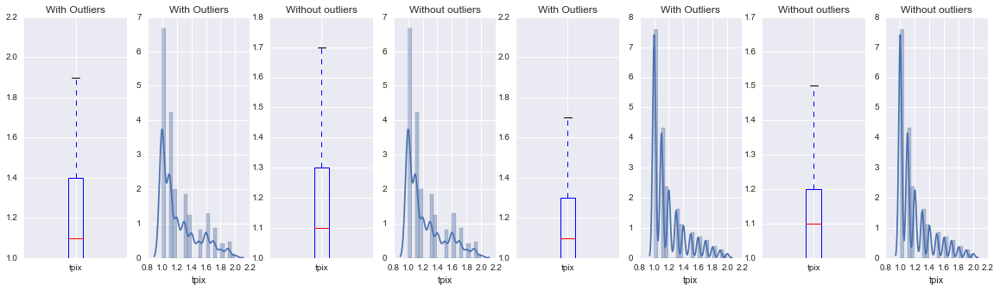

1.22793869732 1.19029496388


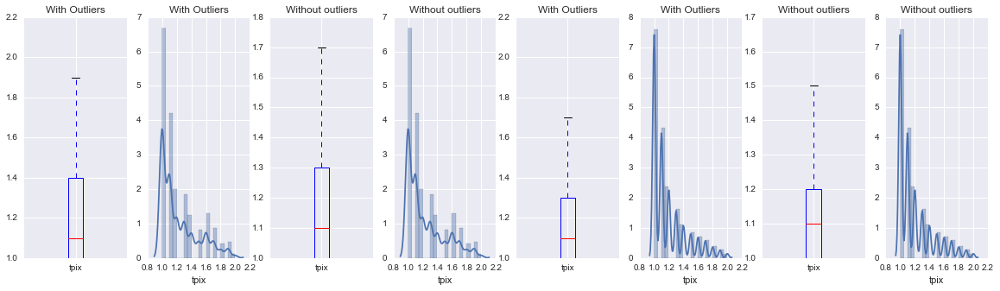

1.22788862931 1.19029945722


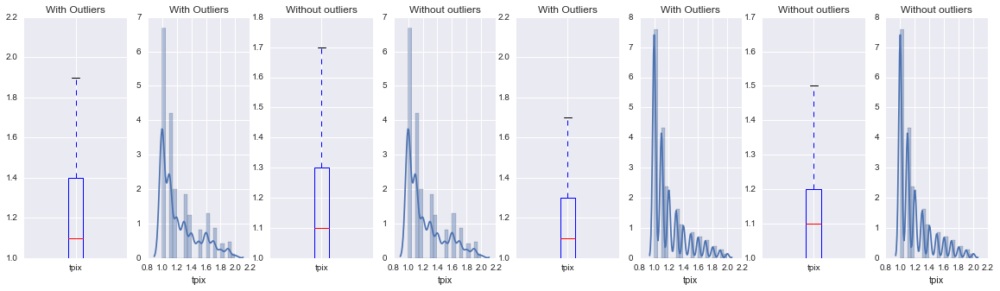

Variable: conf : Fires, then non-fires
--------------------------------------------------
78.7375062678 66.8729922576


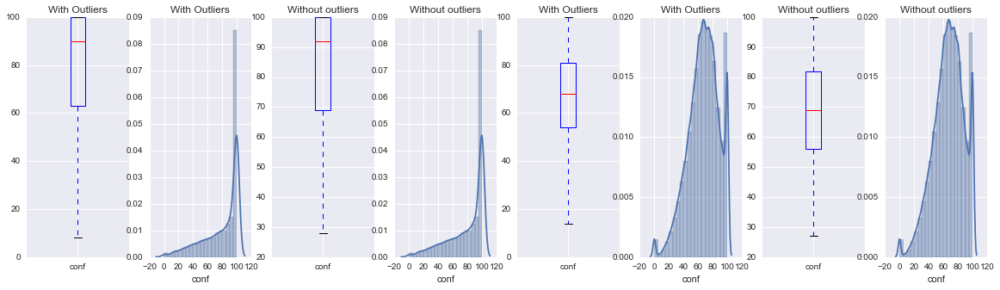

78.4286542475 66.7973772798


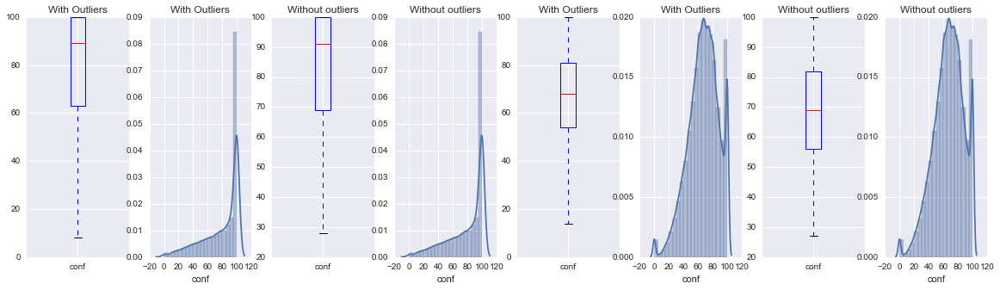

78.3305839024 66.7990022028


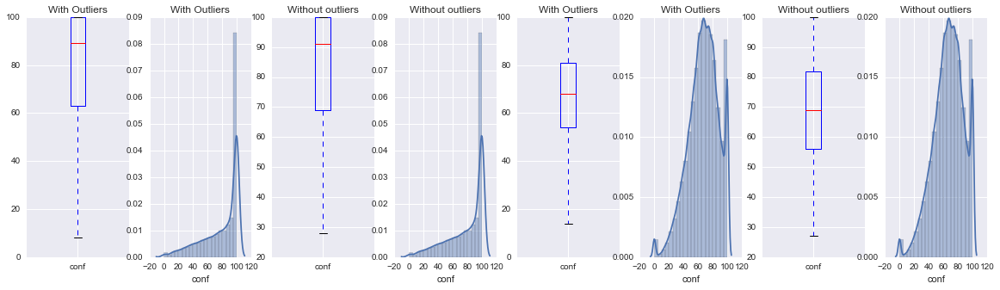

78.3168582375 66.7988320155


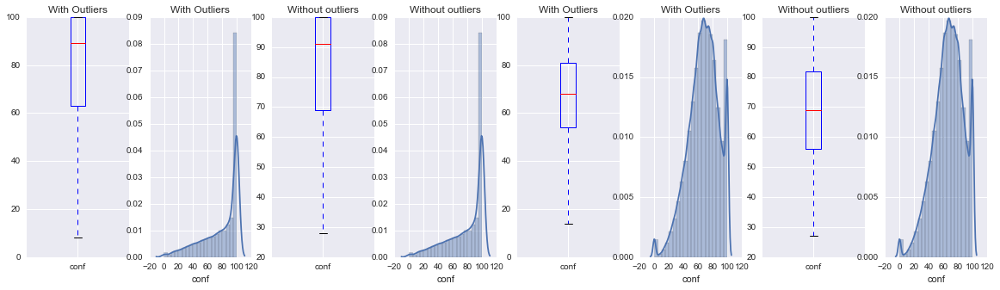

78.3011757497 66.8002545361


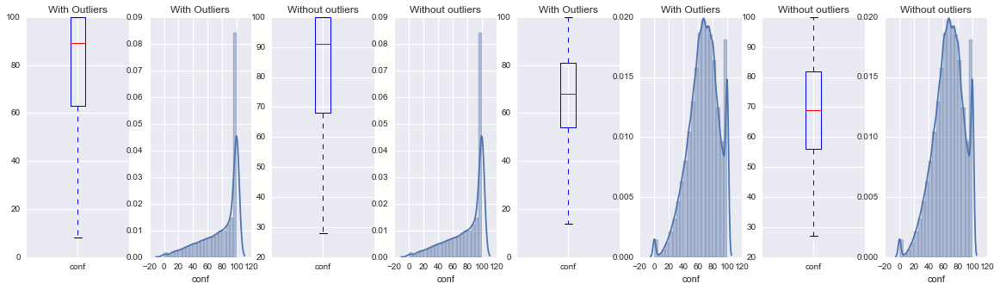

Variable: frp : Fires, then non-fires
--------------------------------------------------
137.2390941 48.4326851502


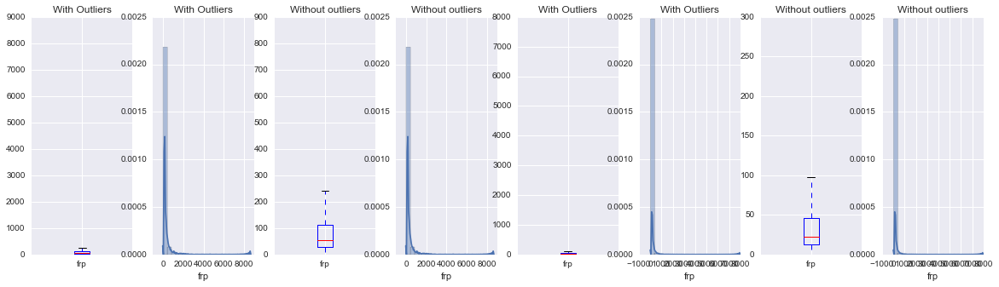

131.84965216 48.2668024921


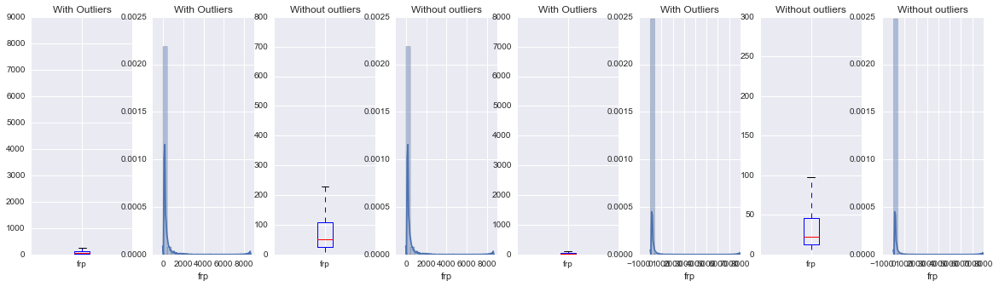

131.131005908 48.2803025579


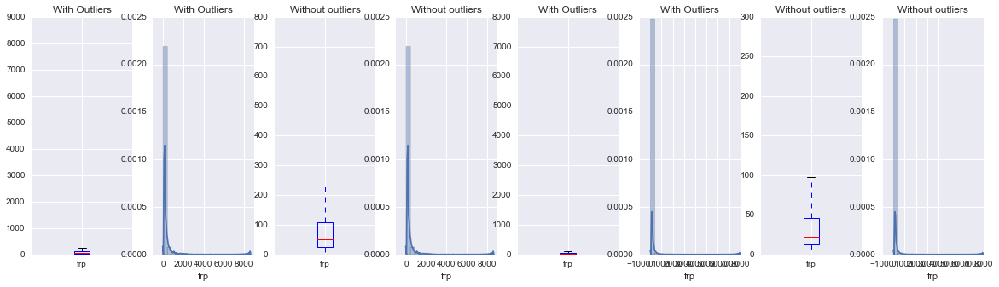

131.018547893 48.2808972656


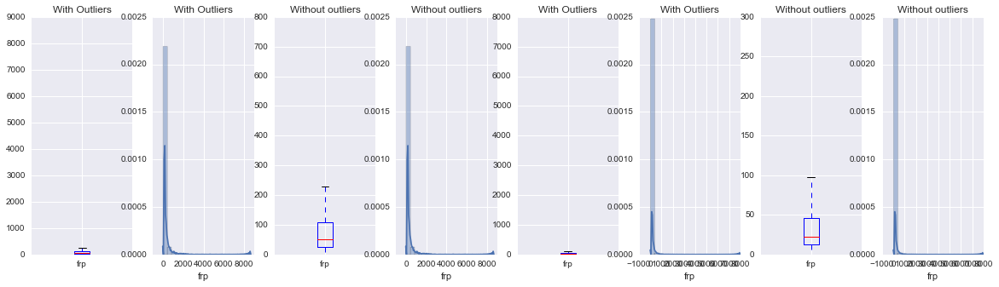

130.969353912 48.2827805808


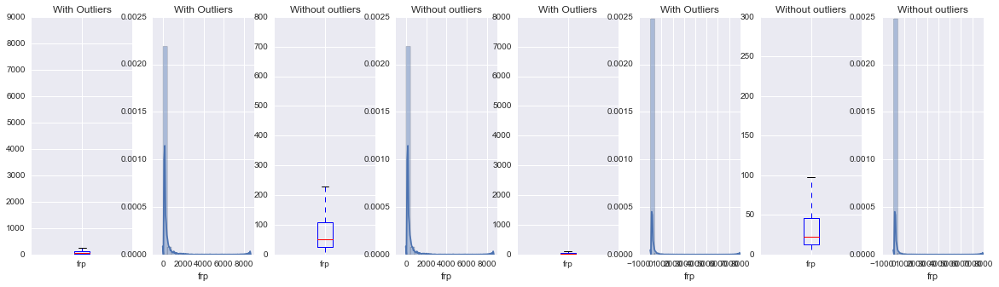

Variable: county_aland : Fires, then non-fires
--------------------------------------------------
13855806586.0 4418121024.26


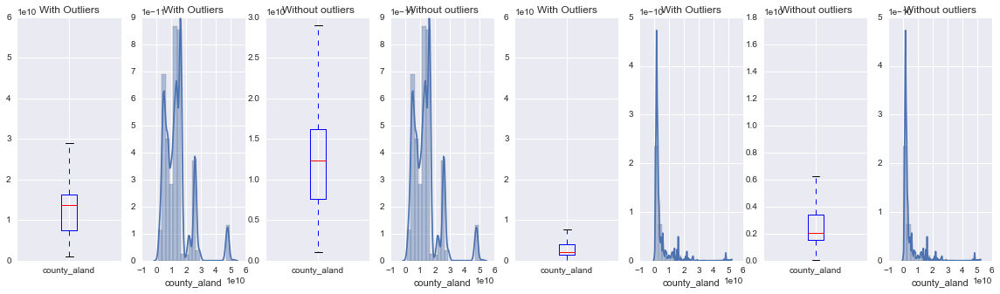

13768726566.0 4337354924.05


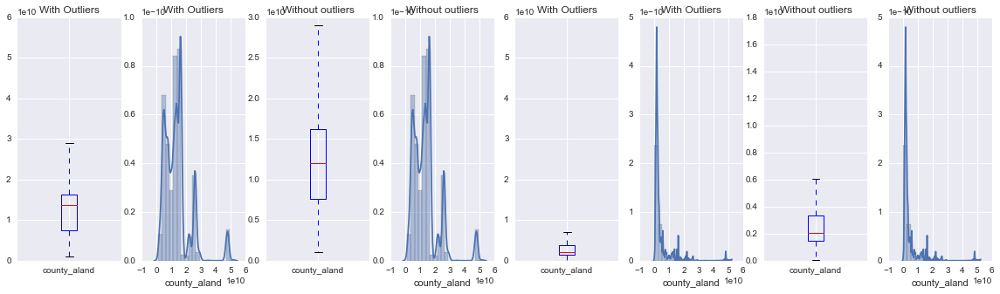

13785609387.8 4326034698.6


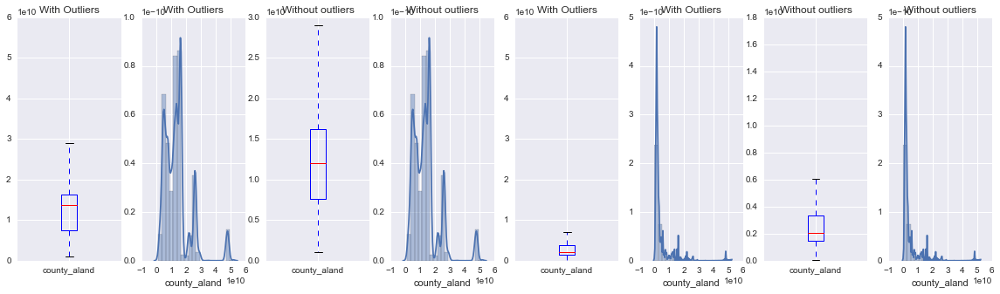

13791437729.5 4323651722.11


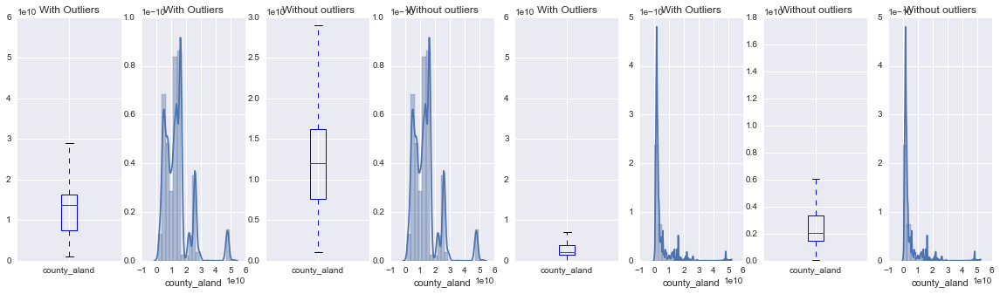

13792736117.4 4322957291.96


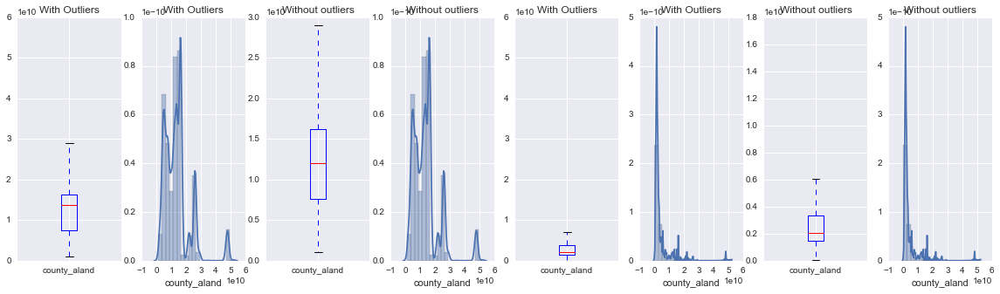

Variable: county_awater : Fires, then non-fires
--------------------------------------------------
154291277.691 158464386.938


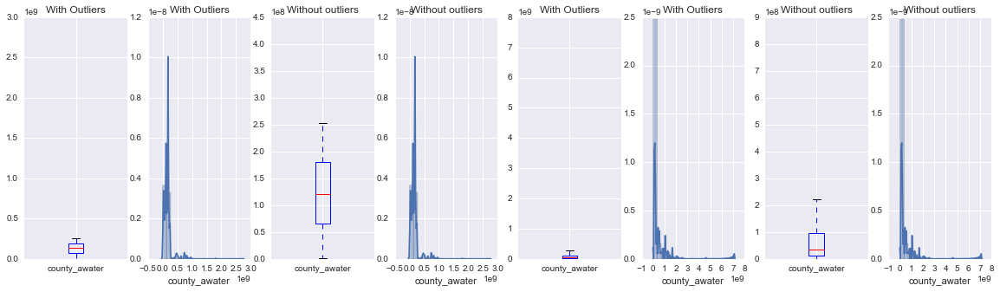

154245760.443 158511022.578


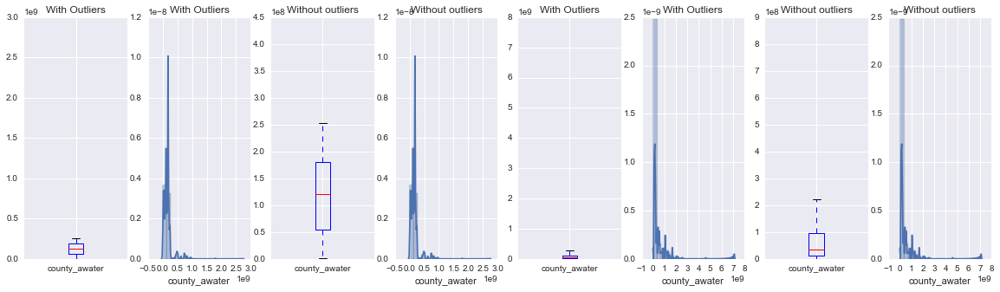

153940231.969 158555193.388


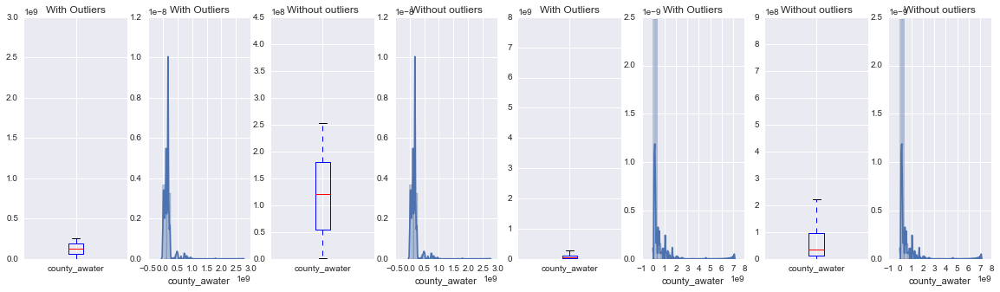

153894930.591 158561930.047


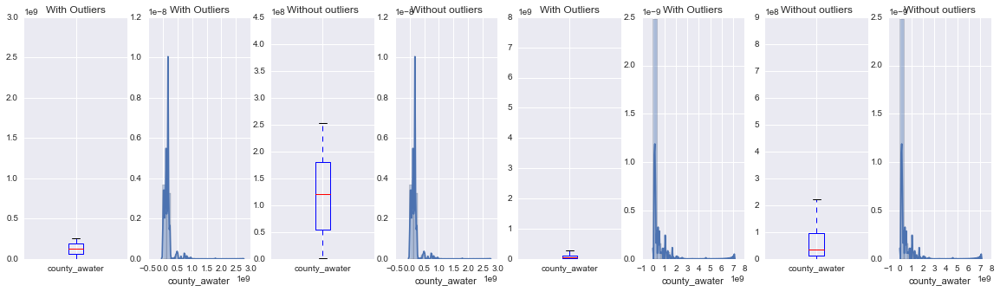

153860773.5 158566674.745


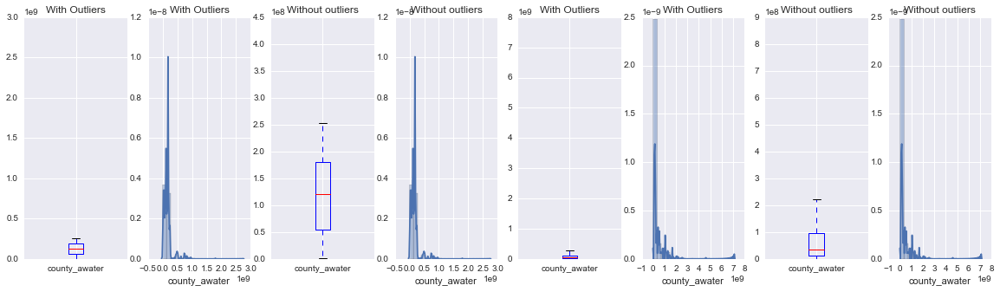

Categorical Vars
--------------------------------------------------
Variable: urban_areas_bool : Fires, then non-fires
--------------------------------------------------


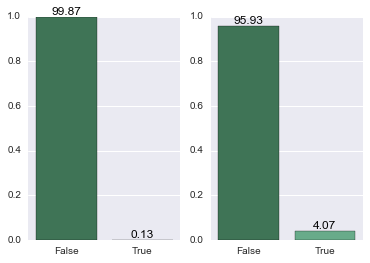

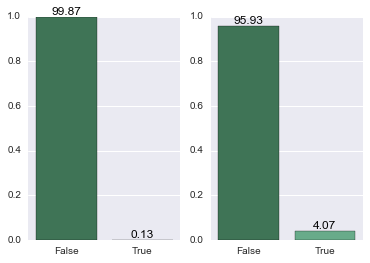

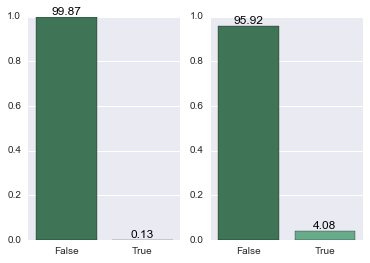

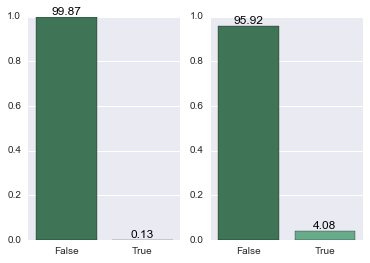

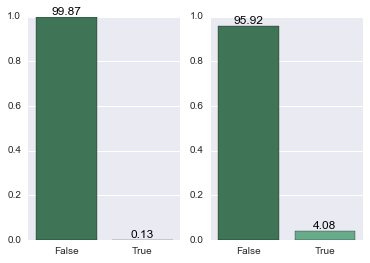

Variable: src : Fires, then non-fires
--------------------------------------------------


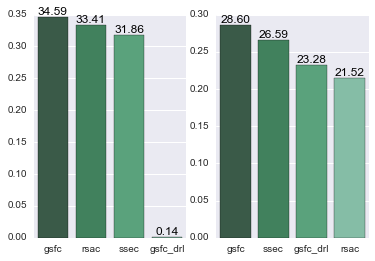

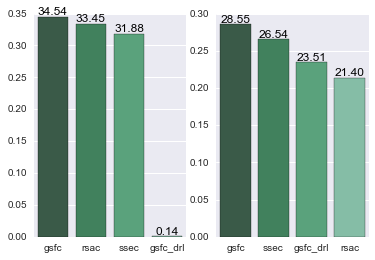

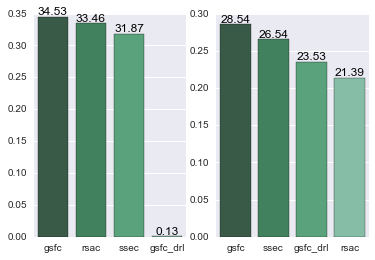

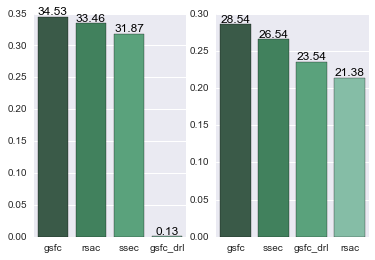

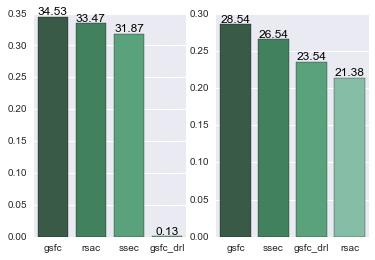

Variable: sat_src : Fires, then non-fires
--------------------------------------------------


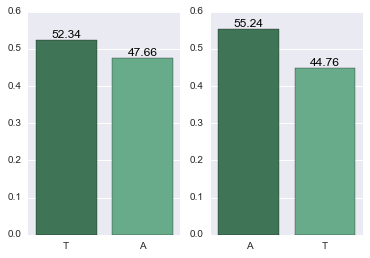

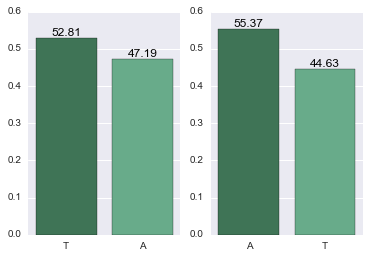

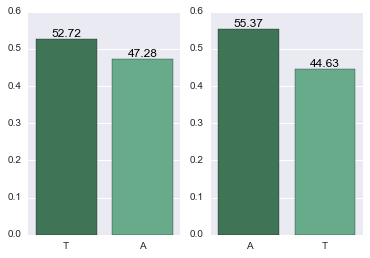

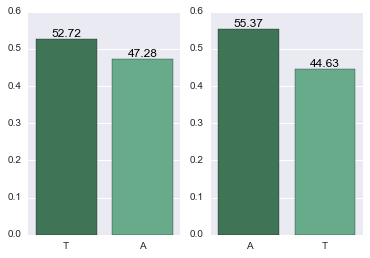

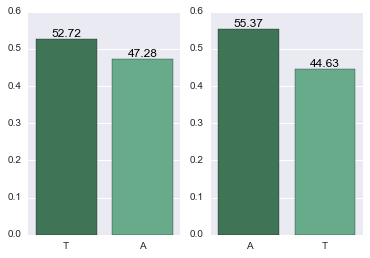

In [51]:
check_dists(2014, continous_vars, categorical_vars)

Continuous Vars
--------------------------------------------------
Variable: lat : Fires, then non-fires
--------------------------------------------------
45.0862131841 38.7130995033


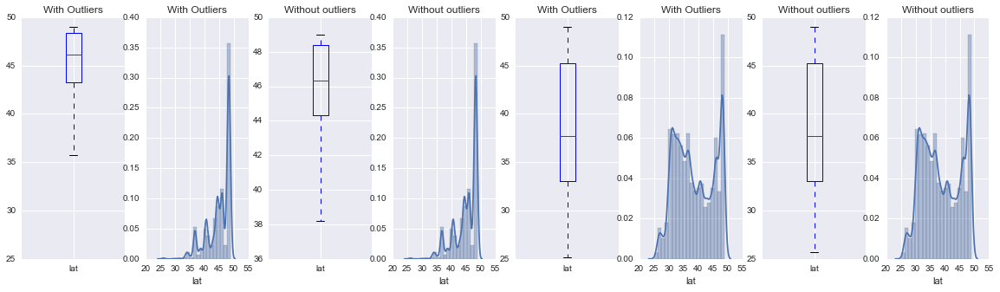

45.1429085656 38.5013249297


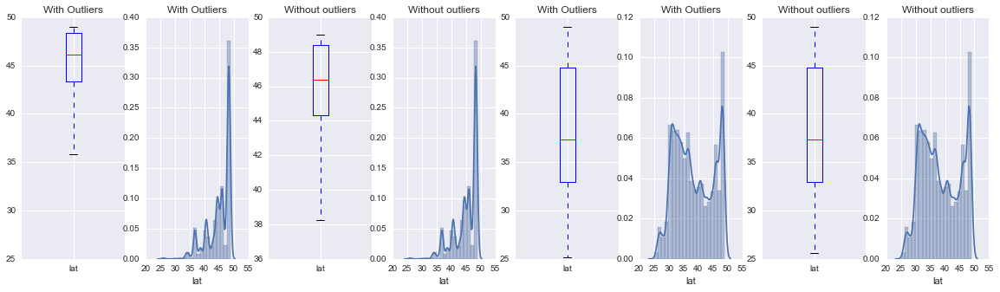

45.157530911 38.4646130682


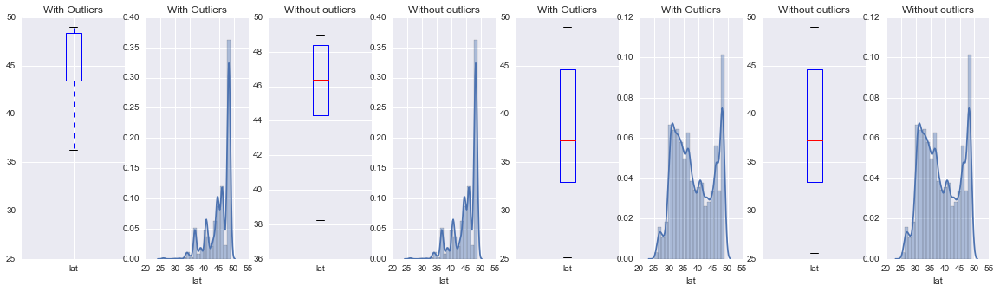

45.1584674622 38.4579865831


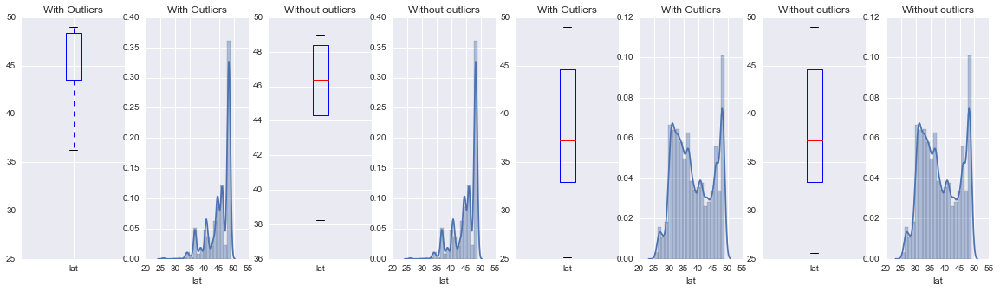

45.1605198882 38.4530743569


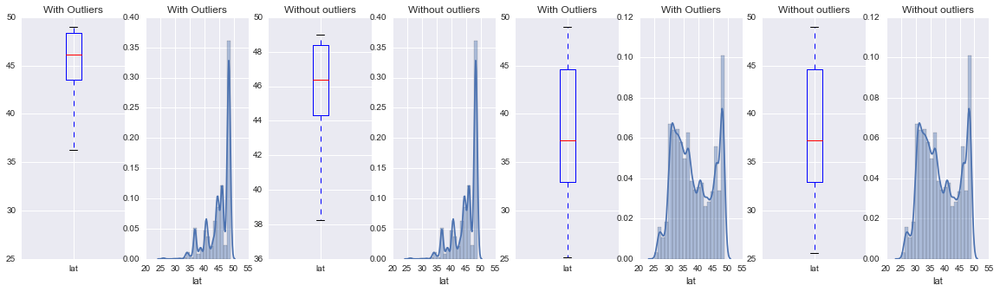

Variable: long : Fires, then non-fires
--------------------------------------------------
-118.93140118 -101.352812417


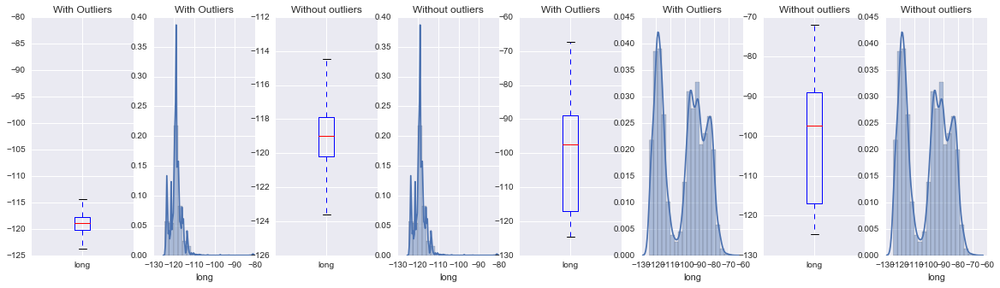

-118.883664012 -100.836514553


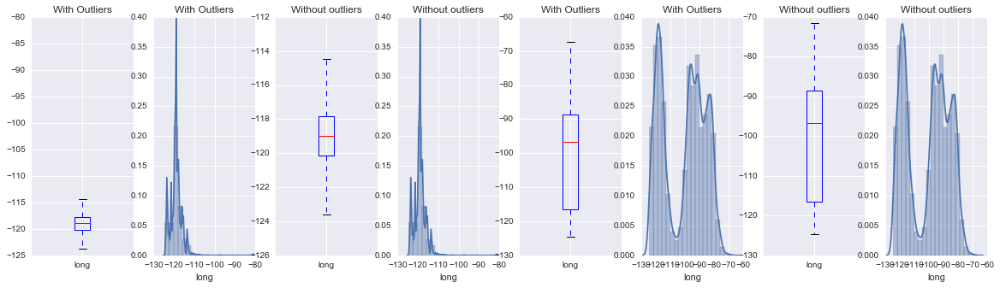

-118.859899989 -100.758262121


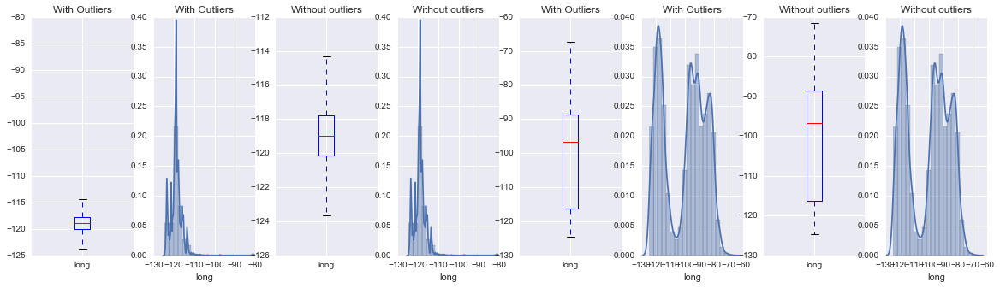

-118.856498287 -100.742357543


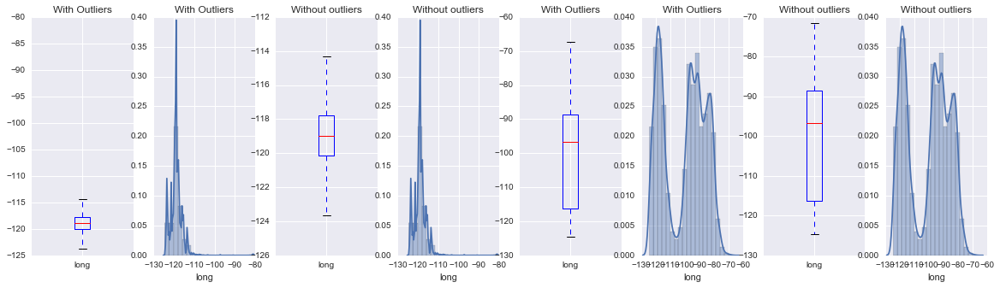

-118.854430812 -100.731673124


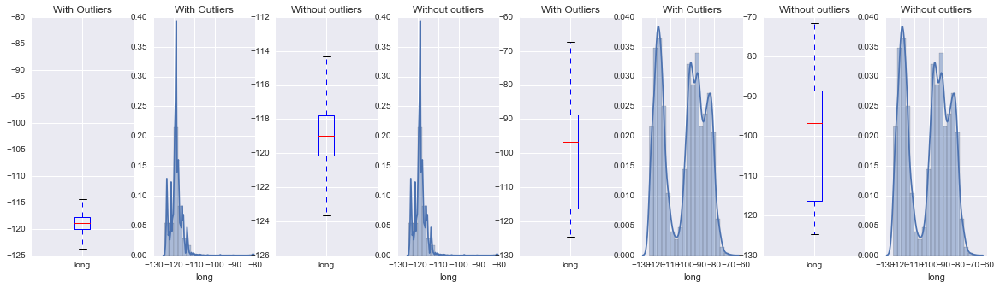

Variable: gmt : Fires, then non-fires
--------------------------------------------------
1306.40513491 1654.6463879


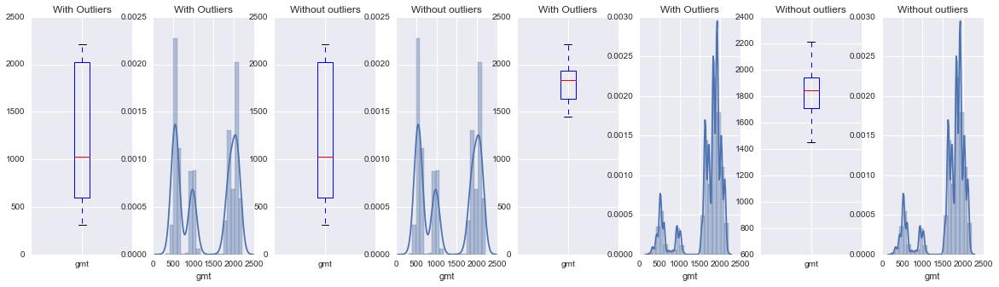

1298.3229374 1667.8744786


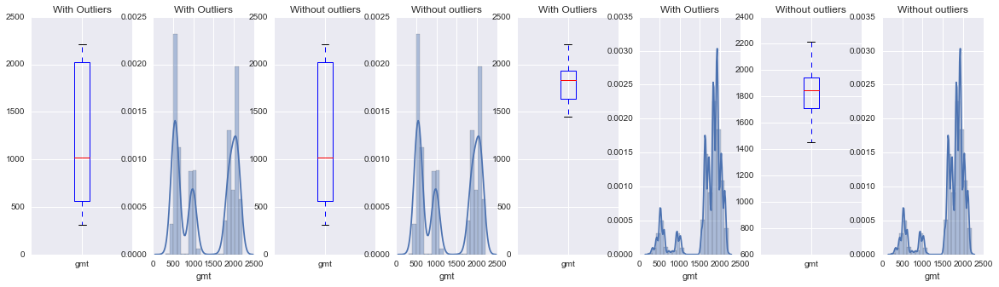

1299.42201385 1669.26943244


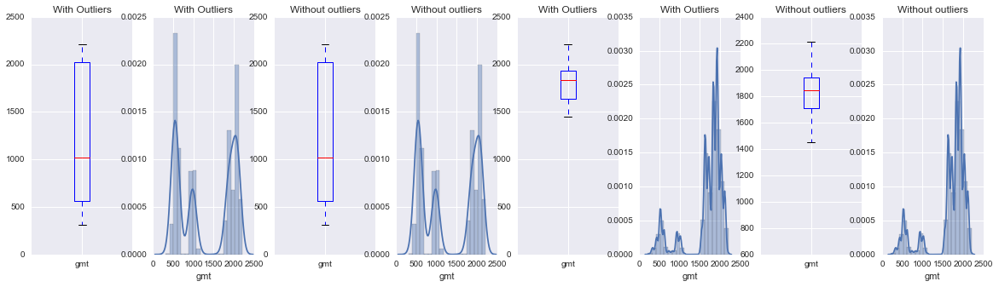

1299.9496575 1669.43865388


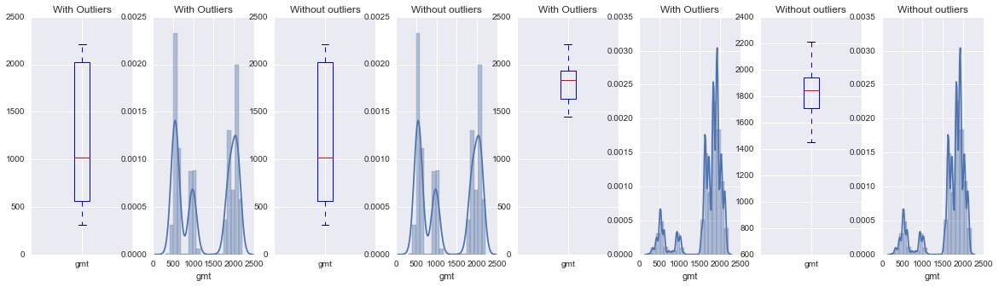

1300.18933145 1669.58928935


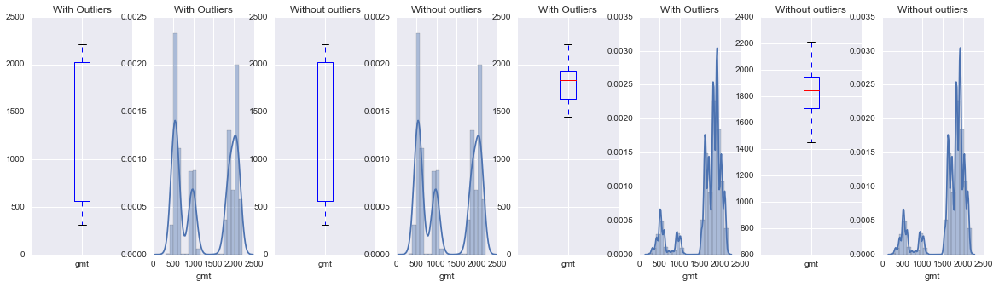

Variable: temp : Fires, then non-fires
--------------------------------------------------
338.779904481 323.530293302


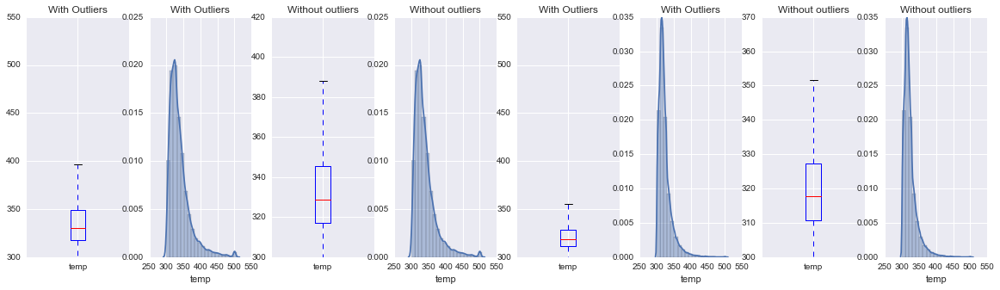

337.983789538 323.333185719


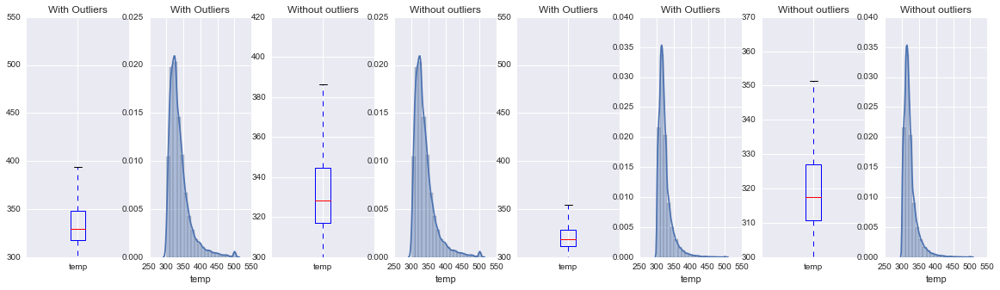

337.808013956 323.322657029


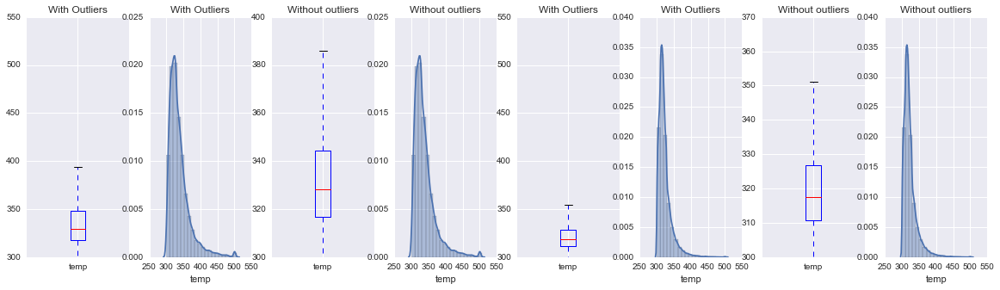

337.763955638 323.323981261


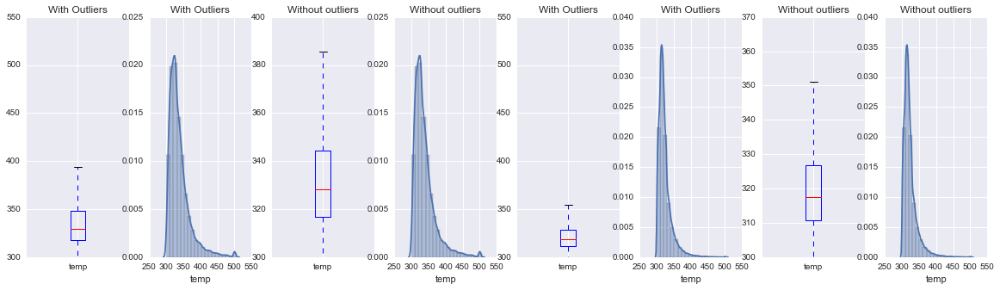

337.735049924 323.324752667


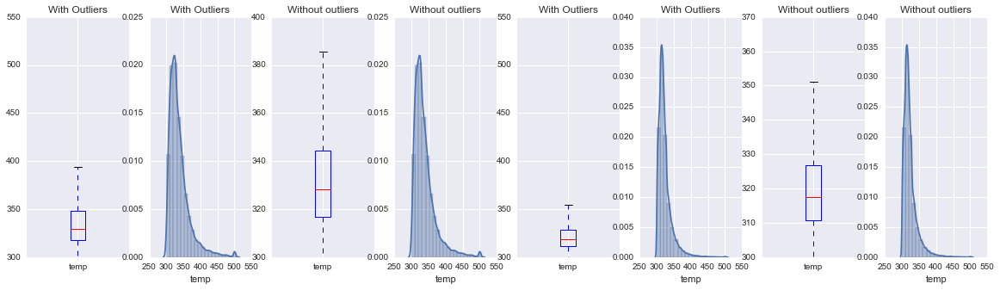

Variable: spix : Fires, then non-fires
--------------------------------------------------
1.62992729596 1.60874644408


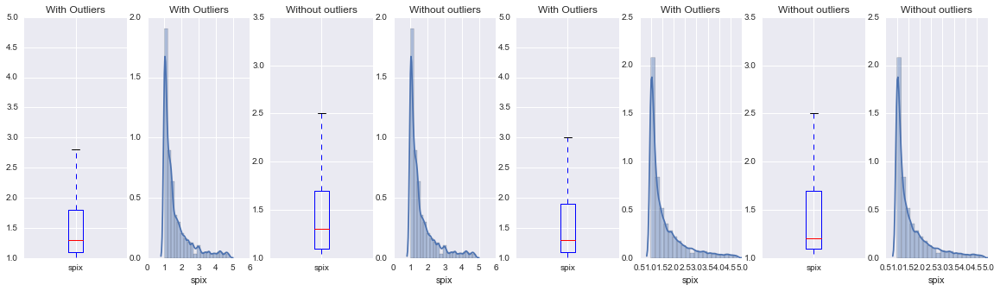

1.637566357 1.60556678488


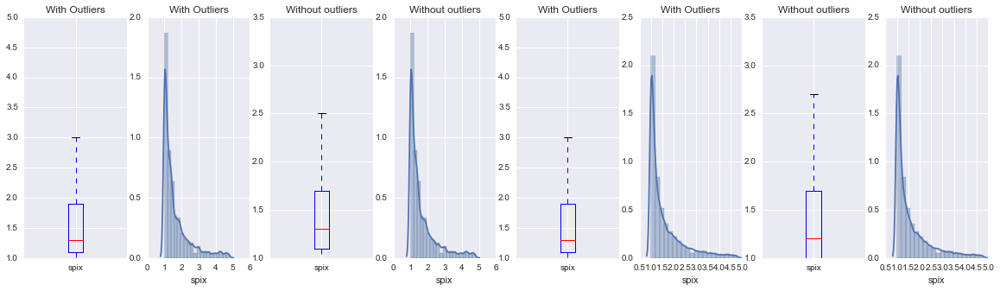

1.63462356212 1.60641039843


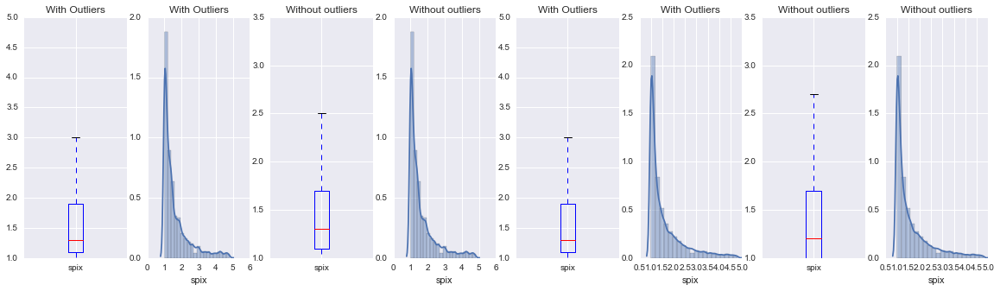

1.63440252256 1.6064589455


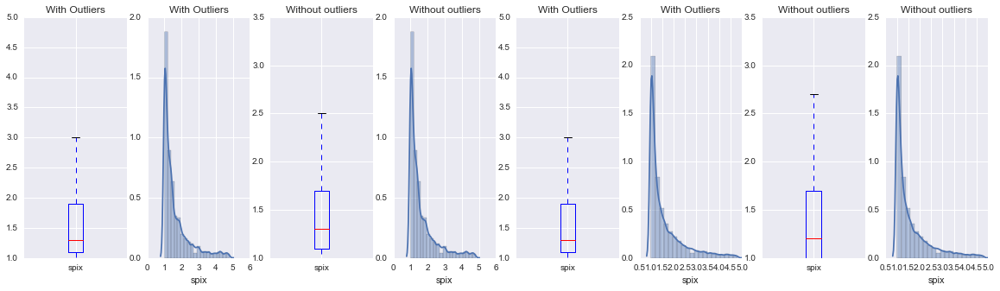

1.63438246147 1.60644821273


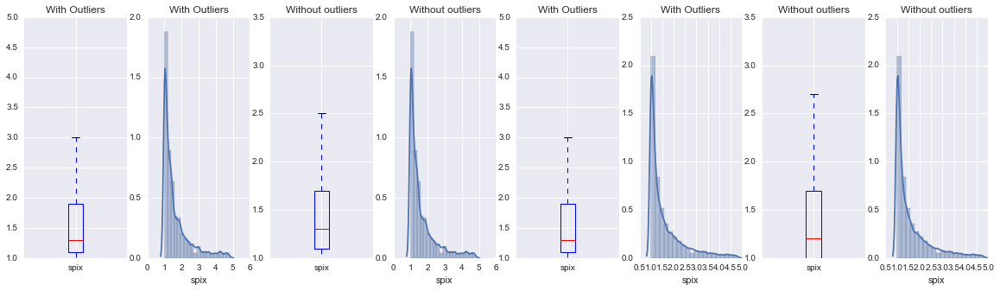

Variable: tpix : Fires, then non-fires
--------------------------------------------------
1.21764365893 1.2113780465


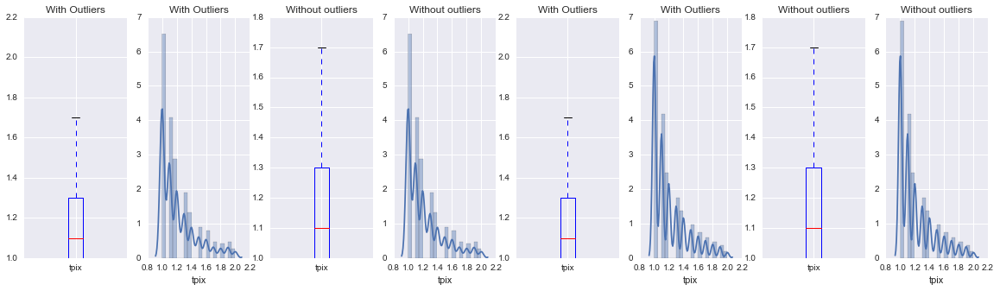

1.22054025658 1.21022583194


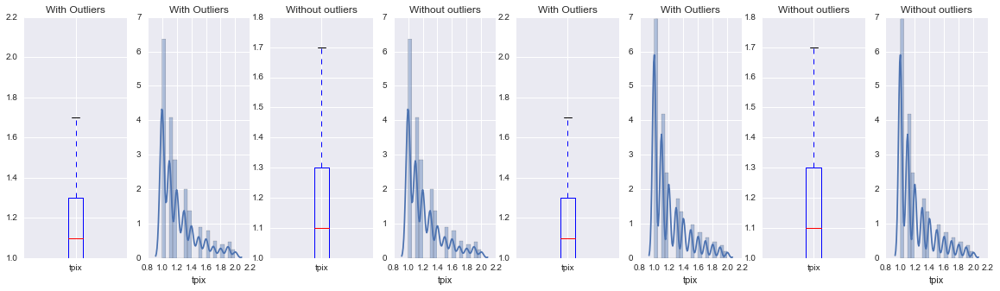

1.21960420869 1.21049351944


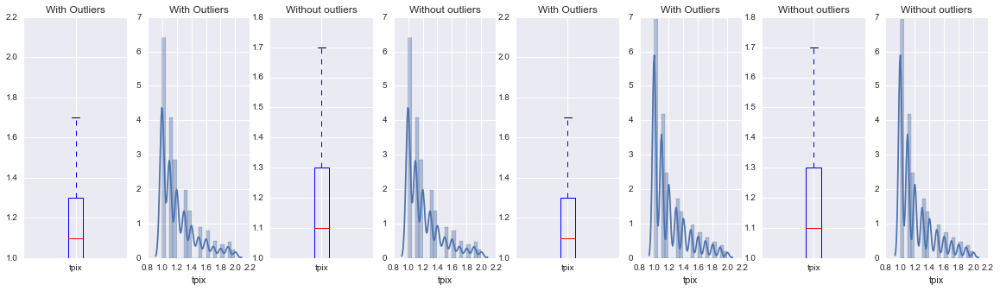

1.21956616288 1.2104978655


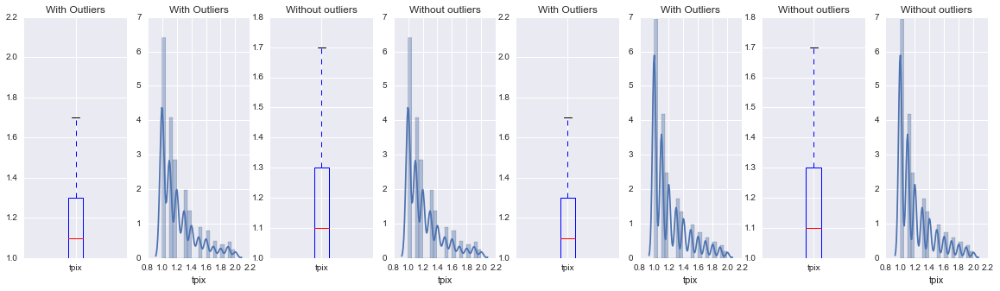

1.21956533536 1.21049244596


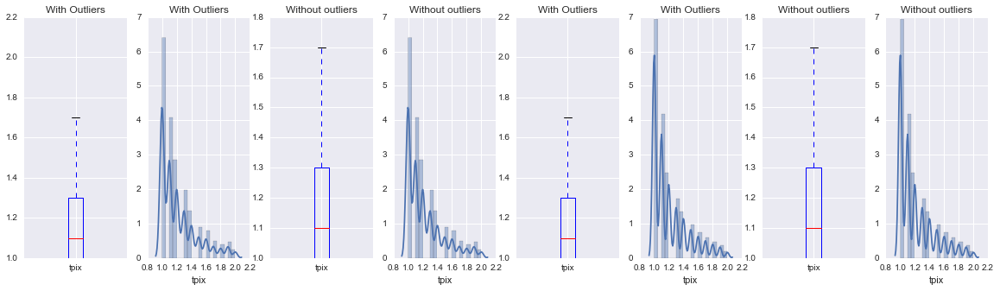

Variable: conf : Fires, then non-fires
--------------------------------------------------
76.992516655 66.541783711


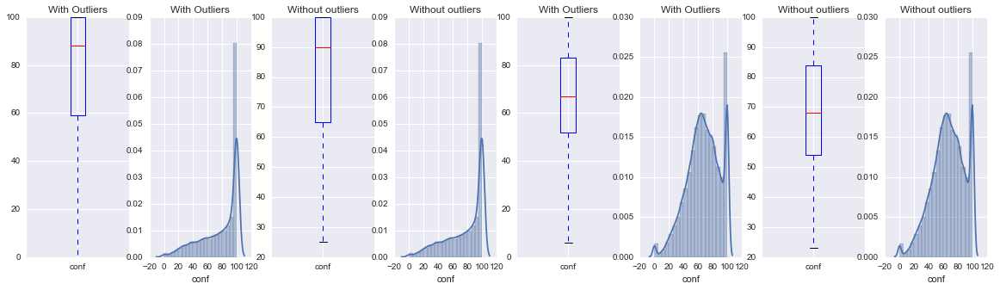

76.4919265649 66.391751346


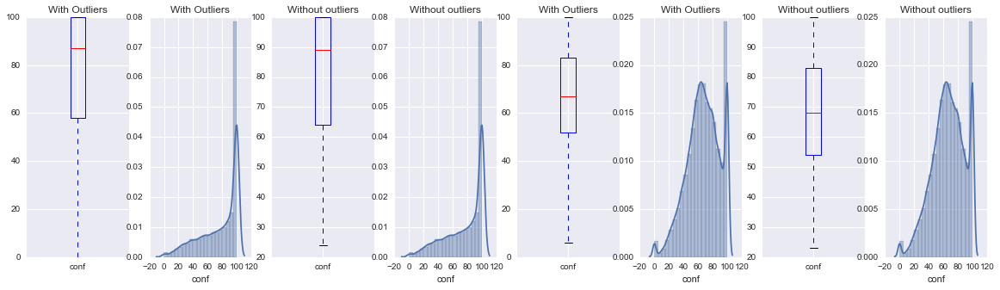

76.356212179 66.3894150881


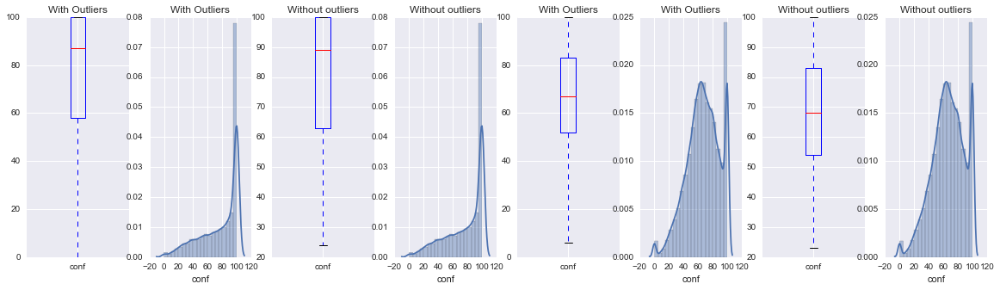

76.3210557791 66.3919720574


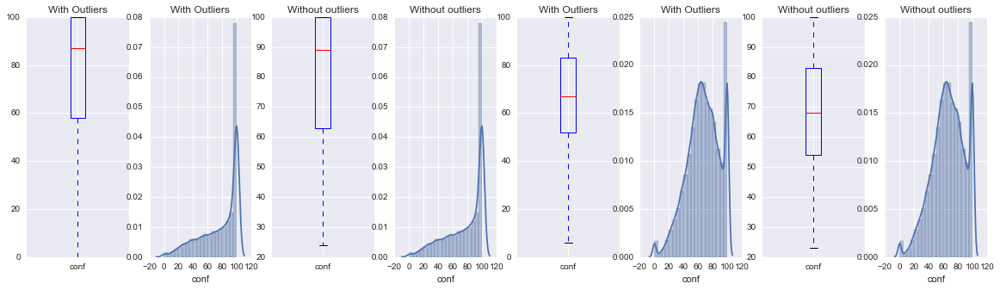

76.3004395485 66.3927547756


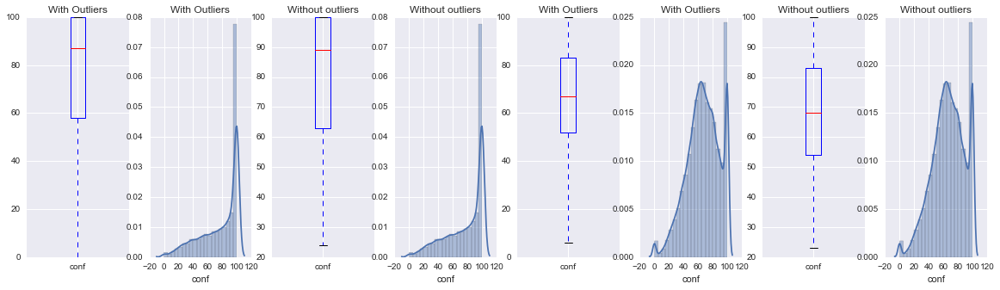

Variable: frp : Fires, then non-fires
--------------------------------------------------
145.895774648 57.5708205142


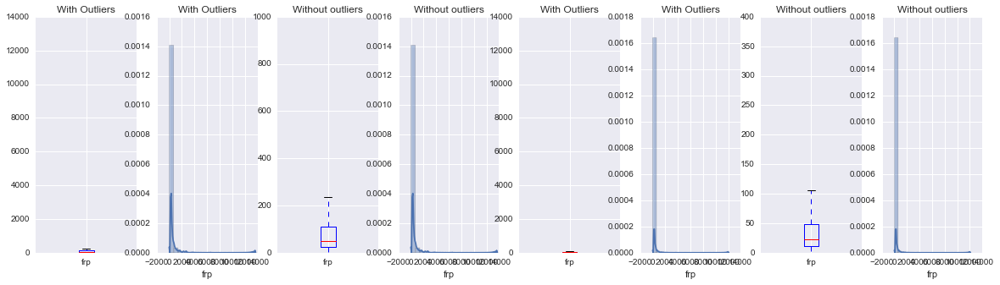

141.255374917 56.4389344187


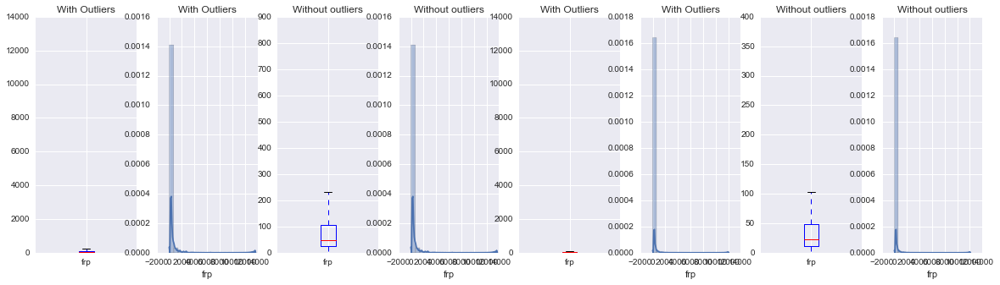

140.111249523 56.4208264097


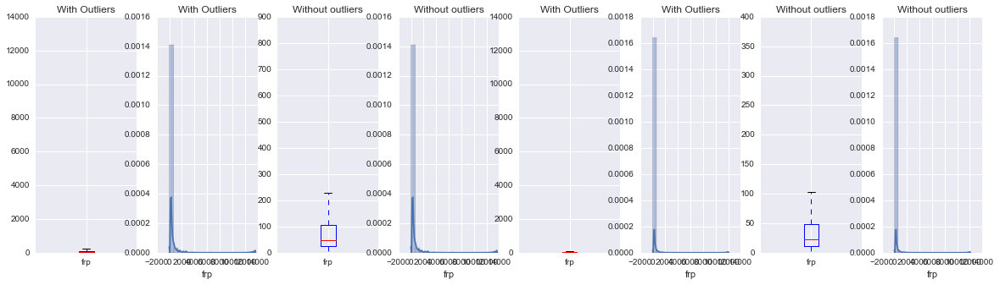

139.842679678 56.4332427787


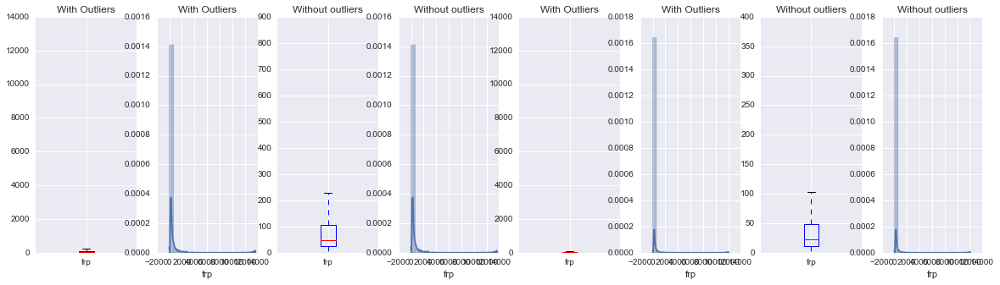

139.668596701 56.4401233426


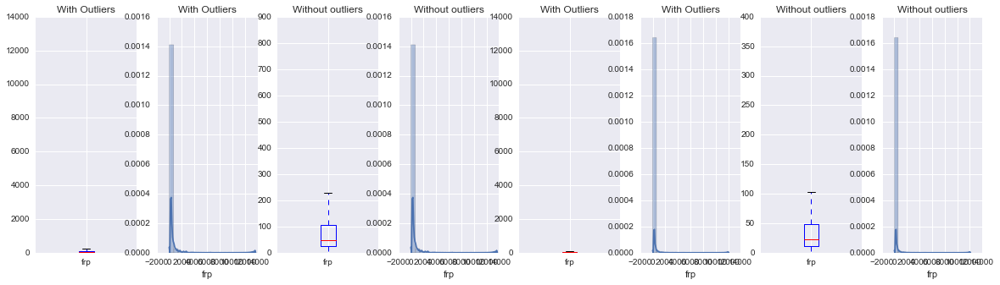

Variable: county_aland : Fires, then non-fires
--------------------------------------------------
11803840648.4 5959351385.96


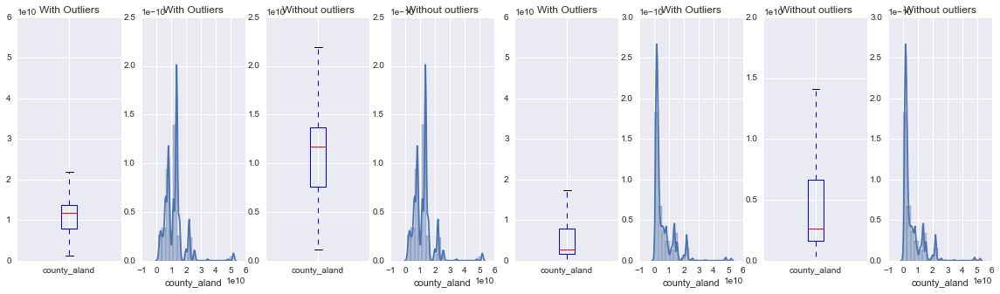

11762013154.3 5796318959.92


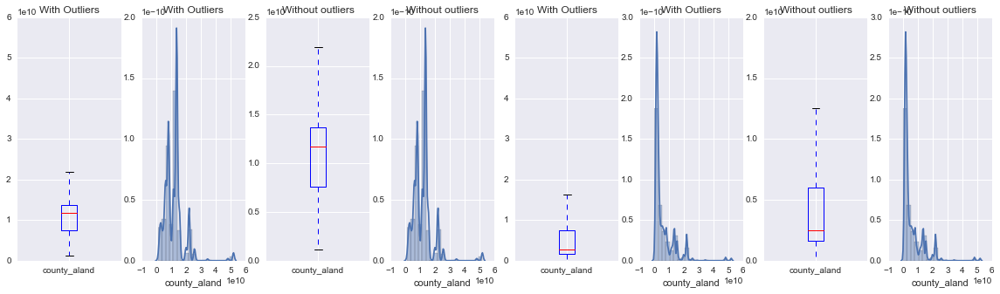

11764304699.3 5767015230.28


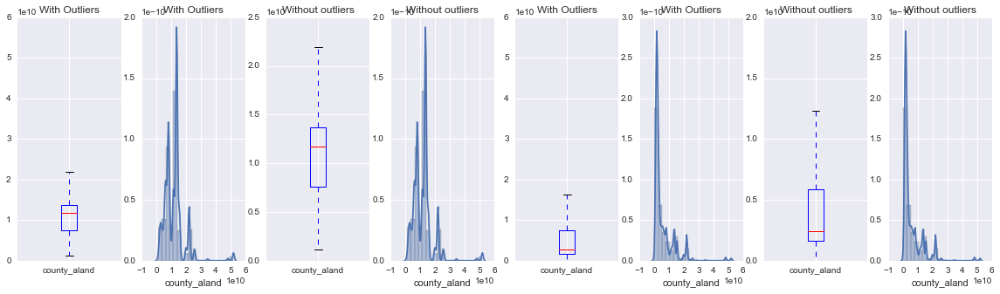

11761223505.4 5762410135.51


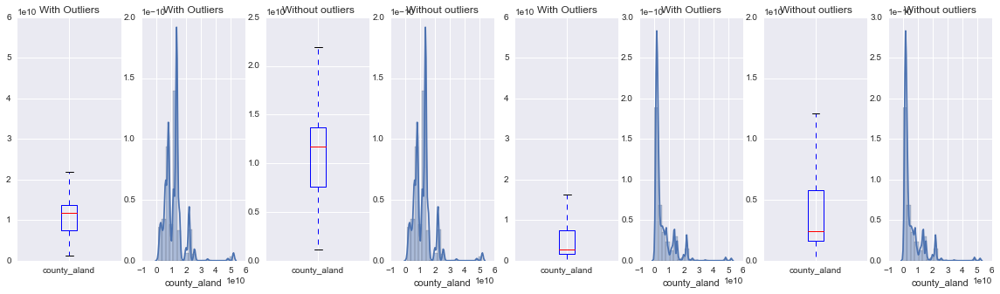

11759702179.0 5759156910.45


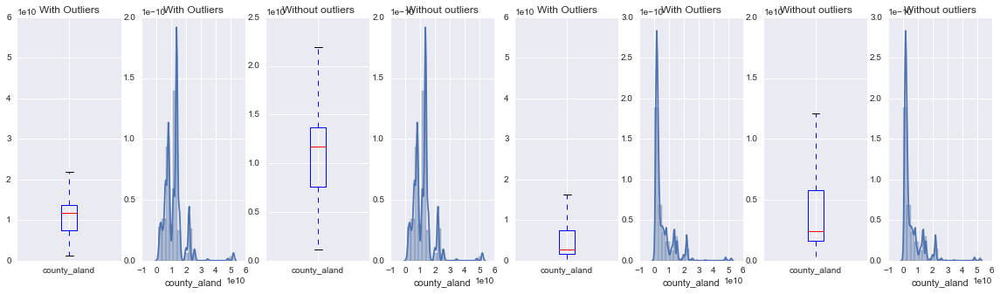

Variable: county_awater : Fires, then non-fires
--------------------------------------------------
144302867.76 155097890.217


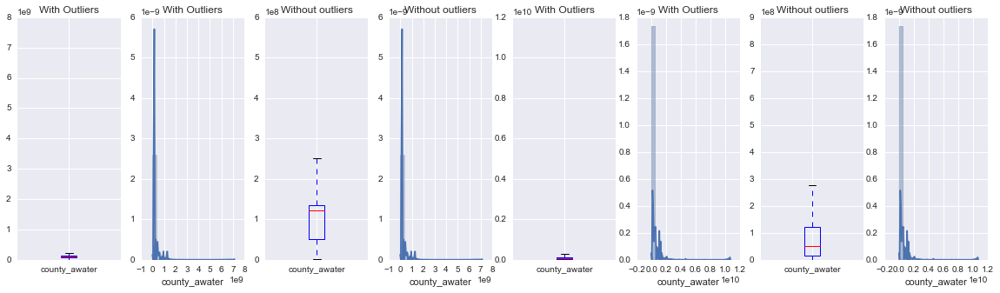

142078201.184 156163943.209


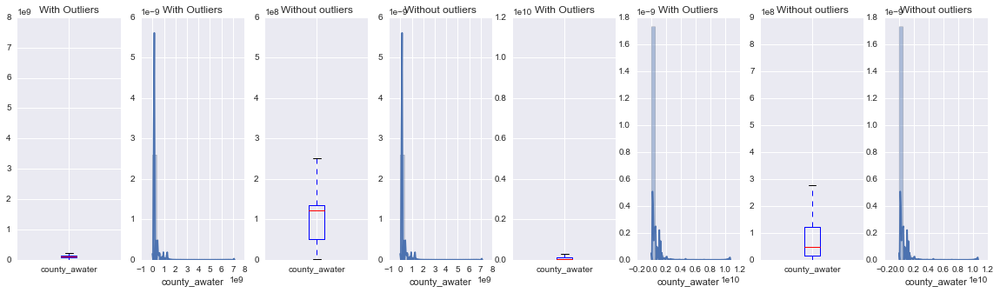

142321139.617 156149024.77


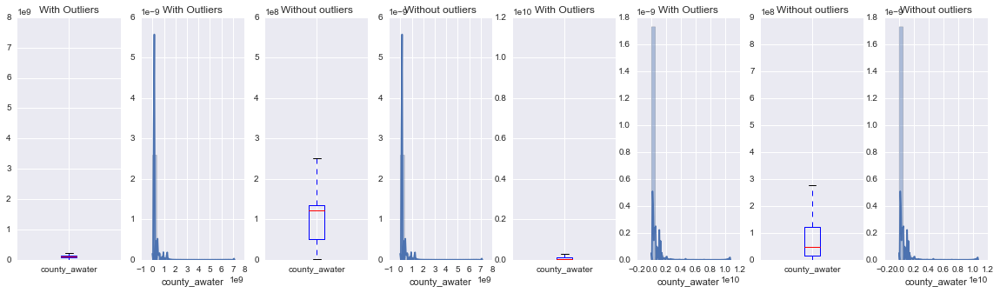

142329247.684 156159301.467


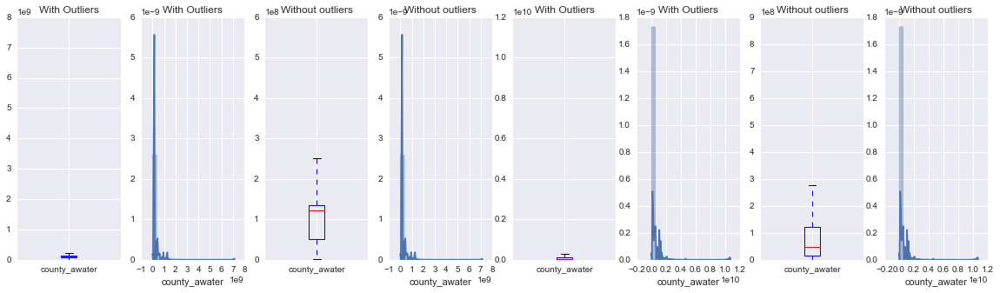

142242771.027 156197465.819


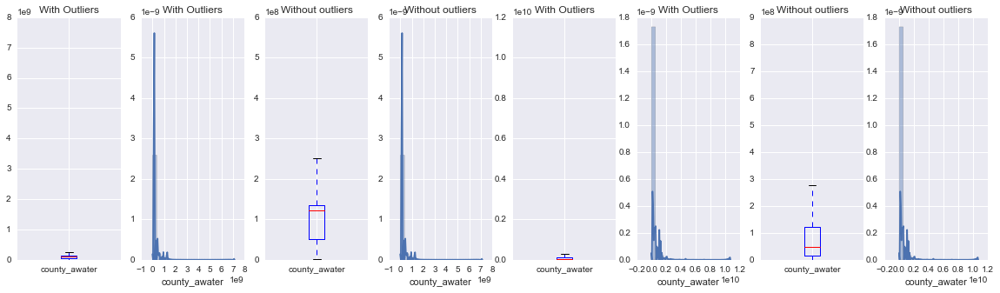

Categorical Vars
--------------------------------------------------
Variable: urban_areas_bool : Fires, then non-fires
--------------------------------------------------


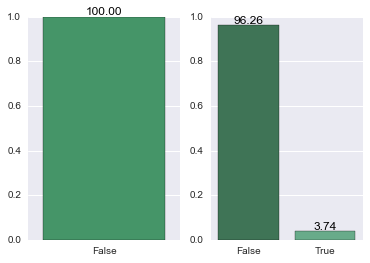

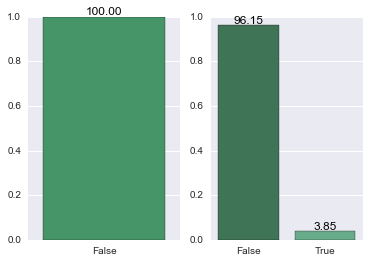

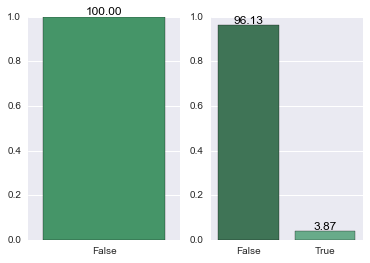

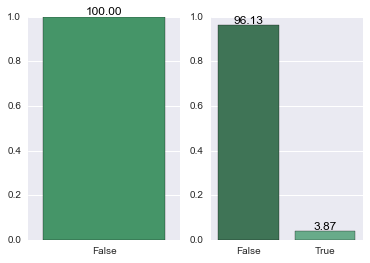

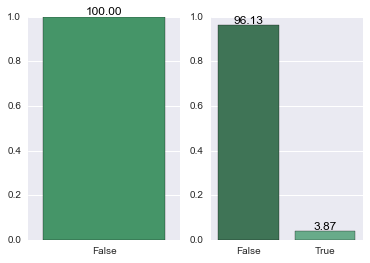

Variable: src : Fires, then non-fires
--------------------------------------------------


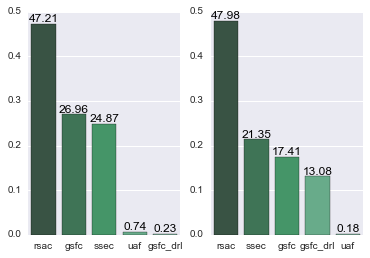

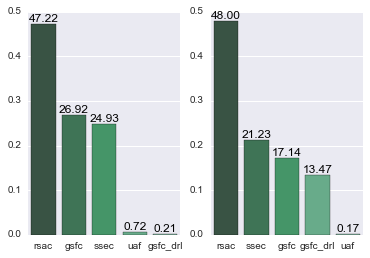

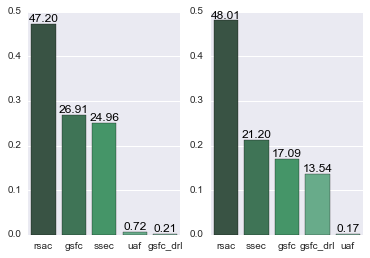

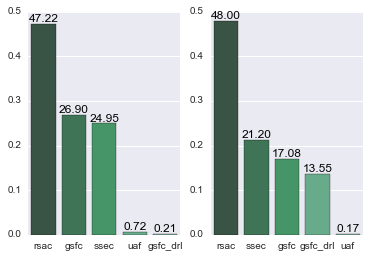

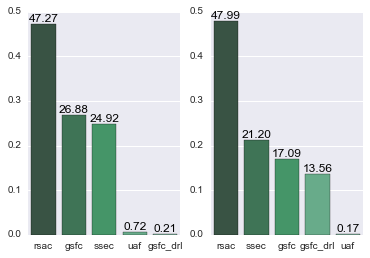

Variable: sat_src : Fires, then non-fires
--------------------------------------------------


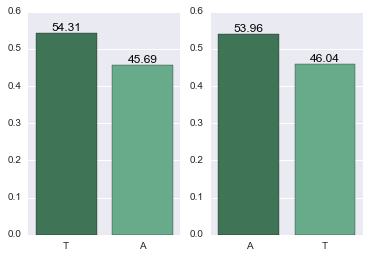

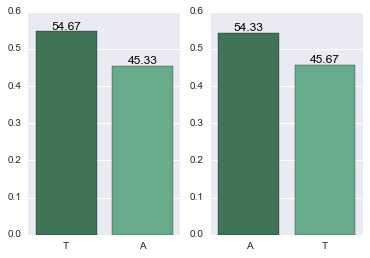

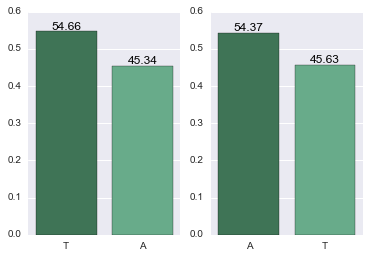

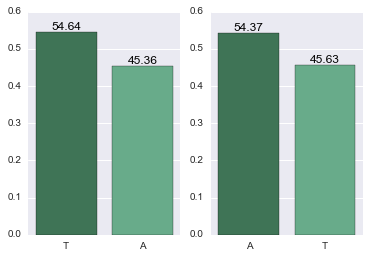

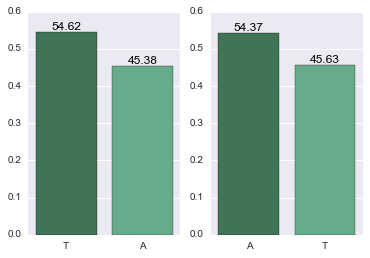

In [52]:
check_dists(2015, continous_vars, categorical_vars)

In the end, none of the distributions across days forward look that different (they aren't really noticeably different). Now, on to looking at what happens if we expand out the fire perimeter boundaries. 